<a href="https://colab.research.google.com/github/AgentRia/Loan-Default-Prediction.AML/blob/main/Medical_insurance_fraud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

During modeling, use age group instead of age? see if this would work

In [ ]:
from google.colab import drive

drive.mount('/content/drive')
%cd /content/drive/My Drive/msc_project/

Mounted at /content/drive
/content/drive/My Drive/msc_project


In [ ]:
import pandas as pd
import numpy as np
import scipy as sc
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import KMeansSMOTE
from sklearn.preprocessing import StandardScaler,MinMaxScaler, RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

import matplotlib.pyplot as plt
import warnings
%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

In [ ]:
#open dataset file from drive

beneficiary = pd.read_csv('Train_Beneficiarydata.csv')

inpatient = pd.read_csv('Train_Inpatientdata.csv')

outpatient = pd.read_csv('Train_Outpatientdata.csv')

provider = pd.read_csv('Train_provider.csv')




In [ ]:
# Create a mapping dictionary for removing the prefix before the column names

rename_mapping = {col: col.replace('ChronicCond_', '') for col in beneficiary.columns if 'ChronicCond_' in col}

# Rename the columns using the mapping
beneficiary.rename(columns=rename_mapping, inplace=True)



In [ ]:
beneficiary.head()

,BeneID,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,...,Depression,Diabetes,IschemicHeart,Osteoporasis,rheumatoidarthritis,stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
0,BENE11001,01/01/1943,NaN,1,1,0,39,230,12,12,...,1,1,1,2,1,1,36000,3204,60,70
1,BENE11002,01/09/1936,NaN,2,1,0,39,280,12,12,...,2,2,2,2,2,2,0,0,30,50
2,BENE11003,01/08/1936,NaN,1,1,0,52,590,12,12,...,2,2,1,2,2,2,0,0,90,40
3,BENE11004,01/07/1922,NaN,1,1,0,39,270,12,12,...,2,1,1,1,1,2,0,0,1810,760
4,BENE11005,01/09/1935,NaN,1,1,0,24,680,12,12,...,2,1,2,2,2,2,0,0,1790,1200


In [ ]:
beneficiary.describe()

,Gender,Race,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,Alzheimer,Heartfailure,KidneyDisease,Cancer,...,Depression,Diabetes,IschemicHeart,Osteoporasis,rheumatoidarthritis,stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
count,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,...,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000,138556.000000
mean,1.570932,1.254511,25.666734,374.424745,11.907727,11.910145,1.667817,1.506322,1.687643,1.880041,...,1.644476,1.398142,1.324143,1.725317,1.743180,1.920942,3660.346502,399.847296,1298.219348,377.718258
std,0.494945,0.717007,15.223443,266.277581,1.032332,0.936893,0.470998,0.499962,0.463456,0.324914,...,0.478674,0.489517,0.468056,0.446356,0.436881,0.269831,9568.621827,956.175202,2493.901134,645.530187
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-8000.000000,0.000000,-70.000000,0.000000
25%,1.000000,1.000000,11.000000,141.000000,12.000000,12.000000,1.000000,1.000000,1.000000,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,170.000000,40.000000
50%,2.000000,1.000000,25.000000,340.000000,12.000000,12.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,1.000000,1.000000,2.000000,2.000000,2.000000,0.000000,0.000000,570.000000,170.000000
75%,2.000000,1.000000,39.000000,570.000000,12.000000,12.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2280.000000,1068.000000,1500.000000,460.000000
max,2.000000,5.000000,54.000000,999.000000,12.000000,12.000000,2.000000,2.000000,2.000000,2.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,161470.000000,38272.000000,102960.000000,13840.000000


DATA PREPROCESSING

In [ ]:
# Convert date columns to datetime format

beneficiary['DOB'] = pd.to_datetime(beneficiary['DOB'])
beneficiary['DOD'] = pd.to_datetime(beneficiary['DOD'])

In [ ]:
beneficiary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138556 entries, 0 to 138555
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   BeneID                    138556 non-null  object        
 1   DOB                       138556 non-null  datetime64[ns]
 2   DOD                       1421 non-null    datetime64[ns]
 3   Gender                    138556 non-null  int64         
 4   Race                      138556 non-null  int64         
 5   RenalDiseaseIndicator     138556 non-null  object        
 6   State                     138556 non-null  int64         
 7   County                    138556 non-null  int64         
 8   NoOfMonths_PartACov       138556 non-null  int64         
 9   NoOfMonths_PartBCov       138556 non-null  int64         
 10  Alzheimer                 138556 non-null  int64         
 11  Heartfailure              138556 non-null  int64         
 12  Ki

In [ ]:
bene_df = beneficiary

In [ ]:
beneficiary.shape

(138556, 25)

<ipython-input-11-7ea4199169c3>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='DeathStatus', data=beneficiary, palette=['#023047', '#8ecae6'])


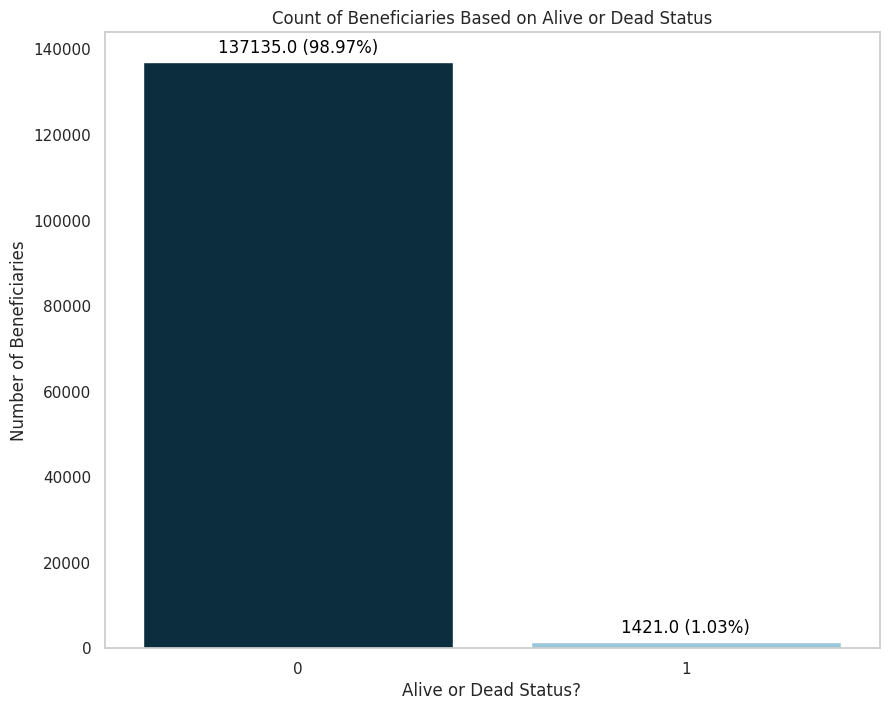

In [ ]:

# Assuming beneficiary is the DataFrame containing beneficiary information

# Calculate beneficiary age and death status
beneficiary['Age'] = ((beneficiary['DOD'].fillna(beneficiary['DOD'].max()) - beneficiary['DOB']).dt.days) // 365.0
beneficiary['DeathStatus'] = beneficiary['DOD'].notnull().astype(int)

# Visualize death status
sns.set(style="whitegrid")
plt.figure(figsize=(10, 8))
ax = sns.countplot(x='DeathStatus', data=beneficiary, palette=['#023047', '#8ecae6'])

# Calculate percentage and annotate the plot
total = len(beneficiary)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height} ({height/total*100:.2f}%)',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=12, color='black')

plt.xlabel("Alive or Dead Status?")
plt.ylabel("Number of Beneficiaries")
plt.title("Count of Beneficiaries Based on Alive or Dead Status")
plt.grid(False)

# Show the plot
plt.show()




In [ ]:
# Drop unnecessary columns
beneficiary.drop(labels=['DOD'], axis=1, inplace=True)

In [ ]:
beneficiary.columns

Index(['BeneID', 'DOB', 'Gender', 'Race', 'RenalDiseaseIndicator', 'State',
       'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov', 'Alzheimer',
       'Heartfailure', 'KidneyDisease', 'Cancer', 'ObstrPulmonary',
       'Depression', 'Diabetes', 'IschemicHeart', 'Osteoporasis',
       'rheumatoidarthritis', 'stroke', 'IPAnnualReimbursementAmt',
       'IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt',
       'OPAnnualDeductibleAmt', 'Age', 'DeathStatus'],
      dtype='object')

In [ ]:
# Categorize the beneficiary age into age groups ('Young', 'Mid', 'Old', or 'Very Old') for further analysis

# Define age groups and bins
bins = [0, 40, 60, 80, float('inf')]
labels = ['Young', 'Mid', 'Old', 'Very Old']

#
beneficiary['ageGrp'] = pd.cut(beneficiary['Age'], bins=bins, labels=labels, right=False)


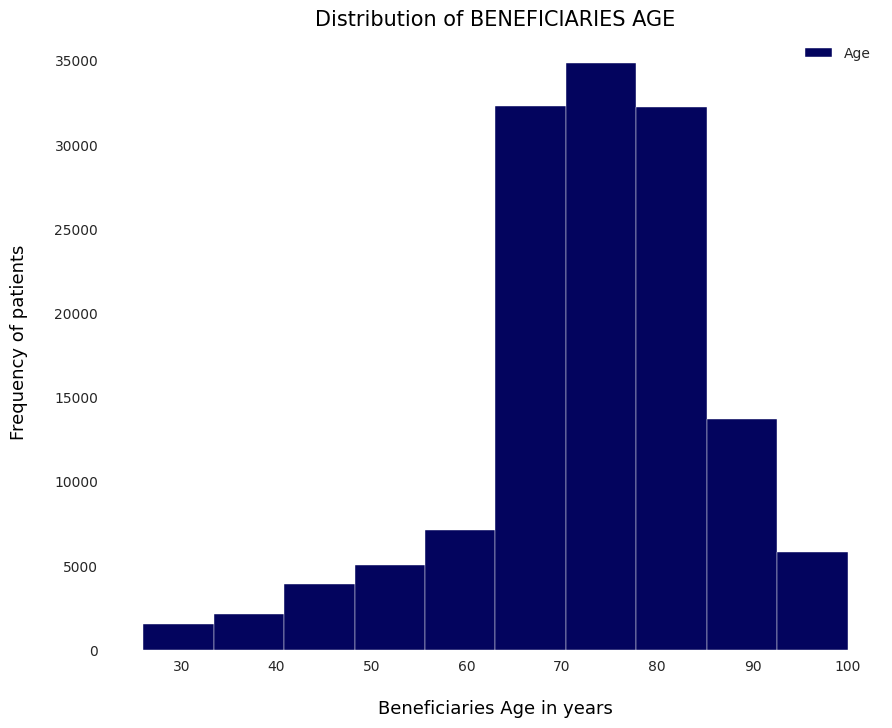

In [ ]:
with plt.style.context('seaborn'):
  plt.figure(figsize=(10,8))
  beneficiary['Age'].plot(kind='hist', color='#03045e')


  # Labels
  plt.xlabel("\nBeneficiaries Age in years", color= '#000000', fontsize = 13)
  plt.ylabel("Frequency of patients\n", color= '#000000', fontsize = 13)
  plt.grid(which='major', linestyle="--", color='#ffffff')
  plt.minorticks_on()
  plt.gca().set_facecolor('white')
  plt.title("Distribution of BENEFICIARIES AGE", color= '#000000', fontsize = 15)
  plt.legend();

  plt.grid(False)

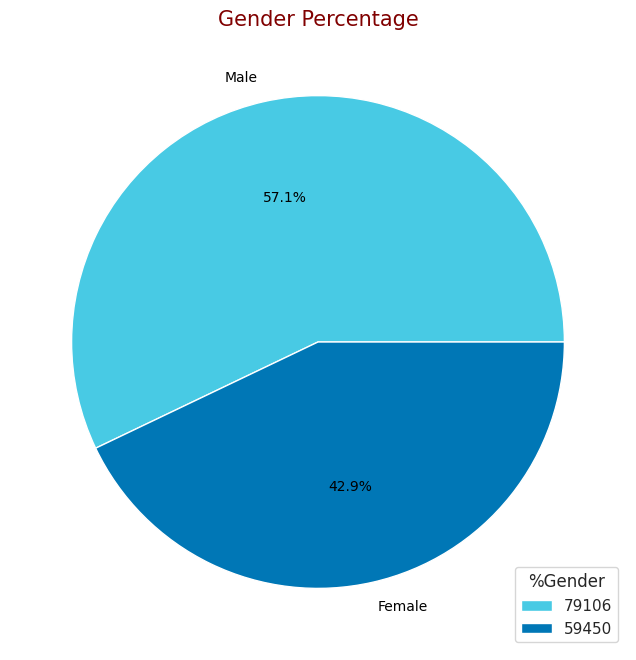

In [ ]:
# distribution by gender

labels = ['Male', 'Female']

sizes = beneficiary['Gender'].value_counts()

colors = ['#48cae4', '#0077b6']

plt.figure(figsize = (8,8))

plt.pie(sizes, labels=labels, autopct='%1.1f%%', textprops={'fontsize':10, 'color':"black"}, colors = colors)

plt.title('Gender Percentage',color = '#800000',fontsize = 15)

plt.legend(beneficiary['Gender'].value_counts(), loc = 'lower right', title = '%Gender')
plt.show()

In [ ]:
#Replace values with 0 to indicate that the beneficiary doesn't have the condition

# List of columns to update
columns_to_update = ['Alzheimer', 'Heartfailure', 'KidneyDisease', 'Cancer', 'ObstrPulmonary',
                     'Depression', 'Diabetes', 'IschemicHeart', 'Osteoporasis',
                     'rheumatoidarthritis', 'stroke']

# Replace '2' with '0' in the specified columns
beneficiary[columns_to_update] = beneficiary[columns_to_update].replace(2, 0)


UNIVARIATE ANALYSIS OF THE BENEFICIARY DATASET

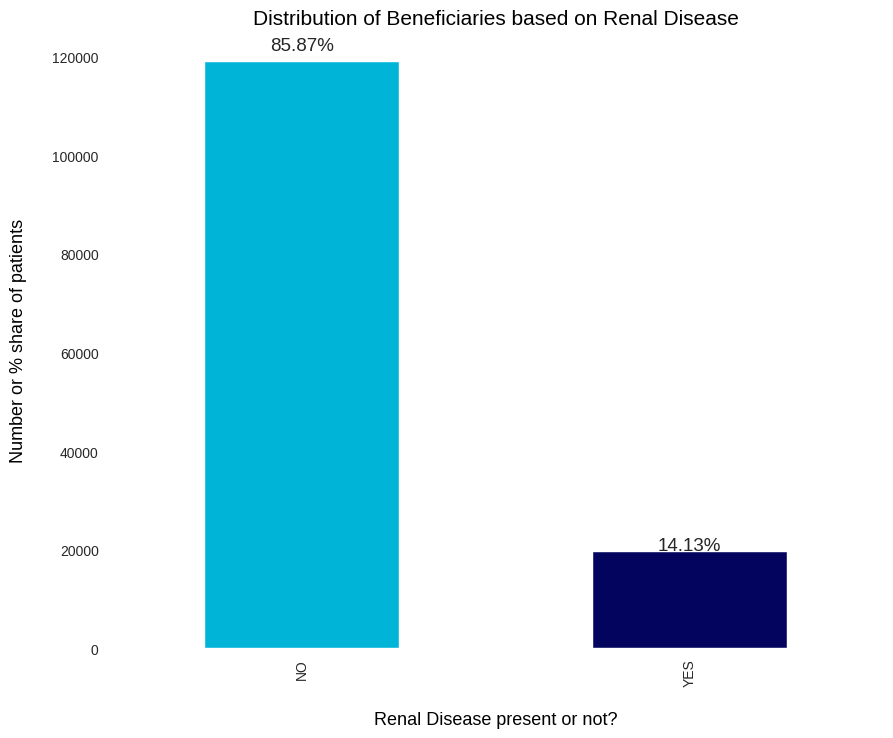

   RenalDiseaseIndicator
0                 118978
Y                  19578 



In [ ]:
#Univariate Analysis of beneficiary medical conditions

def plot_condition_distribution(beneficiary, condition_column, condition_name):
    # Examine beneficiaries with the specified medical condition
    color = ['#00b4d8', '#03045e']

    with plt.style.context('seaborn'):
        plt.figure(figsize=(10, 8))
        fig = beneficiary[condition_column].value_counts().plot(kind='bar', color=color)

        # Use the "patches" function to get the location of the rectangle bars from the graph.
        for p in fig.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            fig.annotate(f'{str(round((height*100)/beneficiary.shape[0], 2))+"%"}',
                         (x + width/2, y + height*1.02), ha='center', fontsize=13.5, rotation=0)

        # Labels
        plt.xlabel(f"\n{condition_name} present or not?", color="#000", fontsize=13)
        plt.xticks(labels=["NO", "YES"], ticks=[0, 1], size=10)
        plt.ylabel("Number or % share of patients\n", color="#000", fontsize=13)

        plt.gca().set_facecolor('white')
        plt.grid(False)
        plt.title(f"Distribution of Beneficiaries based on {condition_name}", color="#000", fontsize=15)

        plt.show()
        print(pd.DataFrame(beneficiary[condition_column].value_counts()), "\n")

# Examine beneficiaries based on RenalDiseaseIndicator
plot_condition_distribution(beneficiary, 'RenalDiseaseIndicator', 'Renal Disease')


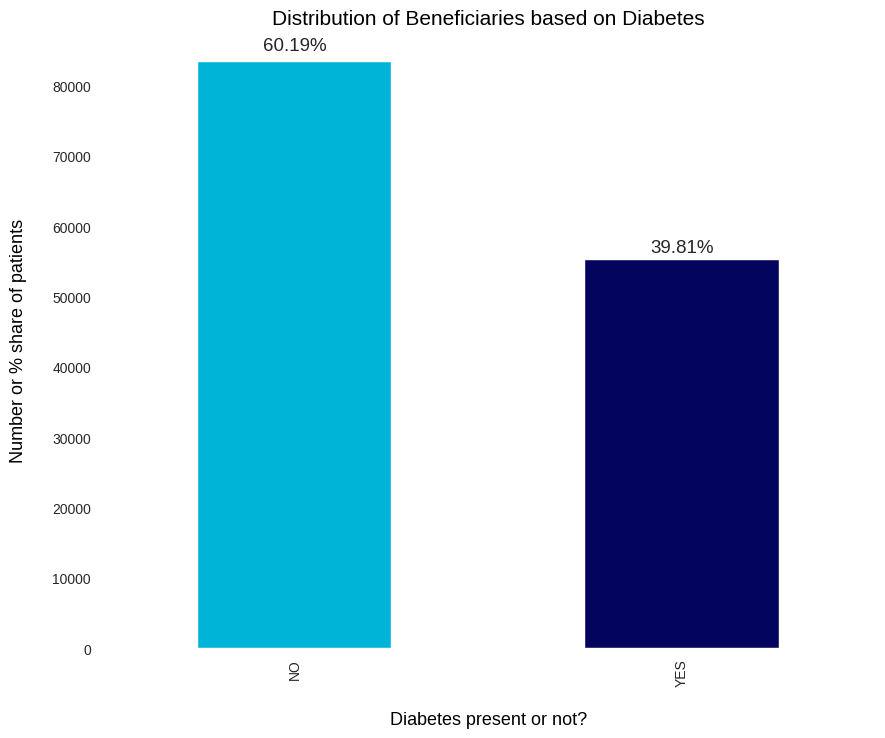

   Diabetes
1     83391
0     55165 



In [ ]:
# Examine beneficiaries with Diabetes
plot_condition_distribution(beneficiary, 'Diabetes', 'Diabetes')


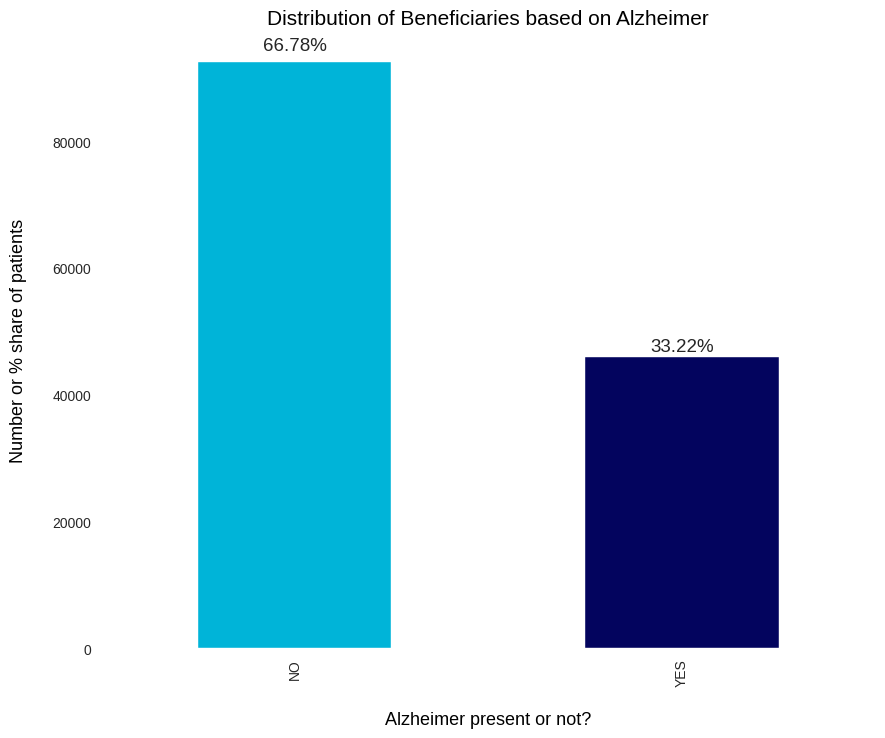

   Alzheimer
0      92530
1      46026 



In [ ]:
# Examine beneficiaries with Alzheimer
plot_condition_distribution(beneficiary, 'Alzheimer', 'Alzheimer')


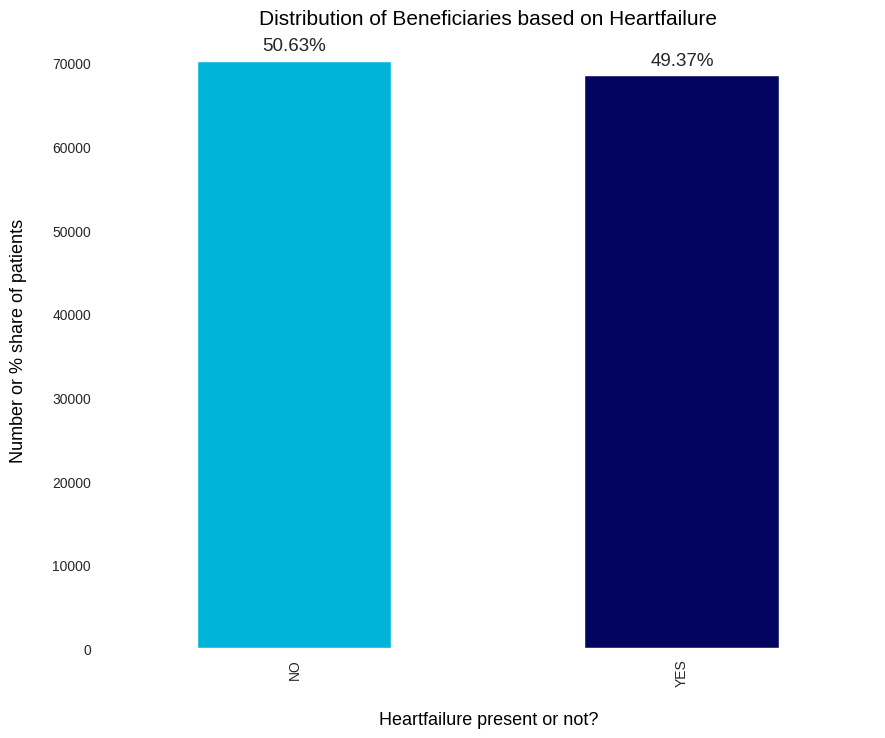

   Heartfailure
0         70154
1         68402 



In [ ]:
# Examine beneficiaries with Heartfailure
plot_condition_distribution(beneficiary, 'Heartfailure', 'Heartfailure')

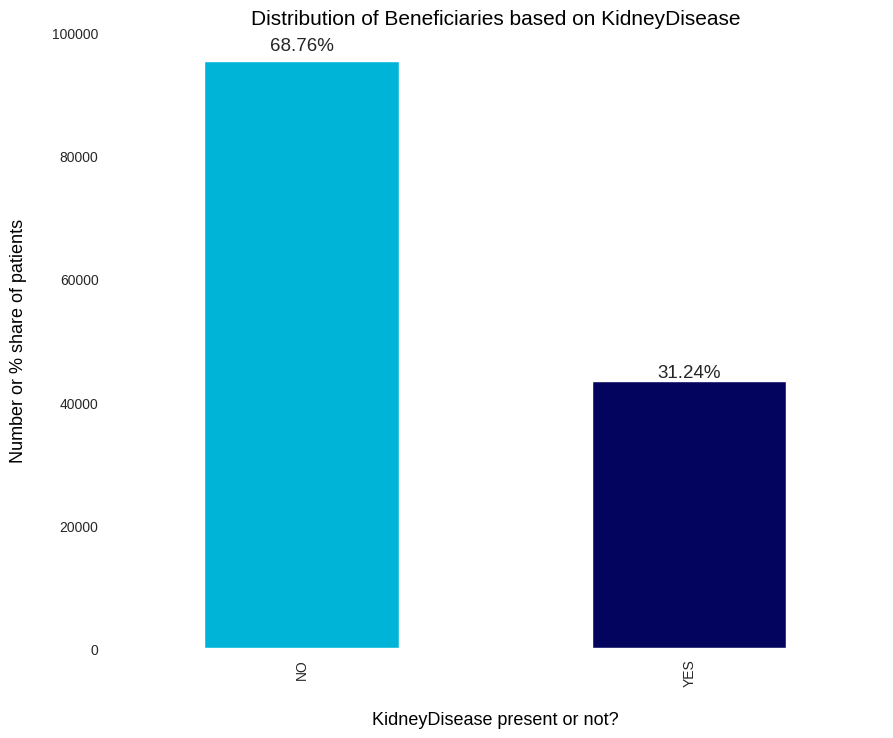

   KidneyDisease
0          95277
1          43279 



In [ ]:
# Examine beneficiaries with KidneyDisease
plot_condition_distribution(beneficiary, 'KidneyDisease', 'KidneyDisease')

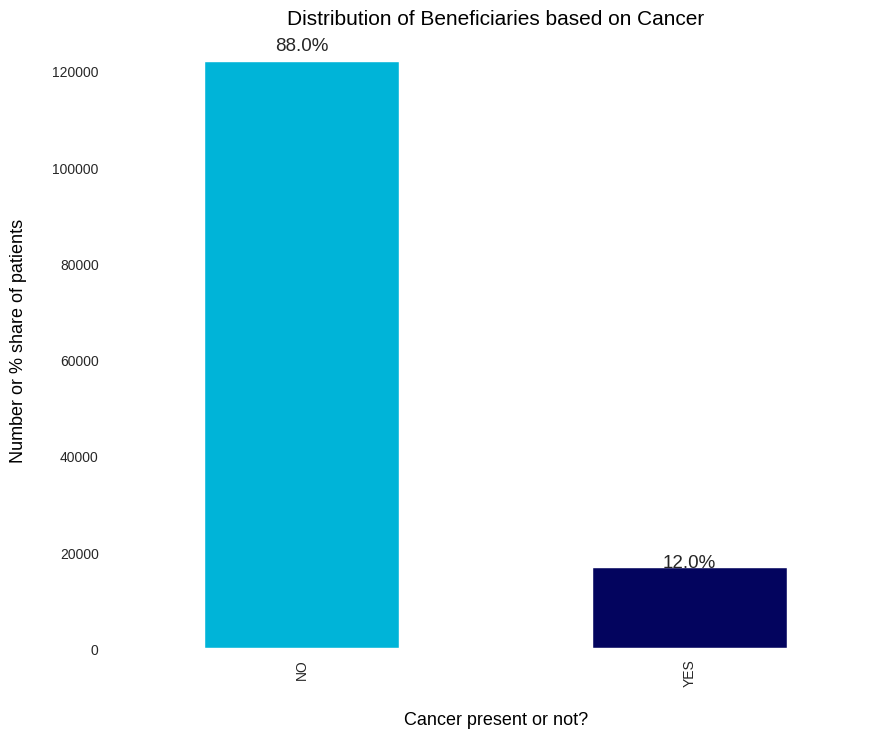

   Cancer
0  121935
1   16621 



In [ ]:
# Examine beneficiaries with Cancer
plot_condition_distribution(beneficiary, 'Cancer', 'Cancer')

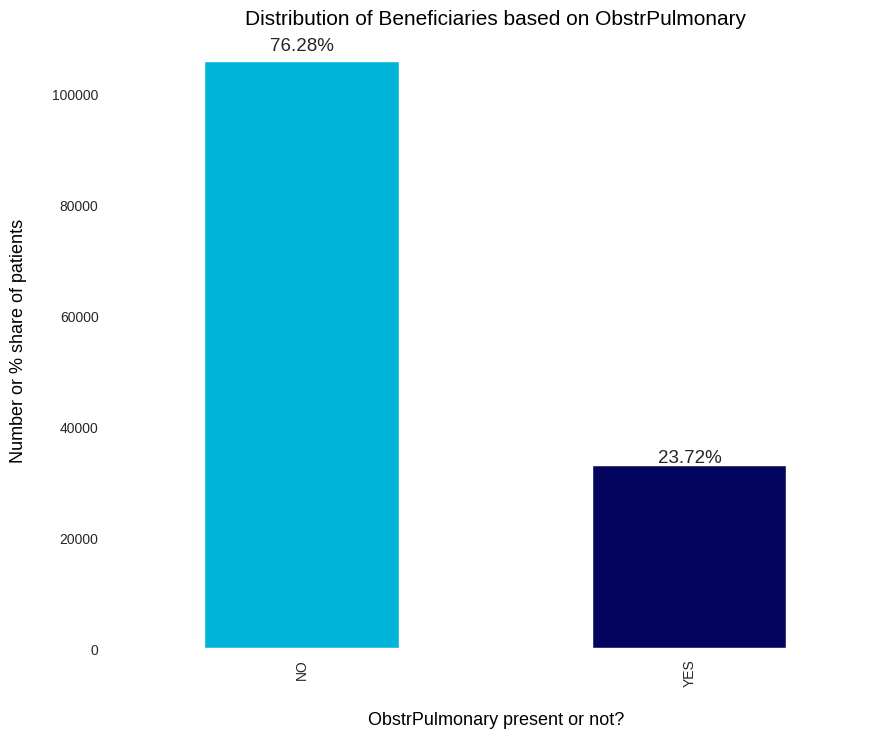

   ObstrPulmonary
0          105697
1           32859 



In [ ]:
# Examine beneficiaries with ObstrPulmonary
plot_condition_distribution(beneficiary, 'ObstrPulmonary', 'ObstrPulmonary')

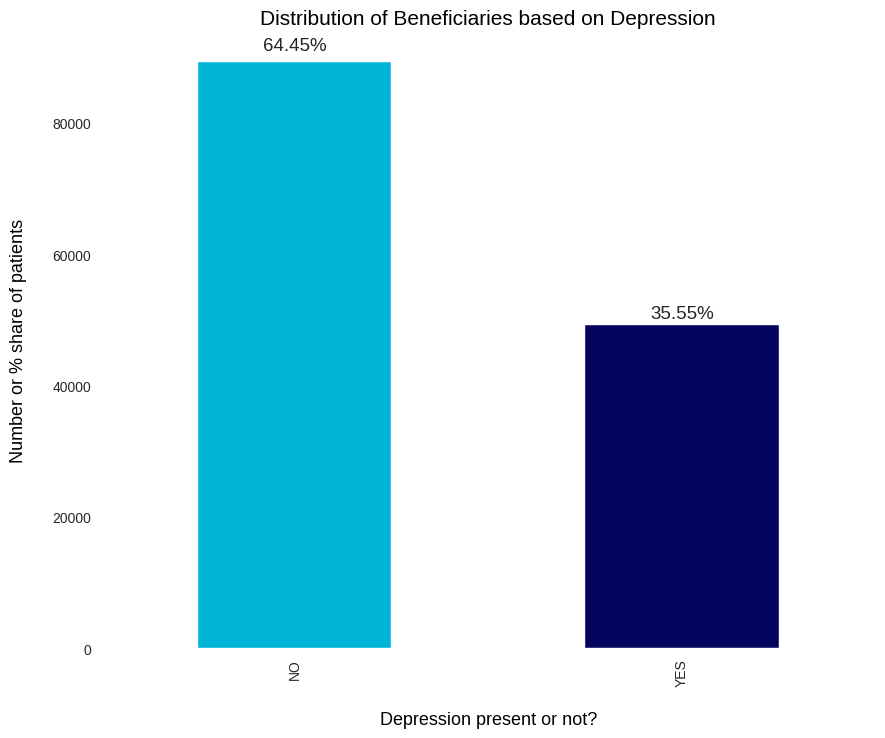

   Depression
0       89296
1       49260 



In [ ]:
# Examine beneficiaries with Depression
plot_condition_distribution(beneficiary, 'Depression', 'Depression')

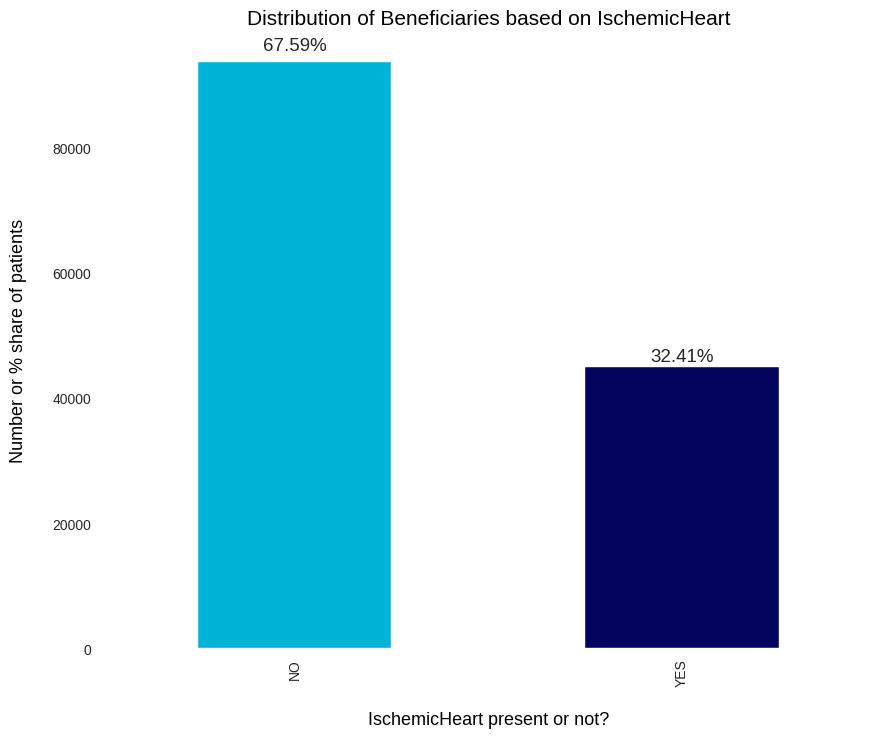

   IschemicHeart
1          93644
0          44912 



In [ ]:
# Examine beneficiaries with  'IschemicHeart'
plot_condition_distribution(beneficiary,  'IschemicHeart',  'IschemicHeart')

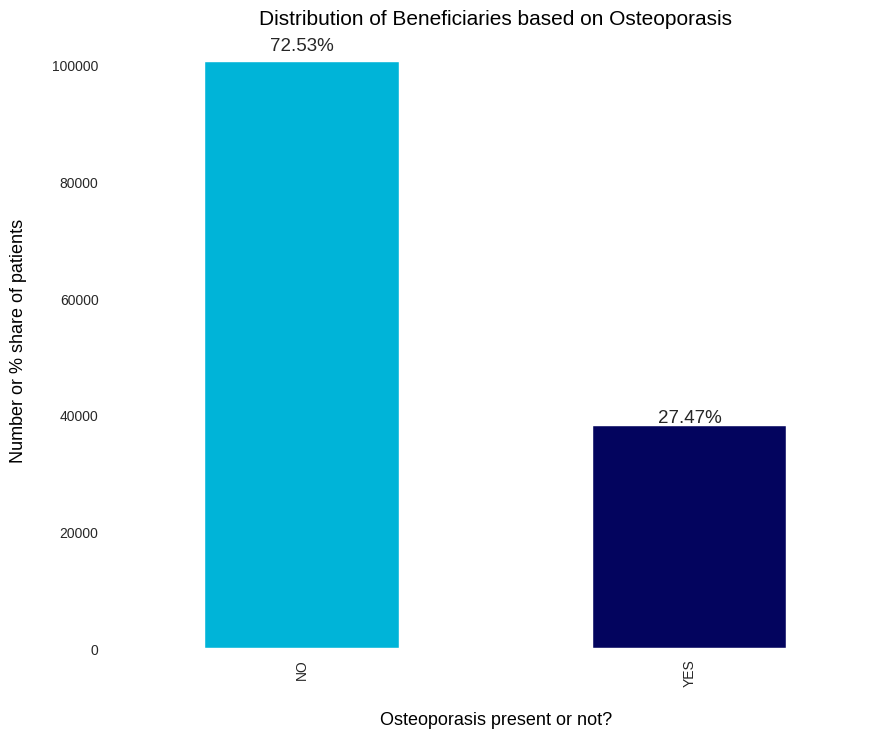

   Osteoporasis
0        100497
1         38059 



In [ ]:
# Examine beneficiaries with 'Osteoporasis'
plot_condition_distribution(beneficiary, 'Osteoporasis', 'Osteoporasis')

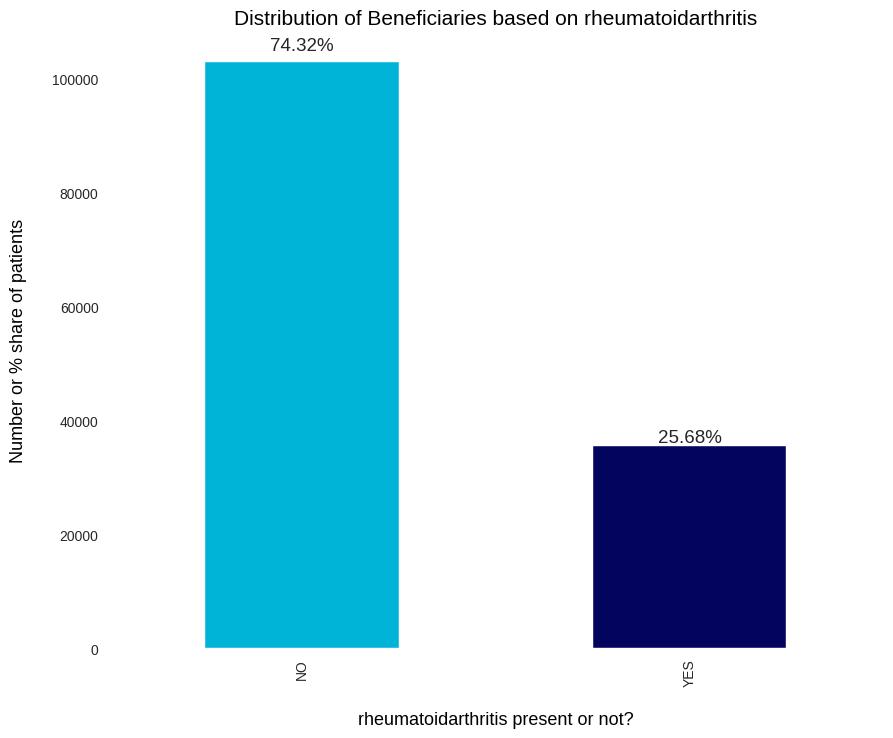

   rheumatoidarthritis
0               102972
1                35584 



In [ ]:
# Examine beneficiaries with 'rheumatoidarthritis'
plot_condition_distribution(beneficiary, 'rheumatoidarthritis', 'rheumatoidarthritis')

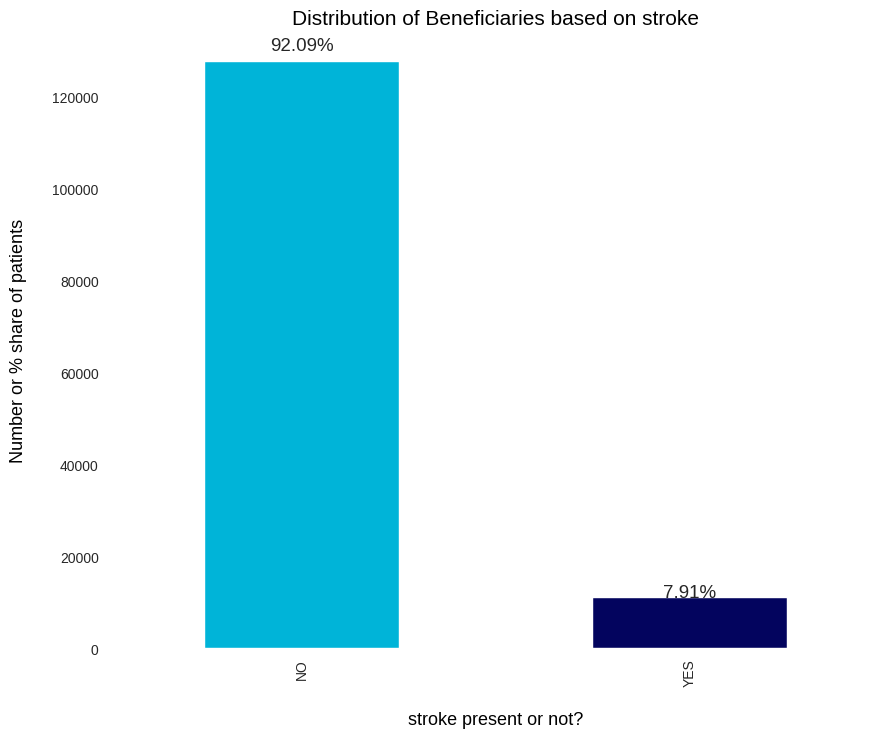

   stroke
0  127602
1   10954 



In [ ]:
# Examine beneficiaries with stroke
plot_condition_distribution(beneficiary, 'stroke', 'stroke')

BIVARIATE ANALYSIS

In [ ]:
#To plot the annual reimbursements for inpatient and out patient hospital visits

# pass an argument to examine the number of beneficiaries with the specified chronic condition

def plot_annual_reimbursement_by_condition(beneficiary, condition_column, condition_name):

    color = ['#606c38', '#bc6c25']

    # IP total expenditure
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(12, 8))
        fig = beneficiary.groupby([condition_column])['IPAnnualReimbursementAmt'].sum().plot(kind='bar', color=color)

        for p in fig.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            fig.annotate(f'{str(round((height*100)/(beneficiary["IPAnnualReimbursementAmt"].sum()), 2))+"%"}',
                         (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)

        plt.xlabel(f"\nHaving {condition_name}?", color="#000", fontsize=10)
        plt.xticks(ticks=[0, 1], labels=['No', 'Yes'], fontsize=12)
        plt.ylabel("Total Annual Sum of Max IP Reimbursement \n", color="#000", fontsize=10)
        plt.title(f"Total Annual Sum of Max IP Reimbursement: {condition_name}\n", color="#000", fontsize=10)
        plt.grid(False)

    print(pd.DataFrame(beneficiary.groupby([condition_column])['IPAnnualReimbursementAmt'].sum()), "\n")

    # OP maximum expenditure
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(12, 8))
        fig = beneficiary.groupby([condition_column])['OPAnnualReimbursementAmt'].sum().plot(kind='bar', color=color)

        for p in fig.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            fig.annotate(f'{str(round((height*100)/(beneficiary["OPAnnualReimbursementAmt"].sum()), 2))+"%"}',
                         (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)

        # Providing the labels and title to the graph
        plt.xlabel(f"\nHaving {condition_name}?", color='#000000', fontsize=10)
        plt.xticks(ticks=[0, 1], labels=['No', 'Yes'], fontsize=10)
        plt.ylabel("Total Annual Sum of Max OP Reimbursement \n", color='#000000', fontsize=10)
        plt.grid(False)
        plt.title(f"Total Annual Sum of Max OP Reimbursement: {condition_name}\n", color='#000000', fontsize=10)

    print(pd.DataFrame(beneficiary.groupby([condition_column])['OPAnnualReimbursementAmt'].sum()))




           IPAnnualReimbursementAmt
Alzheimer                          
0                         259949690
1                         247213280 

           OPAnnualReimbursementAmt
Alzheimer                          
0                         105154550
1                          74721530


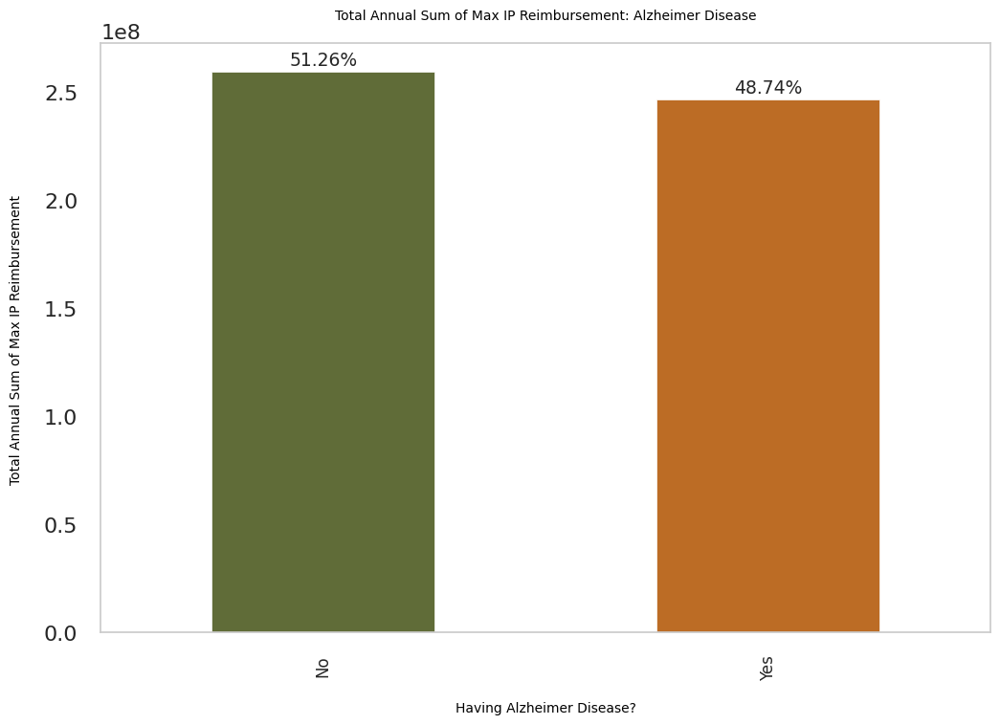

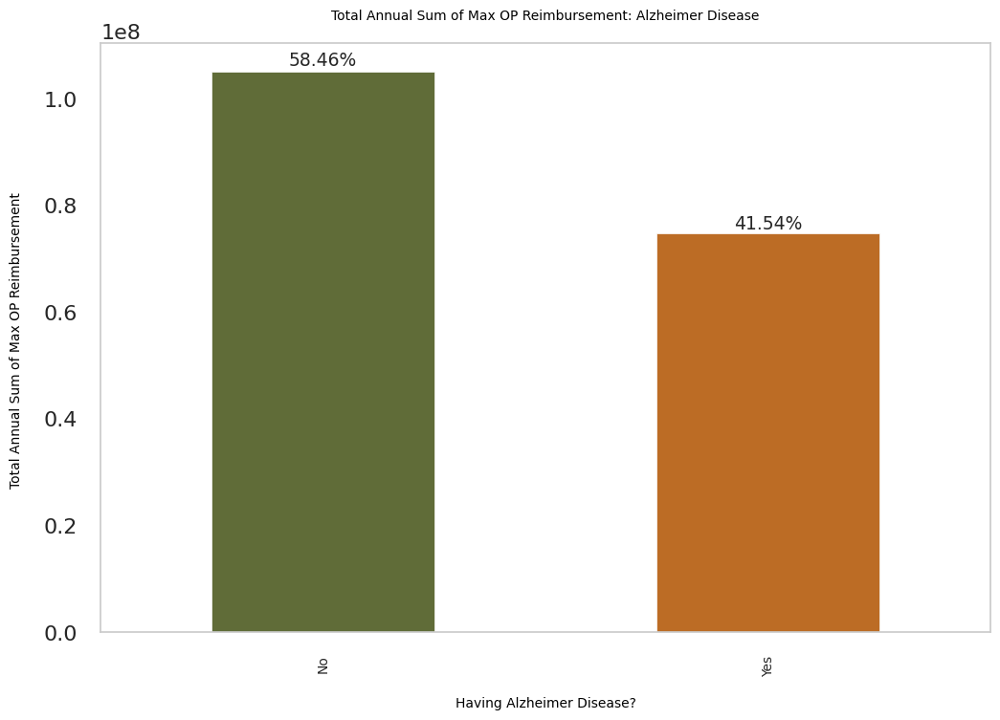

In [ ]:
# Examine the annual reimbursement for Alzheimer's Disease
plot_annual_reimbursement_by_condition(beneficiary, 'Alzheimer', 'Alzheimer Disease')

              IPAnnualReimbursementAmt
Heartfailure                          
0                            136306830
1                            370856140 

              OPAnnualReimbursementAmt
Heartfailure                          
0                             65595580
1                            114280500


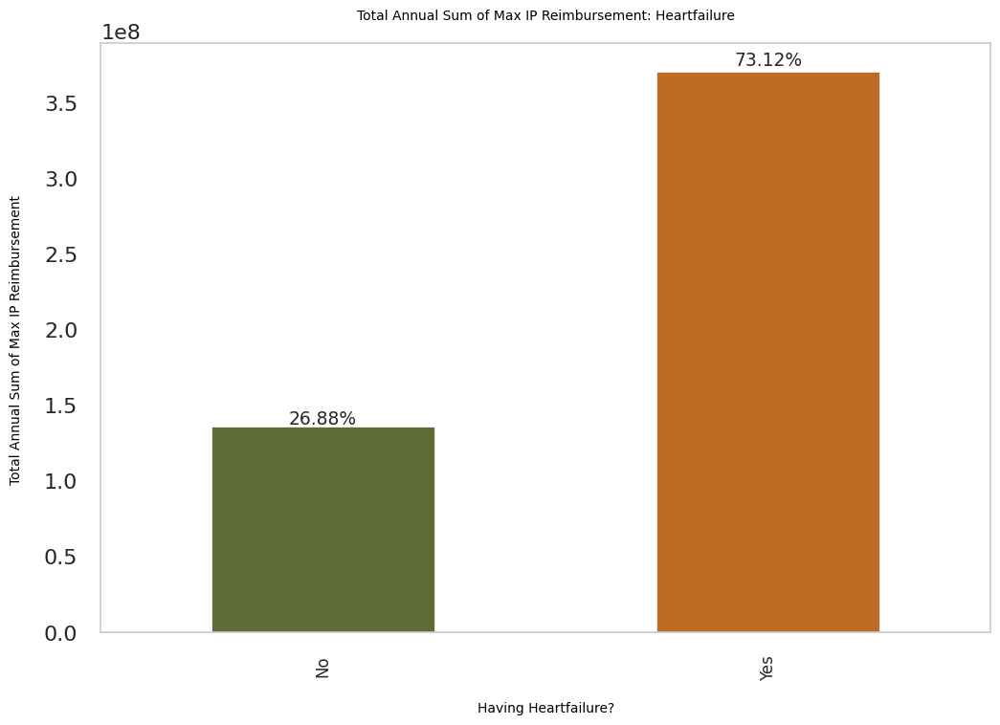

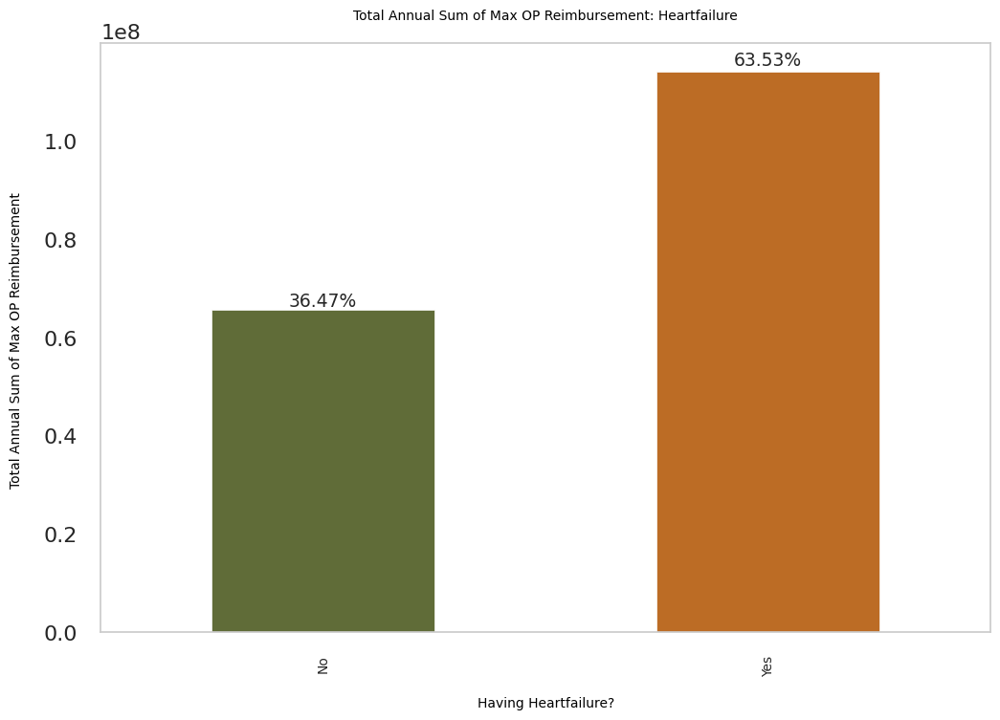

In [ ]:
# Examine the annual reimbursement for Heart failure
plot_annual_reimbursement_by_condition(beneficiary, 'Heartfailure', 'Heartfailure')

               IPAnnualReimbursementAmt
KidneyDisease                          
0                             182537230
1                             324625740 

               OPAnnualReimbursementAmt
KidneyDisease                          
0                              90651980
1                              89224100


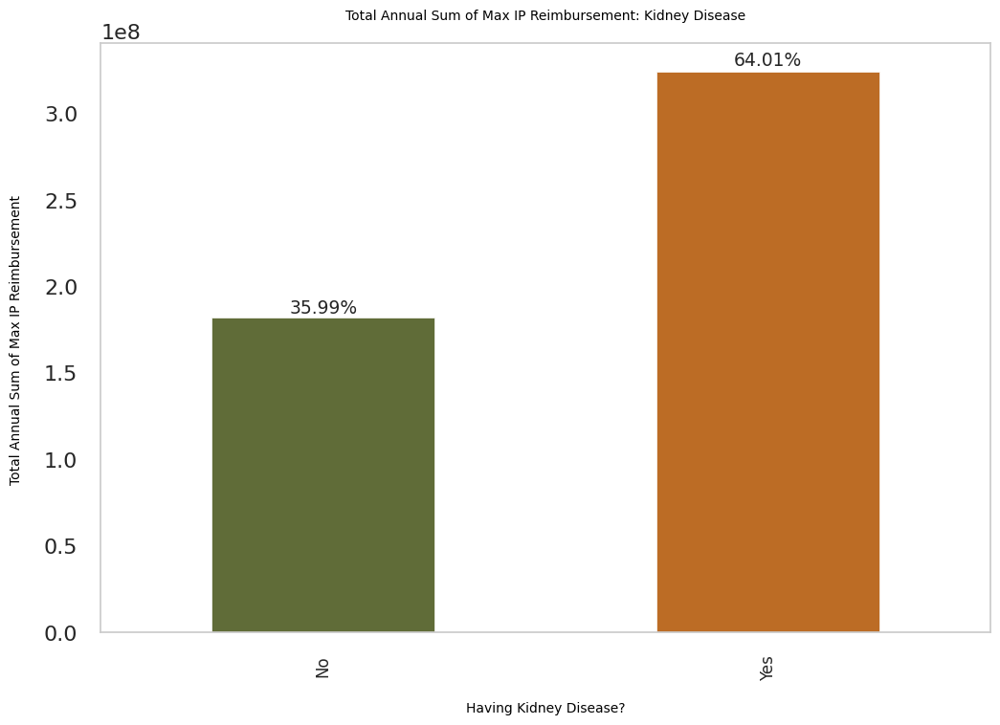

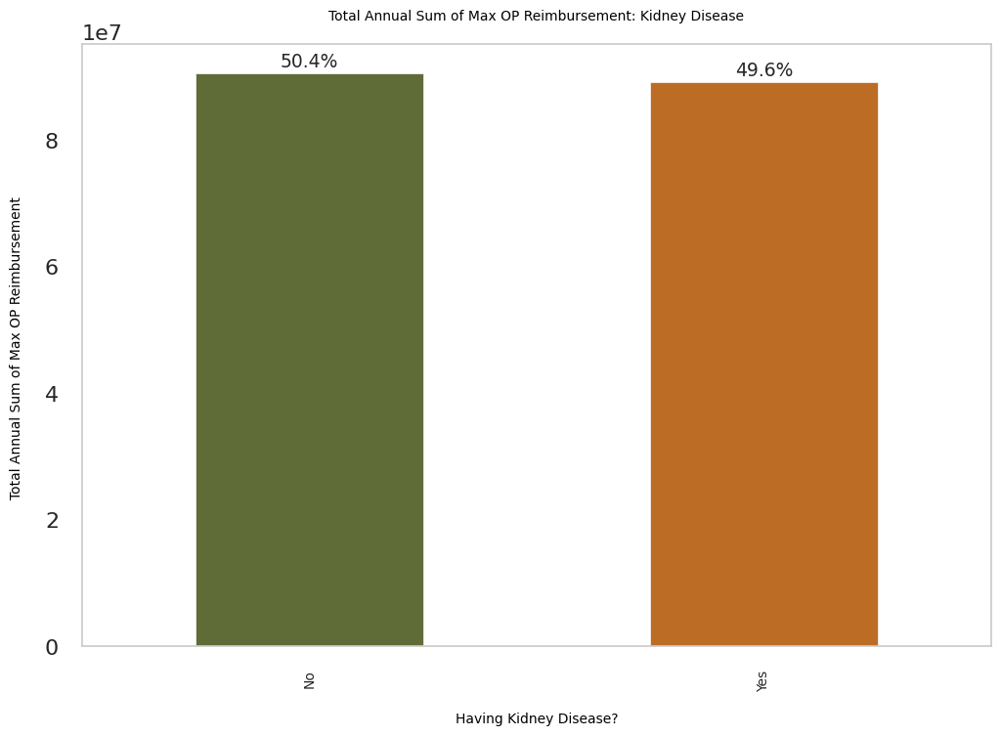

In [ ]:
#Examine the annual reimbursement for for Kidney Disease
plot_annual_reimbursement_by_condition(beneficiary, 'KidneyDisease', 'Kidney Disease')

        IPAnnualReimbursementAmt
Cancer                          
0                      406314520
1                      100848450 

        OPAnnualReimbursementAmt
Cancer                          
0                      150150630
1                       29725450


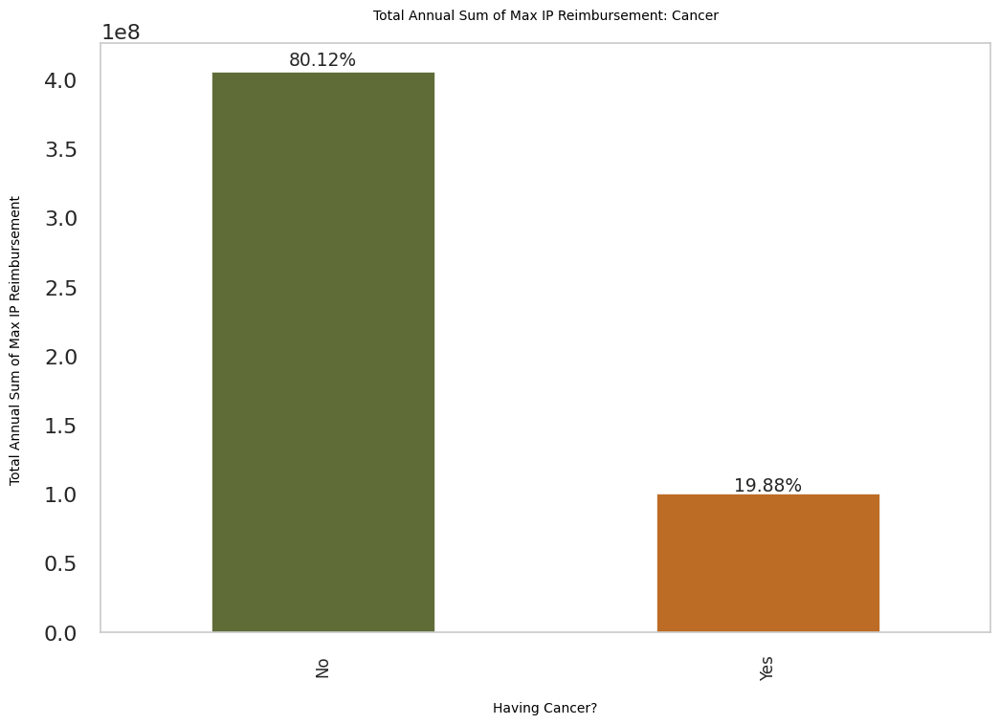

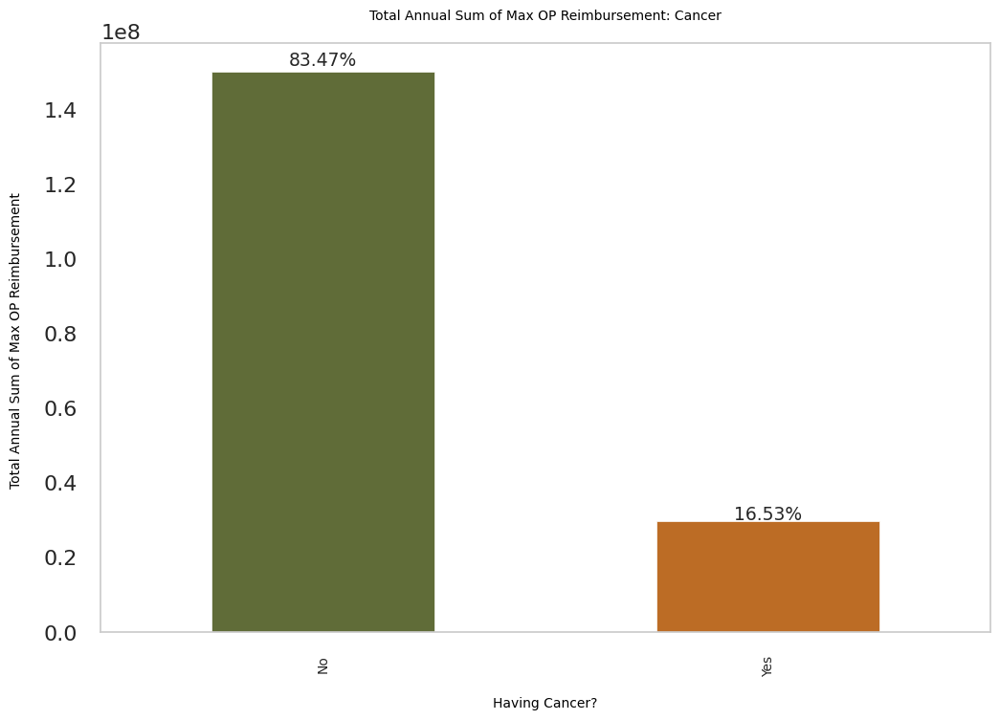

In [ ]:
# Examine the annual reimbursement for Cancer
plot_annual_reimbursement_by_condition(beneficiary, 'Cancer', 'Cancer')

                IPAnnualReimbursementAmt
ObstrPulmonary                          
0                              265262490
1                              241900480 

                OPAnnualReimbursementAmt
ObstrPulmonary                          
0                              120372870
1                               59503210


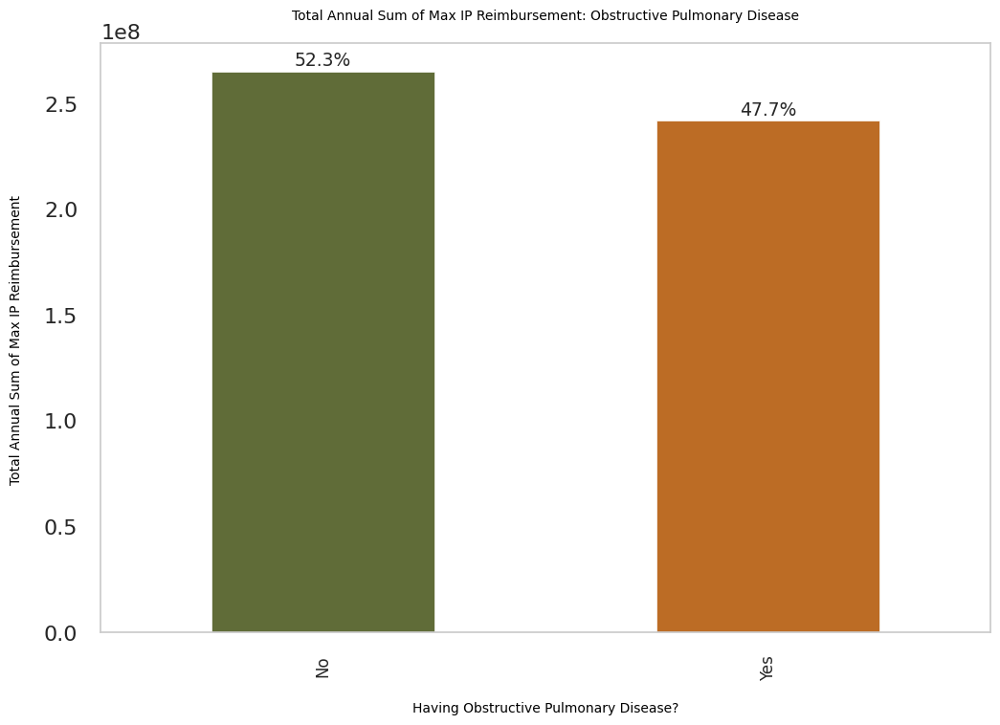

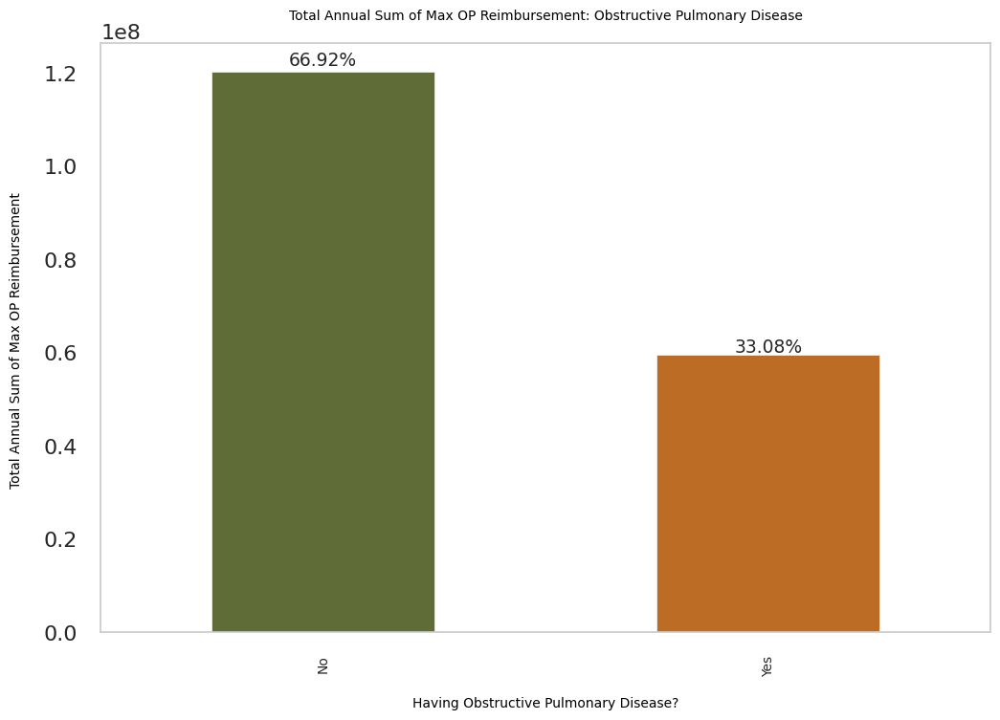

In [ ]:
# Examine the annual reimbursement for ObstrPulmonary's Disease
plot_annual_reimbursement_by_condition(beneficiary, 'ObstrPulmonary', 'Obstructive Pulmonary Disease')

            IPAnnualReimbursementAmt
Depression                          
0                          259771230
1                          247391740 

            OPAnnualReimbursementAmt
Depression                          
0                          100869360
1                           79006720


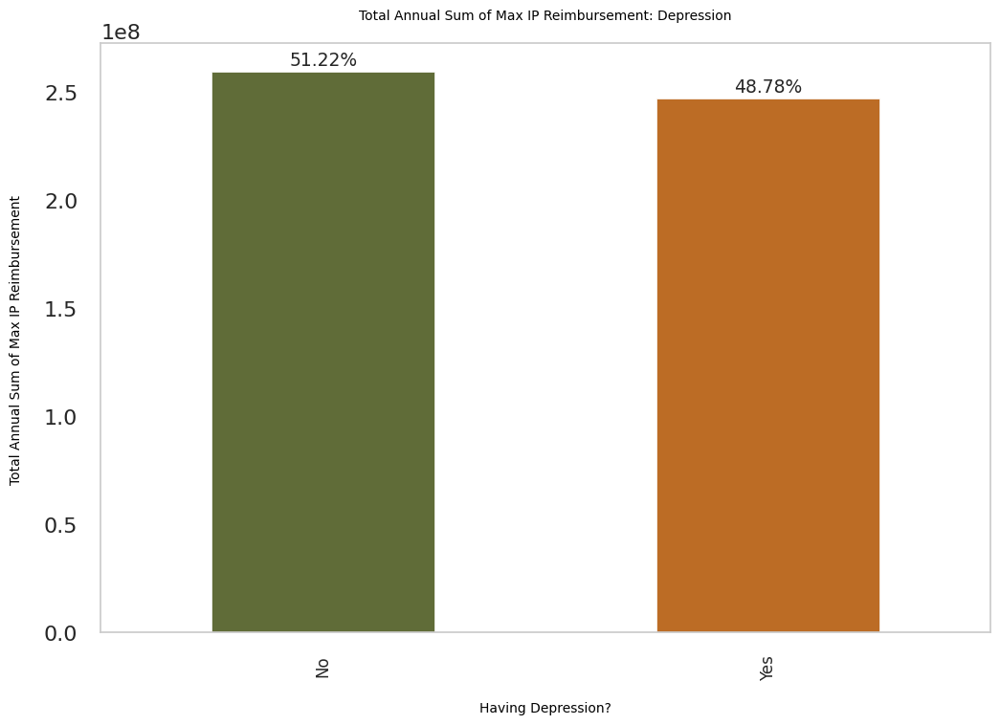

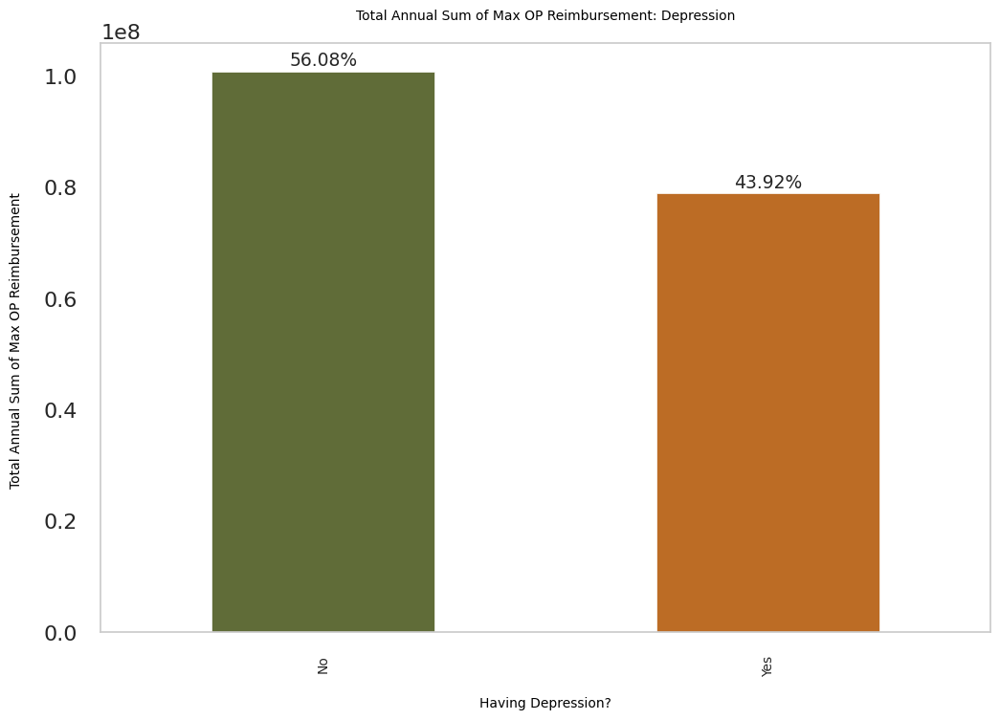

In [ ]:
# Examine the annual reimbursement for for Depression
plot_annual_reimbursement_by_condition(beneficiary, 'Depression', 'Depression')

               IPAnnualReimbursementAmt
IschemicHeart                          
0                              67253140
1                             439909830 

               OPAnnualReimbursementAmt
IschemicHeart                          
0                              37436300
1                             142439780


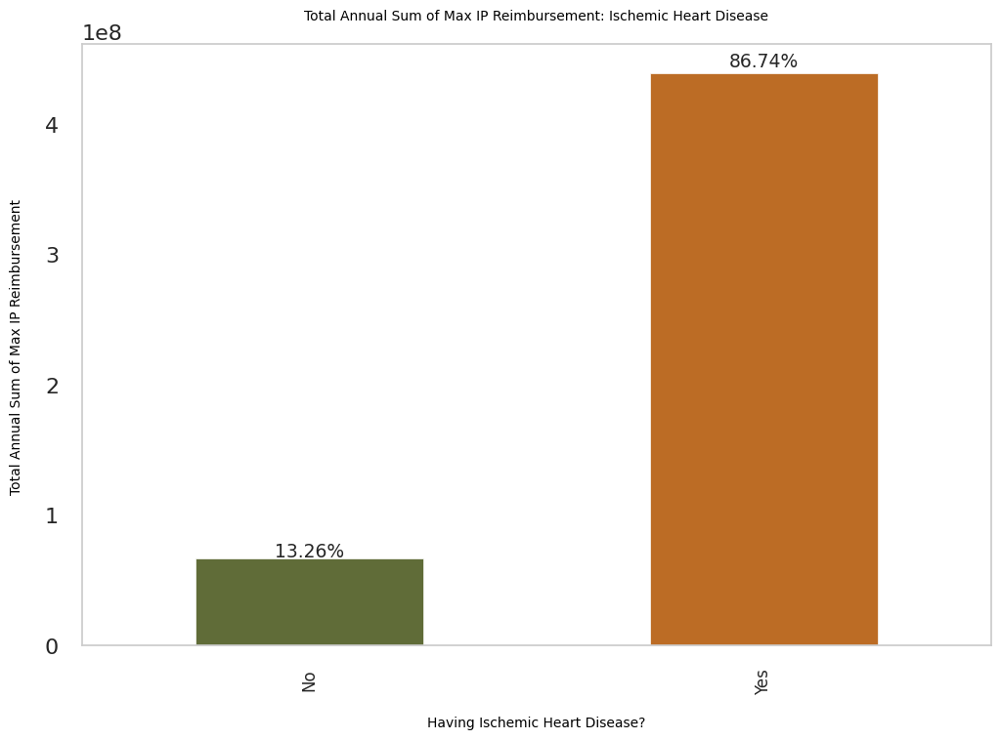

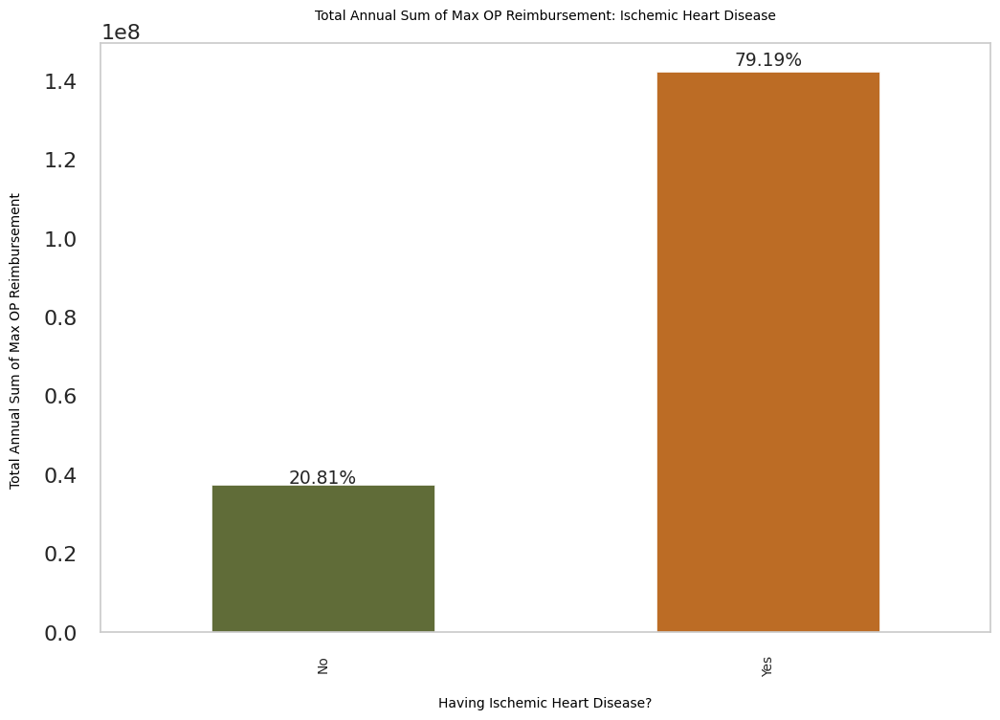

In [ ]:
# Examine the annual reimbursement for for IschemicHeart Disease
plot_annual_reimbursement_by_condition(beneficiary, 'IschemicHeart', 'Ischemic Heart Disease')

          IPAnnualReimbursementAmt
Diabetes                          
0                        100996930
1                        406166040 

          OPAnnualReimbursementAmt
Diabetes                          
0                         45845100
1                        134030980


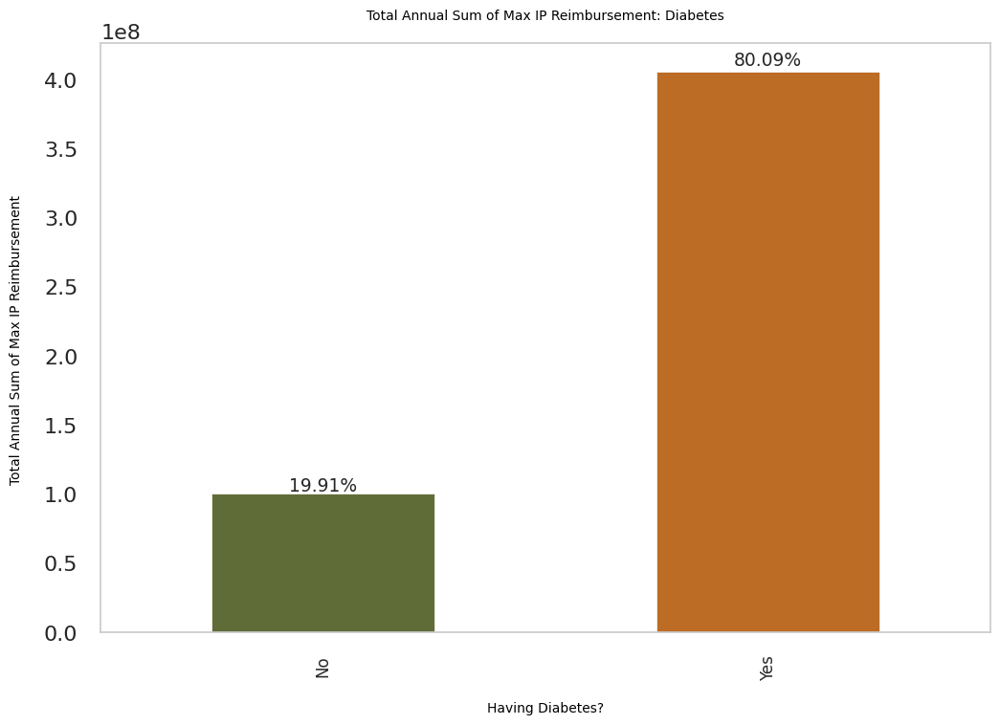

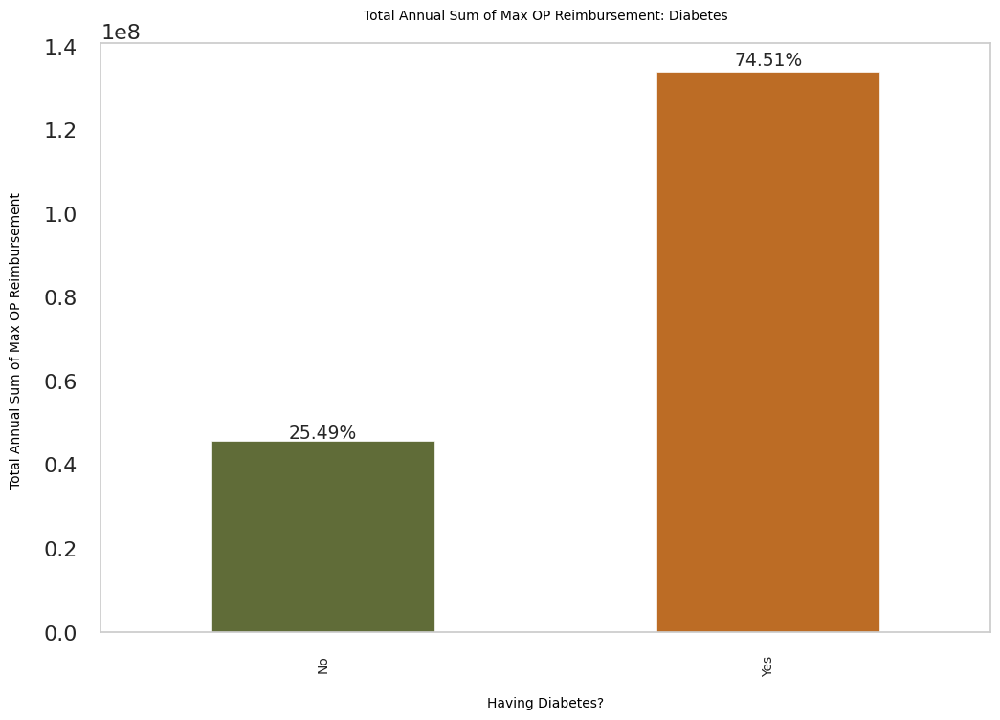

In [ ]:
# Examine the annual reimbursement for for Diabetes
plot_annual_reimbursement_by_condition(beneficiary, 'Diabetes', 'Diabetes')

              IPAnnualReimbursementAmt
Osteoporasis                          
0                            331771120
1                            175391850 

              OPAnnualReimbursementAmt
Osteoporasis                          
0                            122988950
1                             56887130


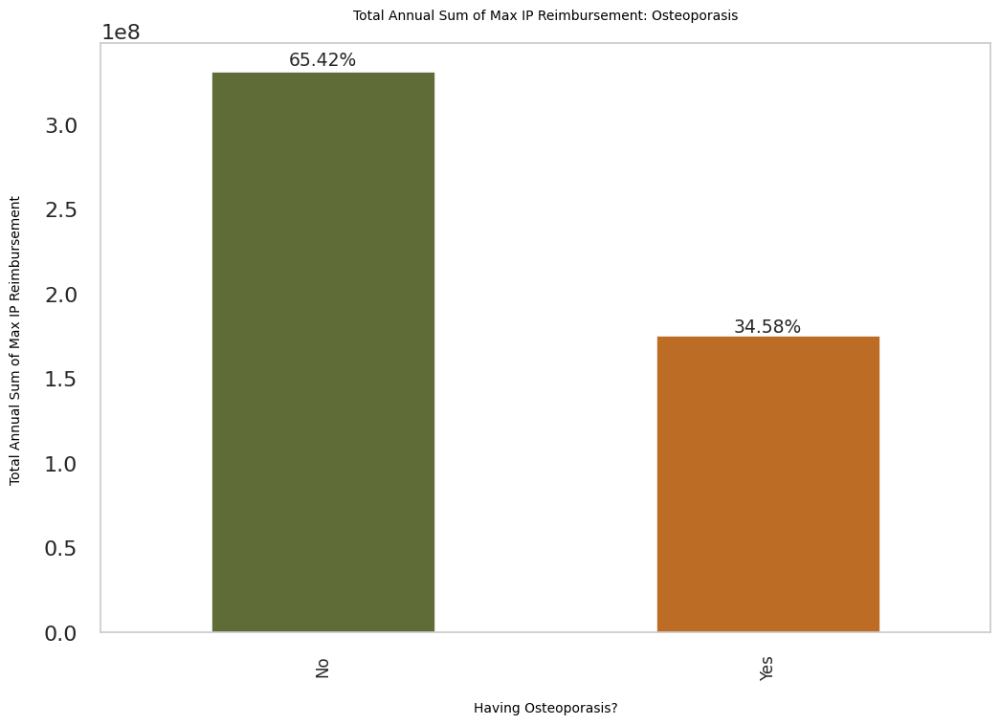

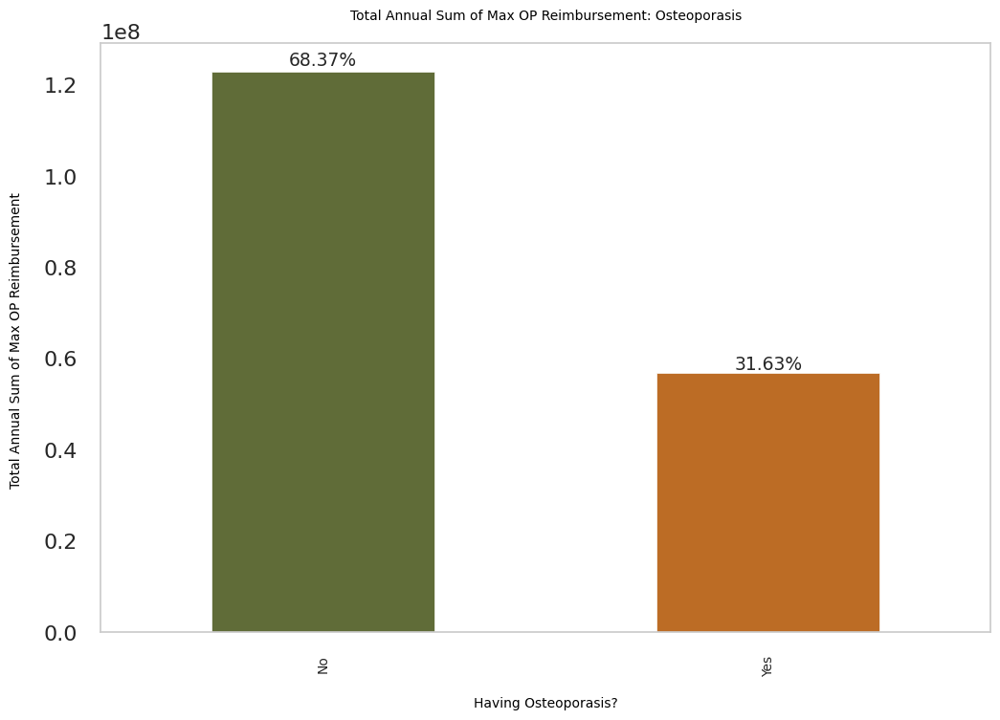

In [ ]:
# Examine the annual reimbursement for for Osteoporasis
plot_annual_reimbursement_by_condition(beneficiary, 'Osteoporasis', 'Osteoporasis')

                     IPAnnualReimbursementAmt
rheumatoidarthritis                          
0                                   325612420
1                                   181550550 

                     OPAnnualReimbursementAmt
rheumatoidarthritis                          
0                                   124789990
1                                    55086090


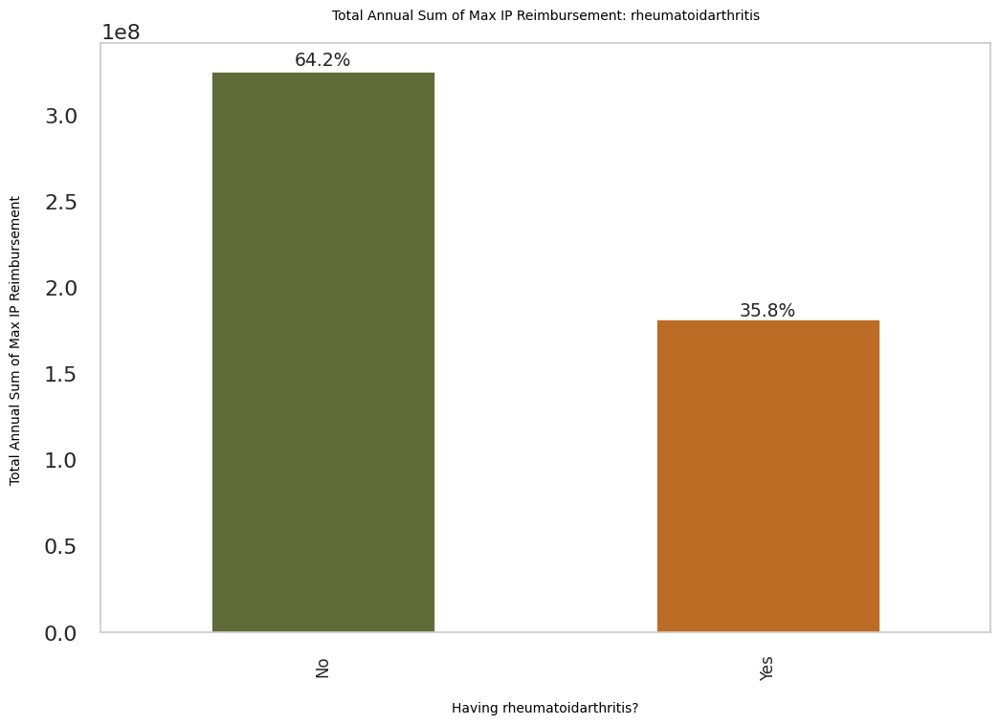

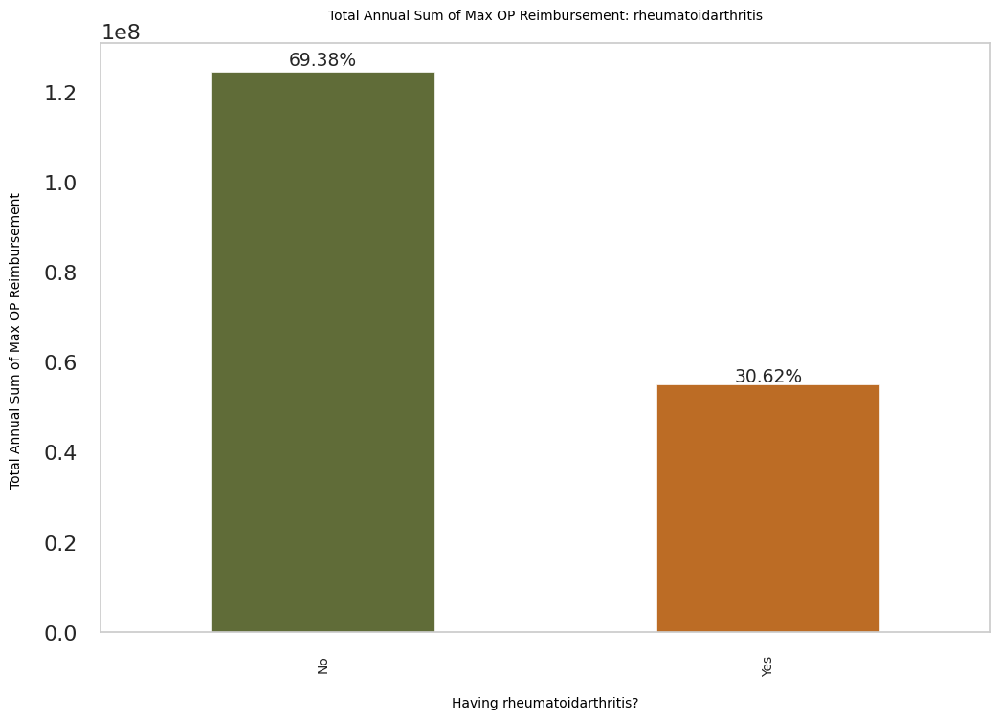

In [ ]:
# Examine the annual reimbursement for for  rheumatoidarthritis
plot_annual_reimbursement_by_condition(beneficiary,  'rheumatoidarthritis', 'rheumatoidarthritis')

        IPAnnualReimbursementAmt
stroke                          
0                      418309870
1                       88853100 

        OPAnnualReimbursementAmt
stroke                          
0                      158787470
1                       21088610


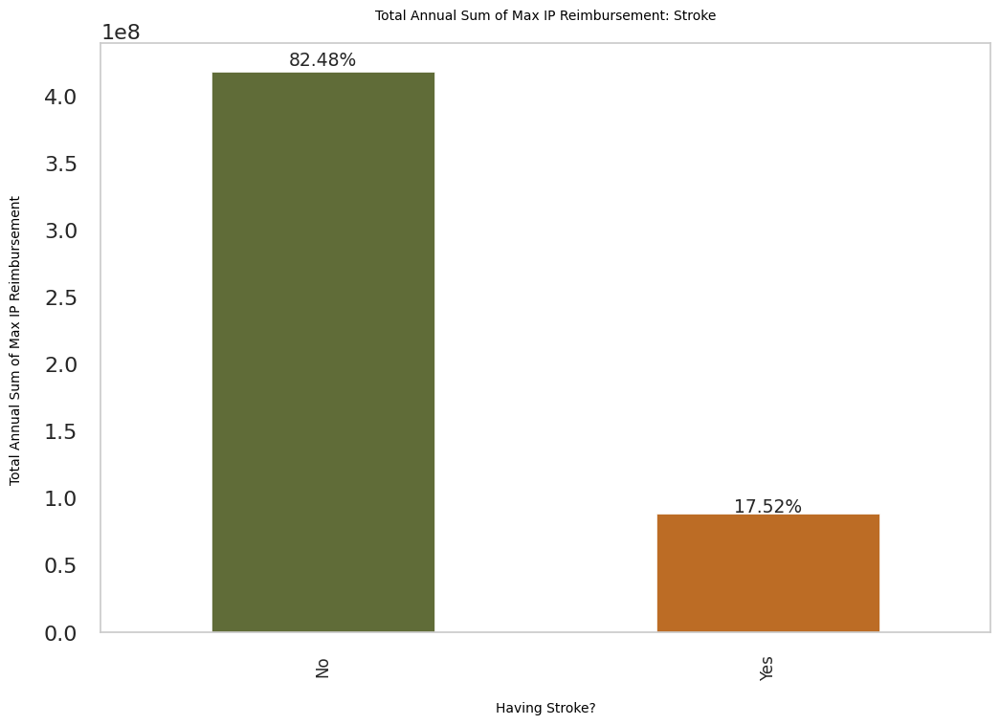

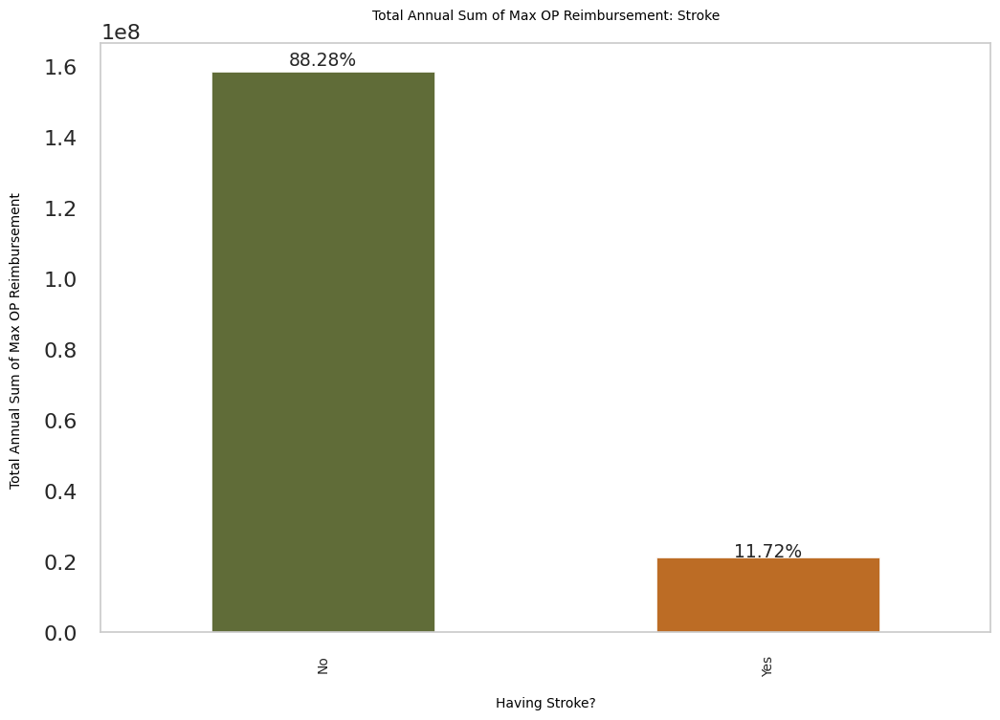

In [ ]:
# Examine the annual reimbursement for for stroke
plot_annual_reimbursement_by_condition(beneficiary, 'stroke', 'Stroke')

Evaluate the total co-payment sum paid by IP and OP


           IPAnnualDeductibleAmt
Alzheimer                       
0                       27200388
1                       28200854 

           OPAnnualDeductibleAmt
Alzheimer                       
0                       30832150
1                       21502981


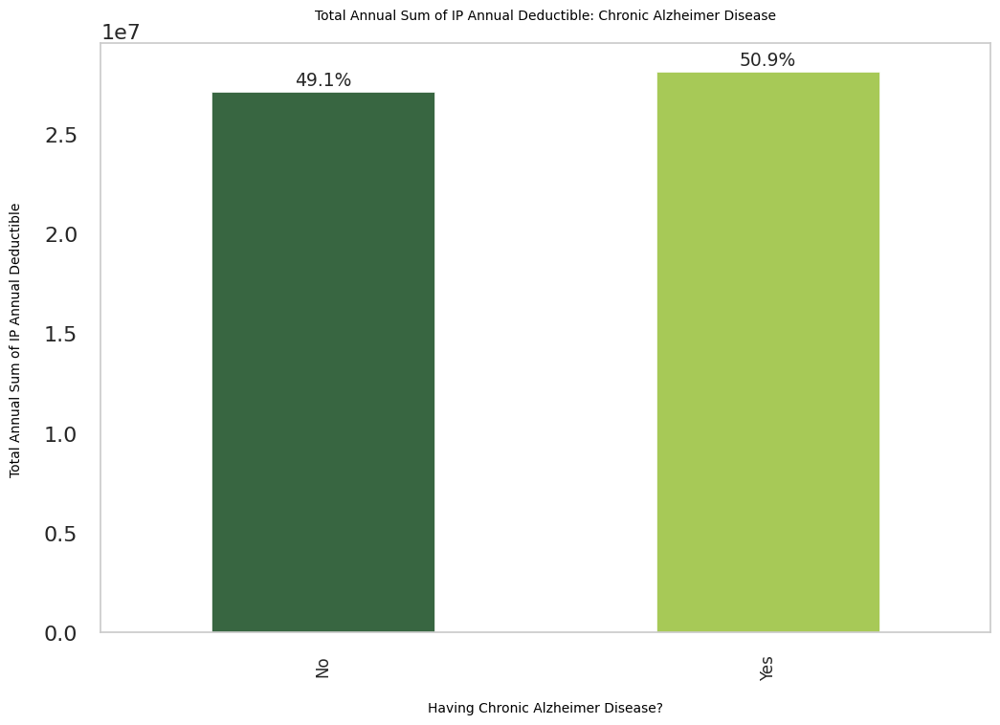

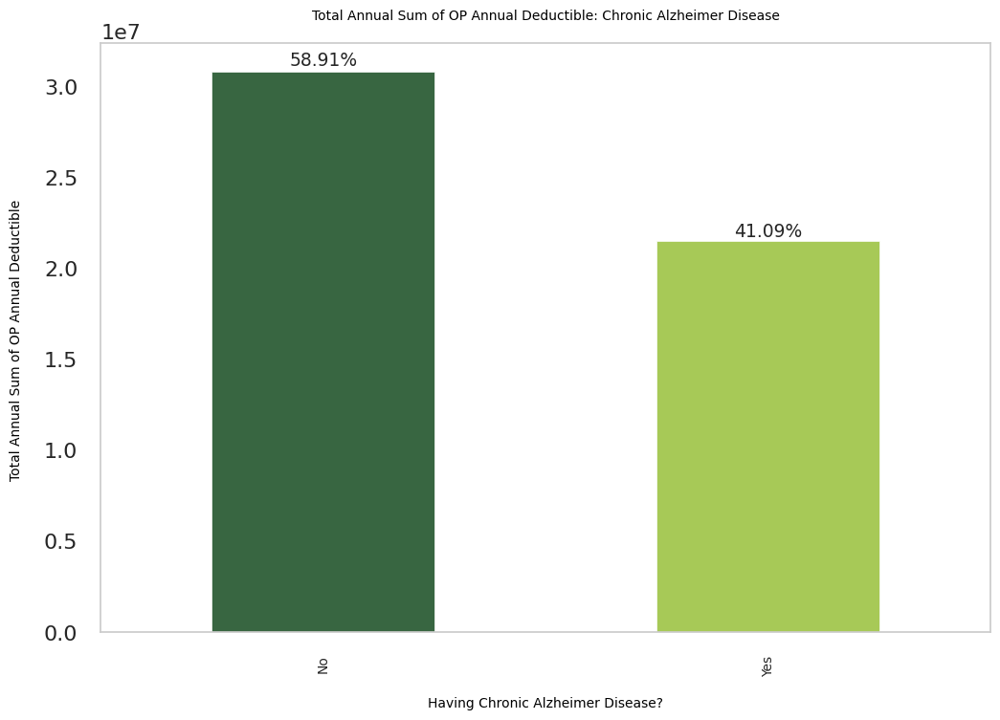

In [ ]:

def plot_annual_deductible_by_condition(beneficiary, condition_column, condition_name):
    # Examine the number of beneficiaries with the specified chronic condition
    color = color = ['#386641','#a7c957']

    # IP annual deductible
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(12, 8))
        fig = beneficiary.groupby([condition_column])['IPAnnualDeductibleAmt'].sum().plot(kind='bar', color=color)

        for p in fig.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            fig.annotate(f'{str(round((height*100)/(beneficiary["IPAnnualDeductibleAmt"].sum()), 2))+"%"}',
                         (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)

        plt.xlabel(f"\nHaving {condition_name}?", color="#000", fontsize=10)
        plt.xticks(ticks=[0, 1], labels=['No', 'Yes'], fontsize=12)
        plt.ylabel("Total Annual Sum of IP Annual Deductible \n", color="#000", fontsize=10)
        plt.title(f"Total Annual Sum of IP Annual Deductible: {condition_name}\n", color="#000", fontsize=10)
        plt.grid(False)

    print(pd.DataFrame(beneficiary.groupby([condition_column])['IPAnnualDeductibleAmt'].sum()), "\n")

    # OP annual deductible
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(12, 8))
        fig = beneficiary.groupby([condition_column])['OPAnnualDeductibleAmt'].sum().plot(kind='bar', color=color)

        for p in fig.patches:
            width = p.get_width()
            height = p.get_height()
            x, y = p.get_xy()
            fig.annotate(f'{str(round((height*100)/(beneficiary["OPAnnualDeductibleAmt"].sum()), 2))+"%"}',
                         (x + width/2, y + height*1.01), ha='center', fontsize=13.5, rotation=0)

        # Providing the labels and title to the graph
        plt.xlabel(f"\nHaving {condition_name}?", color='#000000', fontsize=10)
        plt.xticks(ticks=[0, 1], labels=['No', 'Yes'], fontsize=10)
        plt.ylabel("Total Annual Sum of OP Annual Deductible \n", color='#000000', fontsize=10)
        plt.grid(False)
        plt.title(f"Total Annual Sum of OP Annual Deductible: {condition_name}\n", color='#000000', fontsize=10)

    print(pd.DataFrame(beneficiary.groupby([condition_column])['OPAnnualDeductibleAmt'].sum()))

# Examine the annual deductible amount for for Alzheimer's Disease
plot_annual_deductible_by_condition(beneficiary, 'Alzheimer', 'Chronic Alzheimer Disease')


          IPAnnualDeductibleAmt
Diabetes                       
0                      10849210
1                      44552032 

          OPAnnualDeductibleAmt
Diabetes                       
0                      13612902
1                      38722229


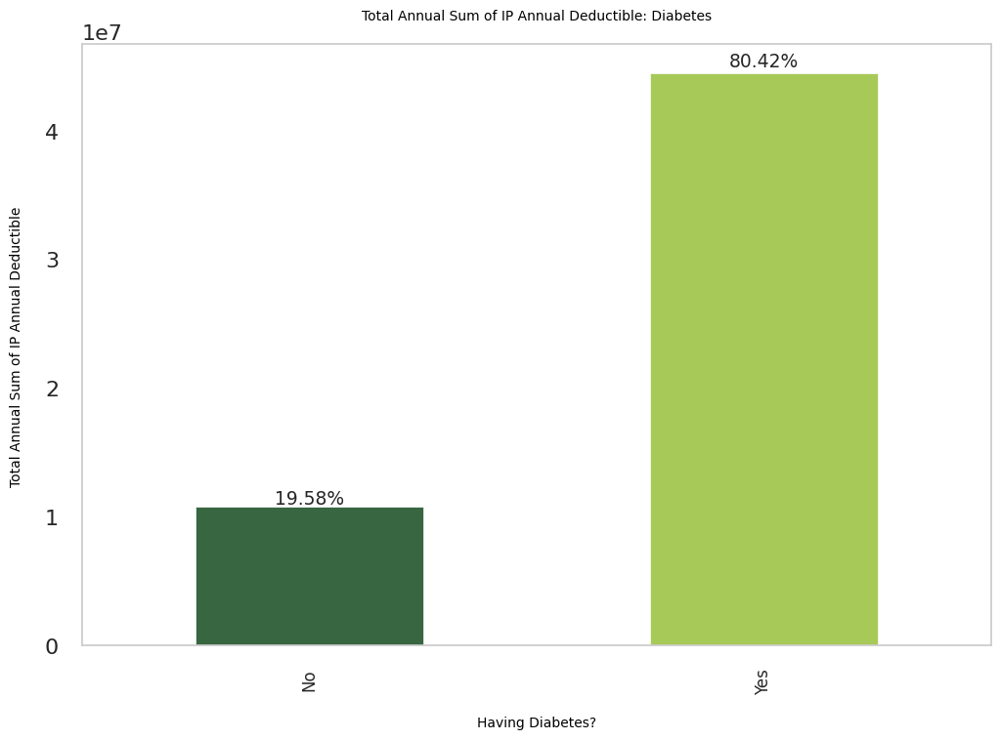

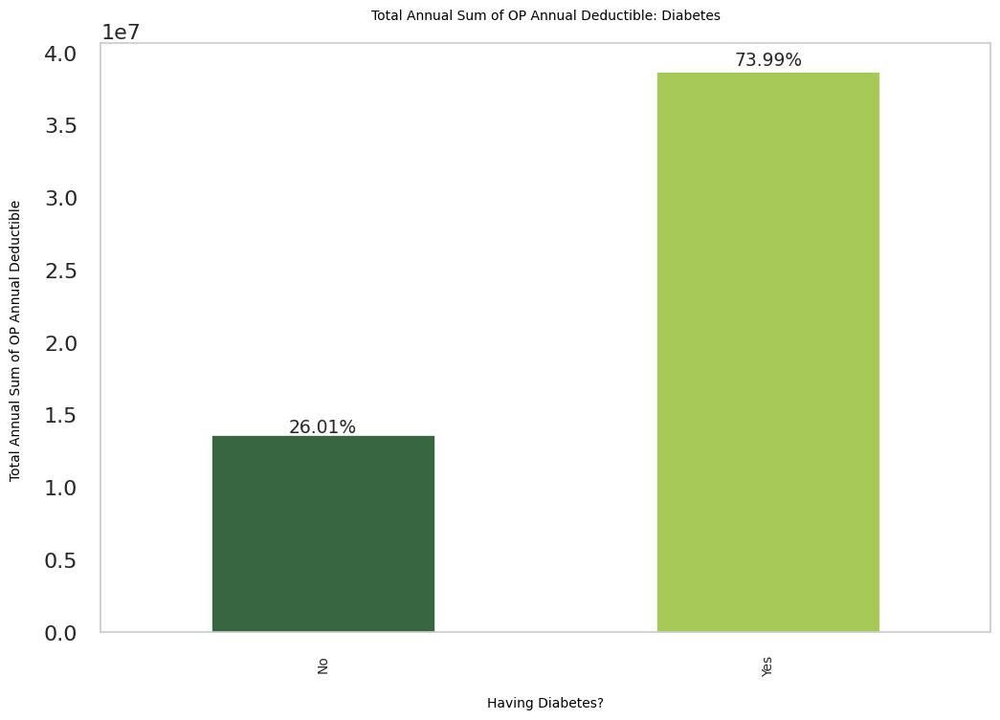

In [ ]:
# Examine the annual deductible amount for for Diabetes
plot_annual_deductible_by_condition(beneficiary, 'Diabetes', 'Diabetes')

              IPAnnualDeductibleAmt
Heartfailure                       
0                          15097592
1                          40303650 

              OPAnnualDeductibleAmt
Heartfailure                       
0                          19685293
1                          32649838


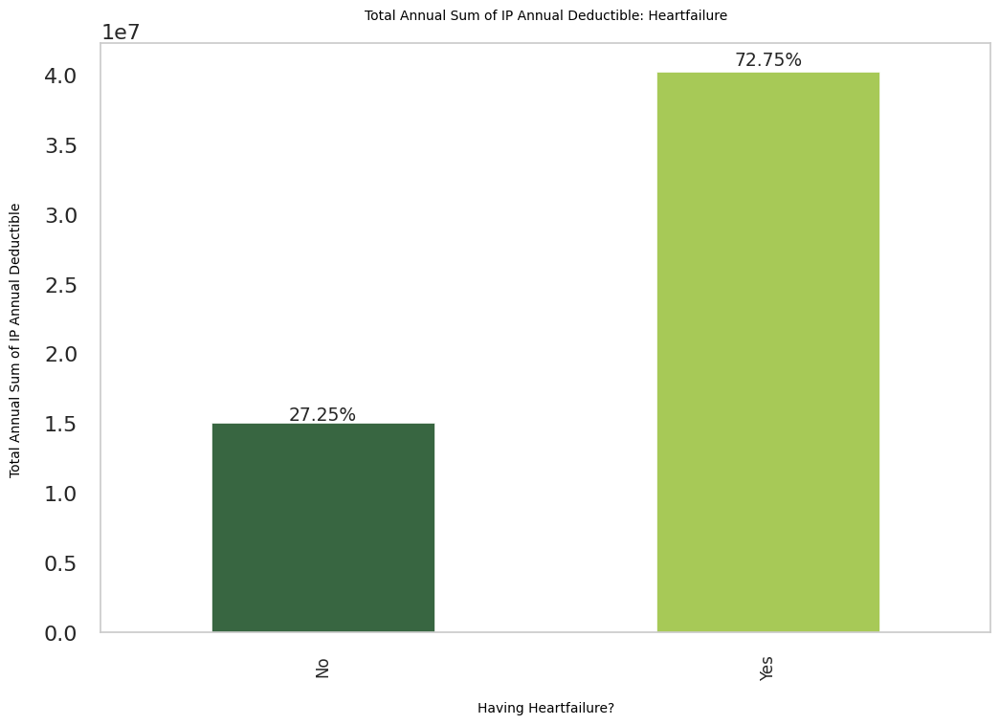

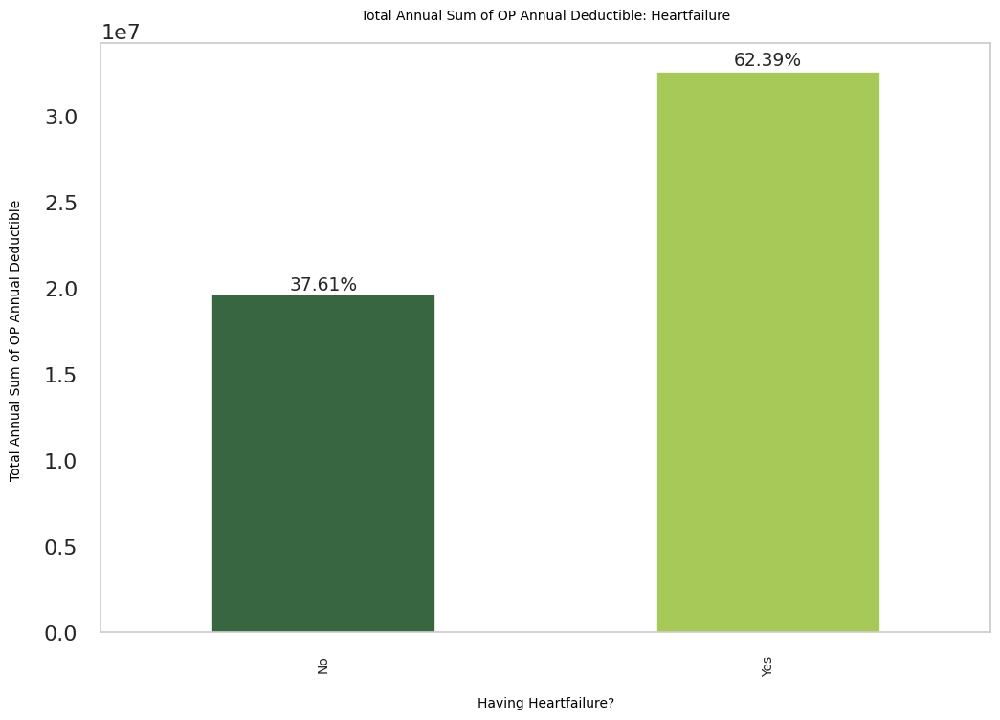

In [ ]:
# Examine the annual deductible amount for 'Heartfailure'
plot_annual_deductible_by_condition(beneficiary, 'Heartfailure', 'Heartfailure')

               IPAnnualDeductibleAmt
IschemicHeart                       
0                            7955416
1                           47445826 

               OPAnnualDeductibleAmt
IschemicHeart                       
0                           10996218
1                           41338913


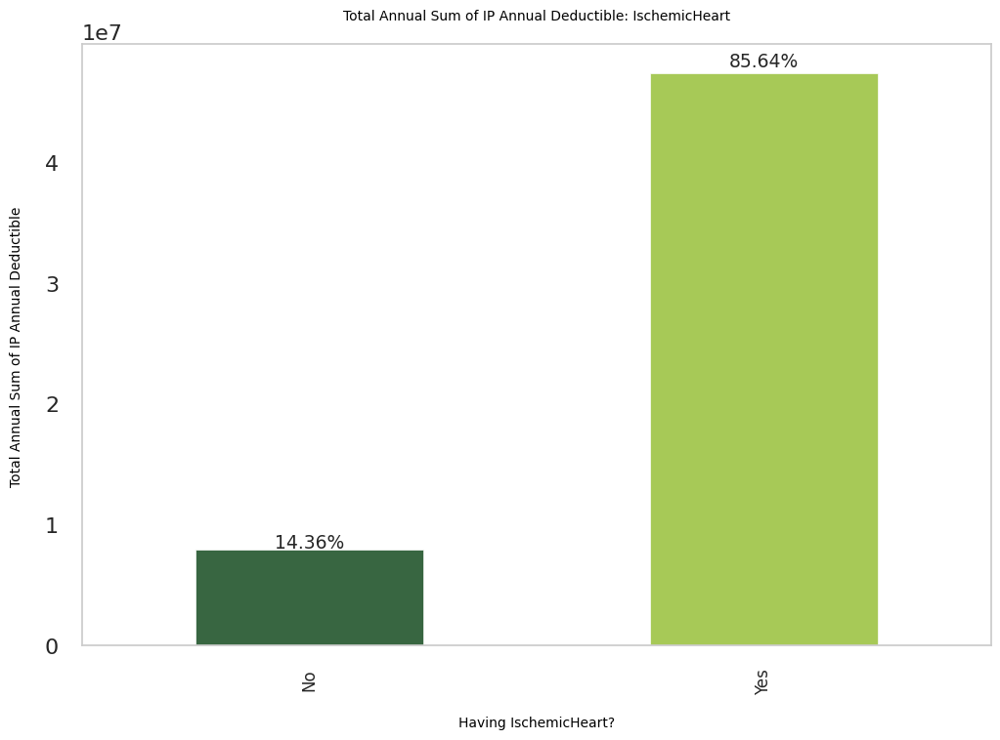

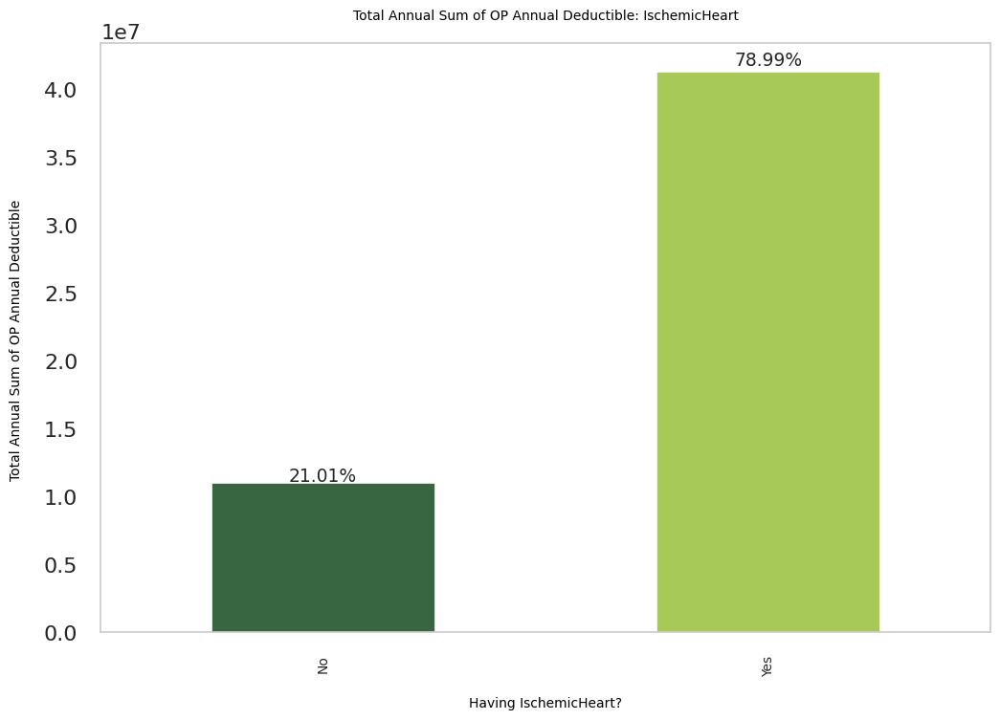

In [ ]:
# Examine the annual deductible amount for 'IschemicHeart'
plot_annual_deductible_by_condition(beneficiary, 'IschemicHeart', 'IschemicHeart')

        IPAnnualDeductibleAmt
stroke                       
0                    45965472
1                     9435770 

        OPAnnualDeductibleAmt
stroke                       
0                    46464362
1                     5870769


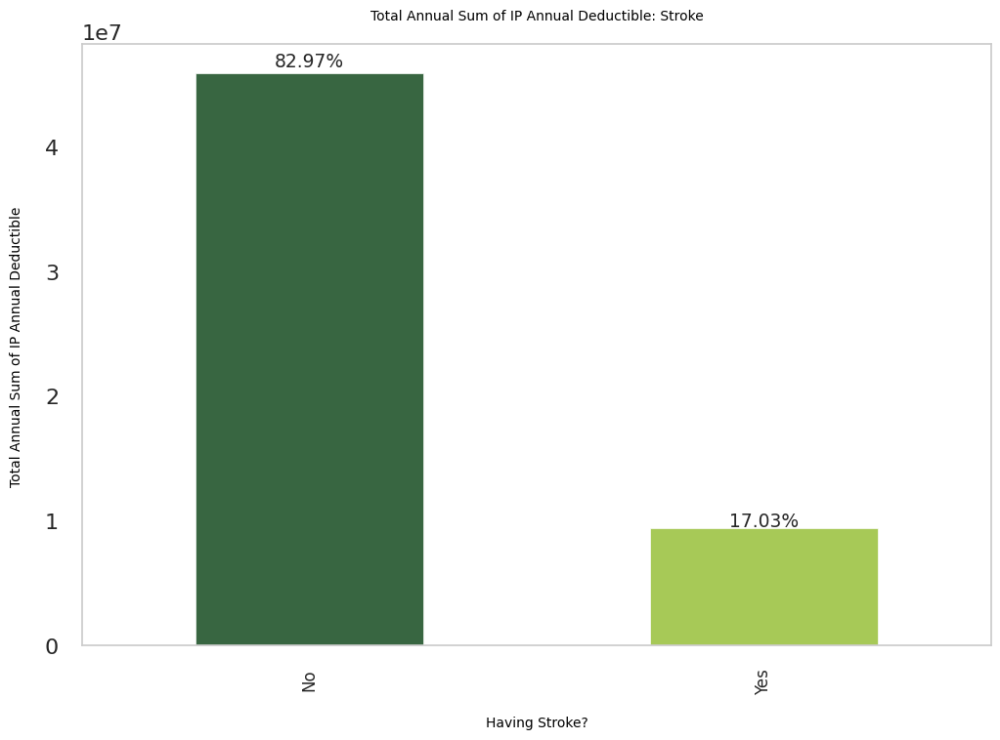

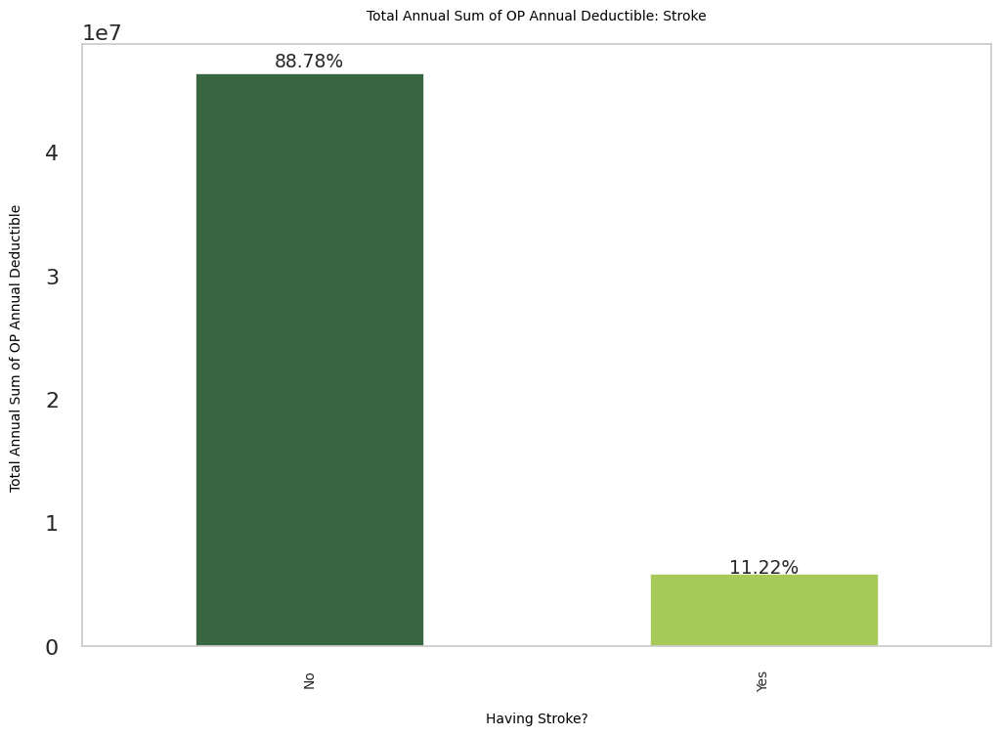

In [ ]:
# Examine the annual deductible amount for 'Heartfailure'
plot_annual_deductible_by_condition(beneficiary, 'stroke', 'Stroke')

              IPAnnualDeductibleAmt
Osteoporasis                       
0                          35913580
1                          19487662 

              OPAnnualDeductibleAmt
Osteoporasis                       
0                          35731920
1                          16603211


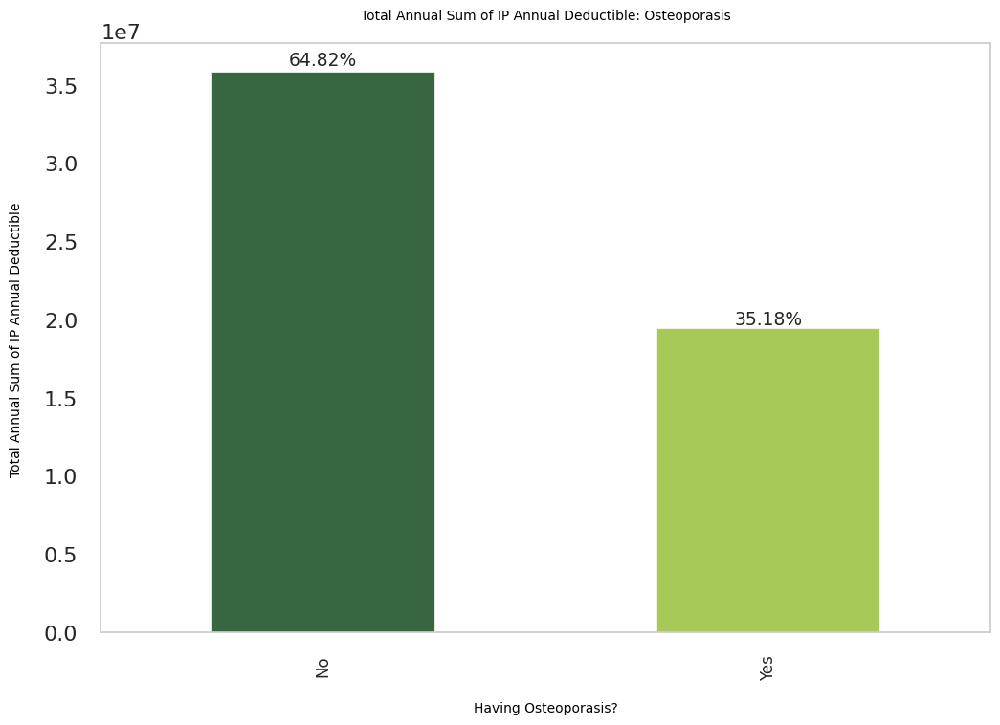

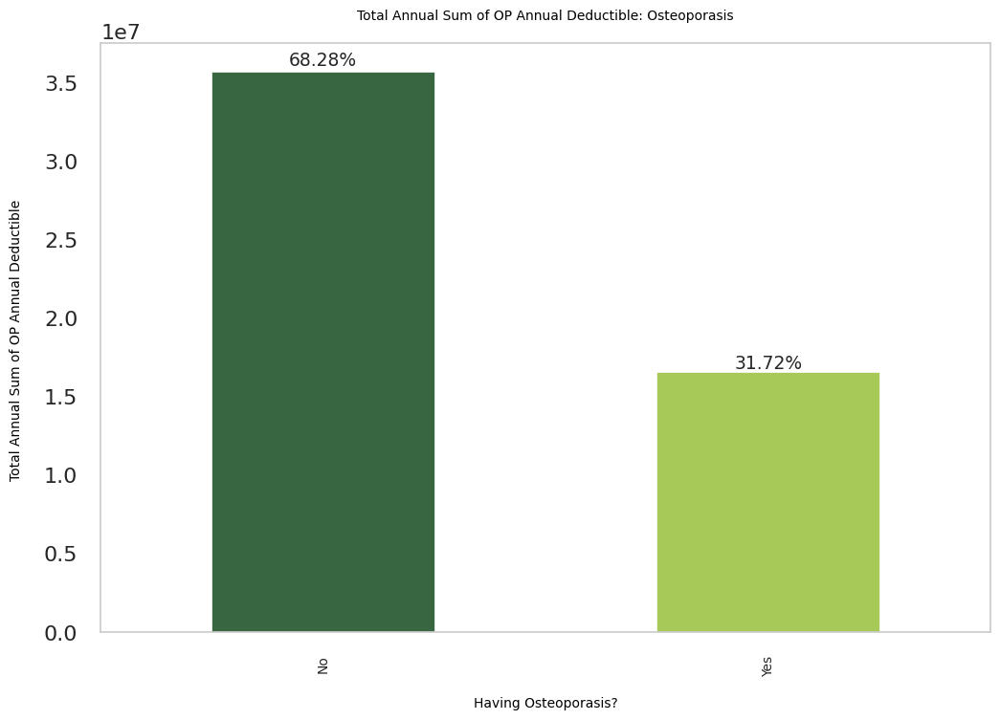

In [ ]:
# Examine the annual deductible amount for 'Osteoporasis'
plot_annual_deductible_by_condition(beneficiary, 'Osteoporasis', 'Osteoporasis')

                     IPAnnualDeductibleAmt
rheumatoidarthritis                       
0                                 35380588
1                                 20020654 

                     OPAnnualDeductibleAmt
rheumatoidarthritis                       
0                                 36200520
1                                 16134611


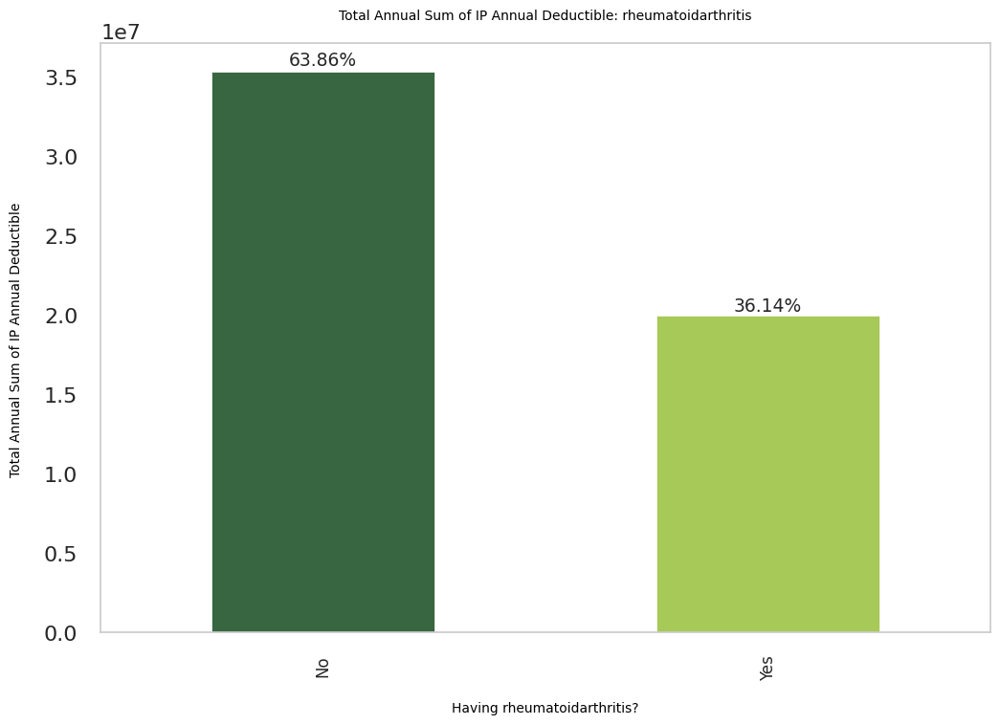

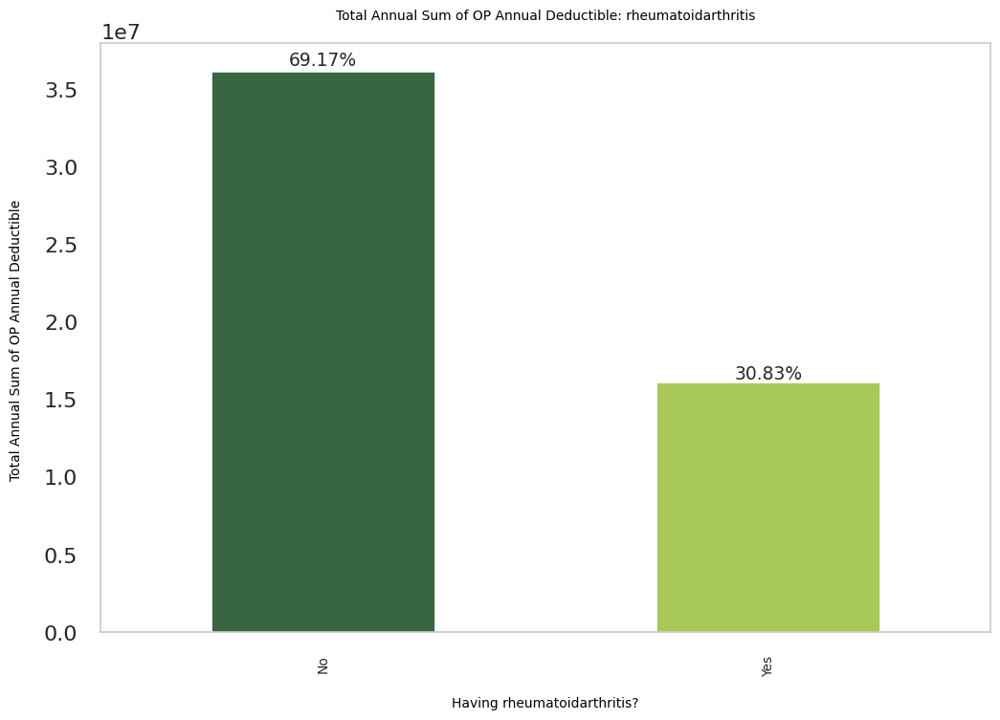

In [ ]:
# Examine the annual deductible amount for 'rheumatoidarthritis'
plot_annual_deductible_by_condition(beneficiary, 'rheumatoidarthritis', 'rheumatoidarthritis')

        IPAnnualDeductibleAmt
Cancer                       
0                    44824638
1                    10576604 

        OPAnnualDeductibleAmt
Cancer                       
0                    43678371
1                     8656760


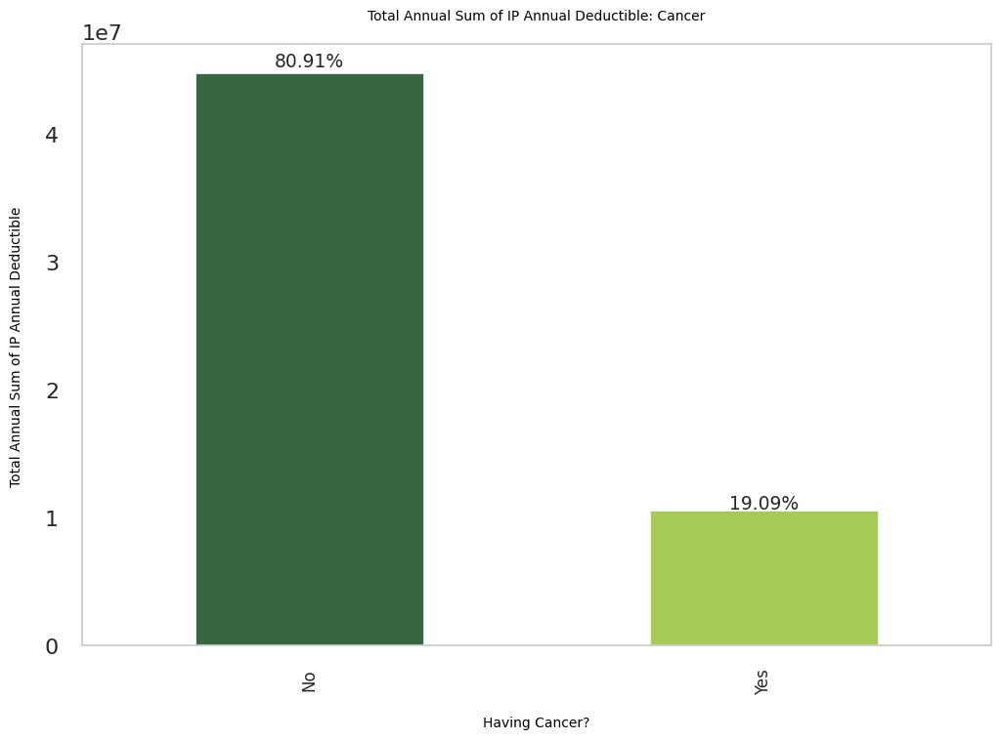

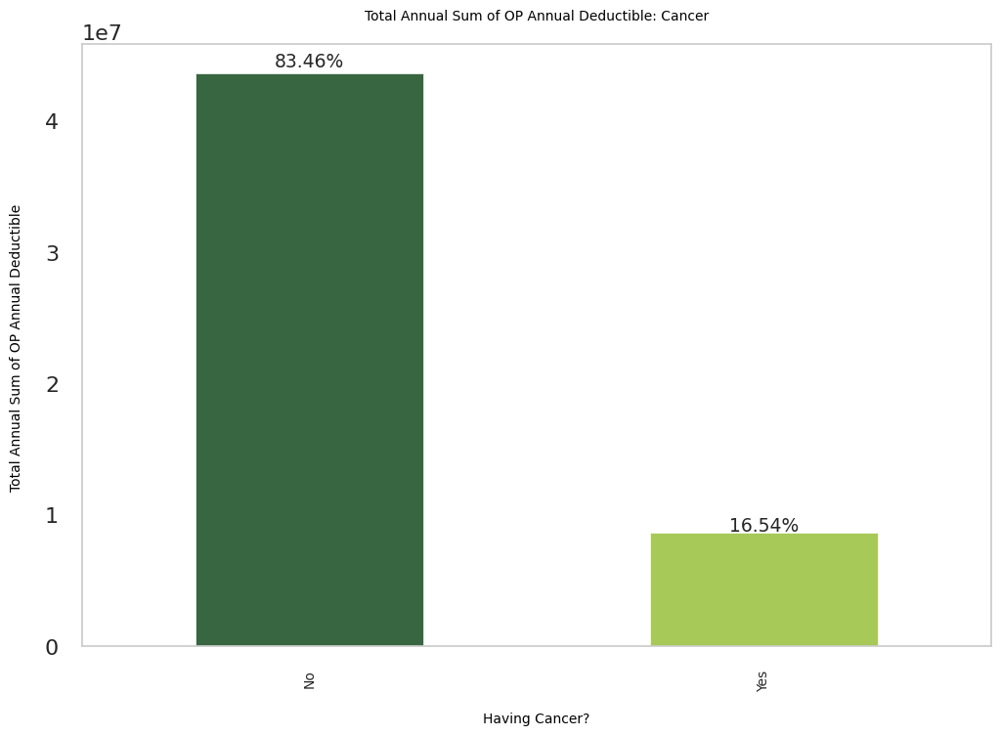

In [ ]:
# Examine the annual deductible amount for 'Cancer'
plot_annual_deductible_by_condition(beneficiary, 'Cancer', 'Cancer')

                IPAnnualDeductibleAmt
ObstrPulmonary                       
0                            28515058
1                            26886184 

                OPAnnualDeductibleAmt
ObstrPulmonary                       
0                            35266600
1                            17068531


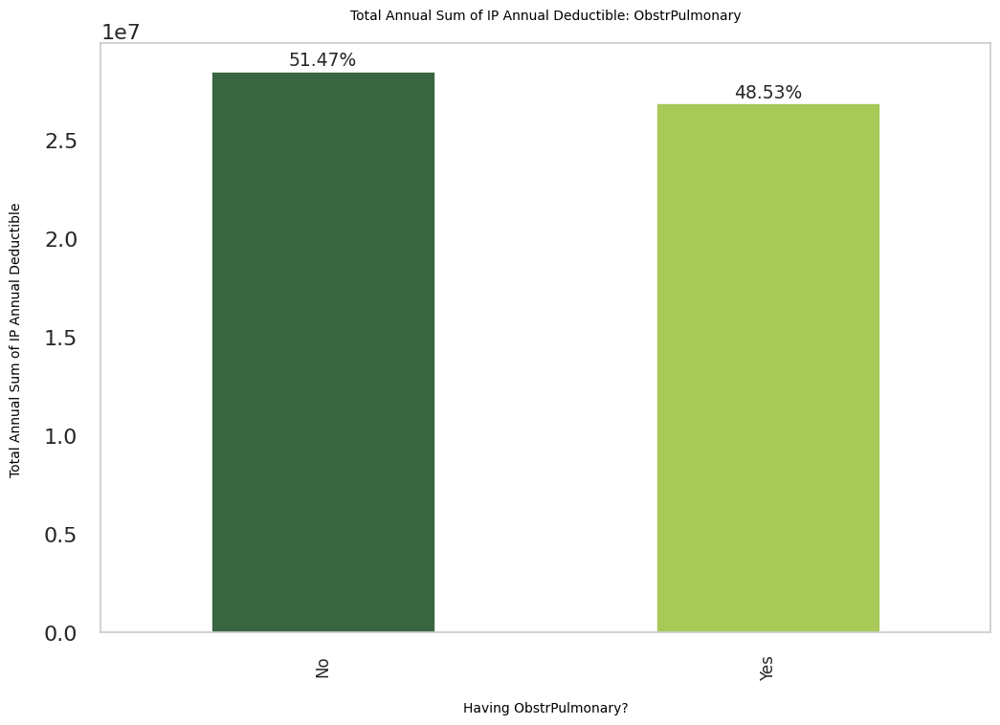

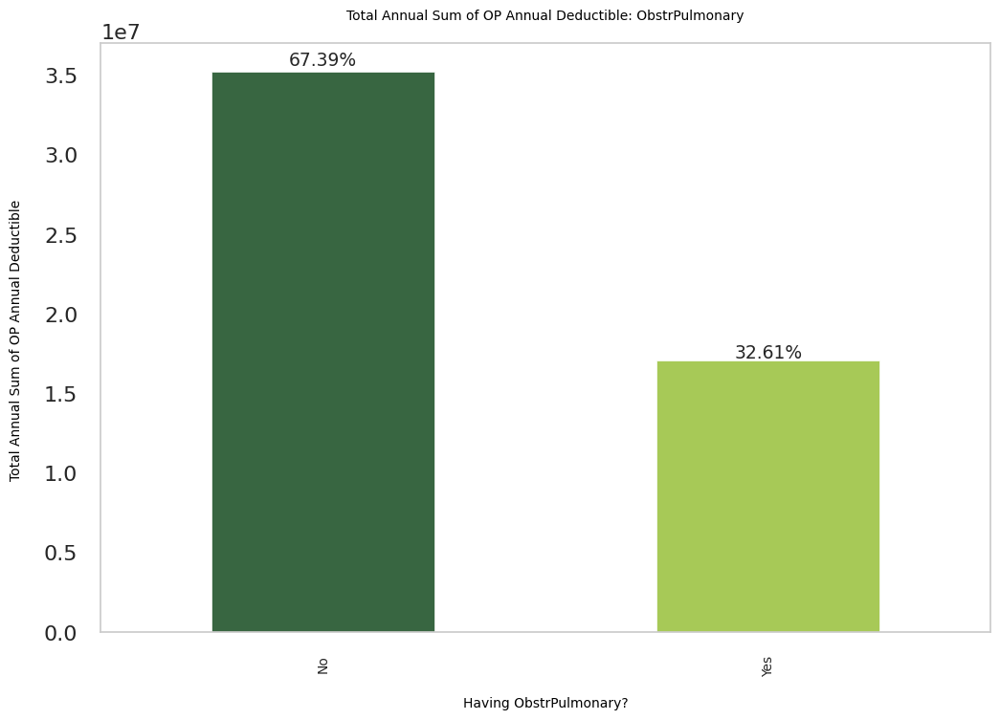

In [ ]:
# Examine the annual deductible amount for 'rheumatoidarthritis'
plot_annual_deductible_by_condition(beneficiary, 'ObstrPulmonary', 'ObstrPulmonary')

            IPAnnualDeductibleAmt
Depression                       
0                        27320344
1                        28080898 

            OPAnnualDeductibleAmt
Depression                       
0                        29464417
1                        22870714


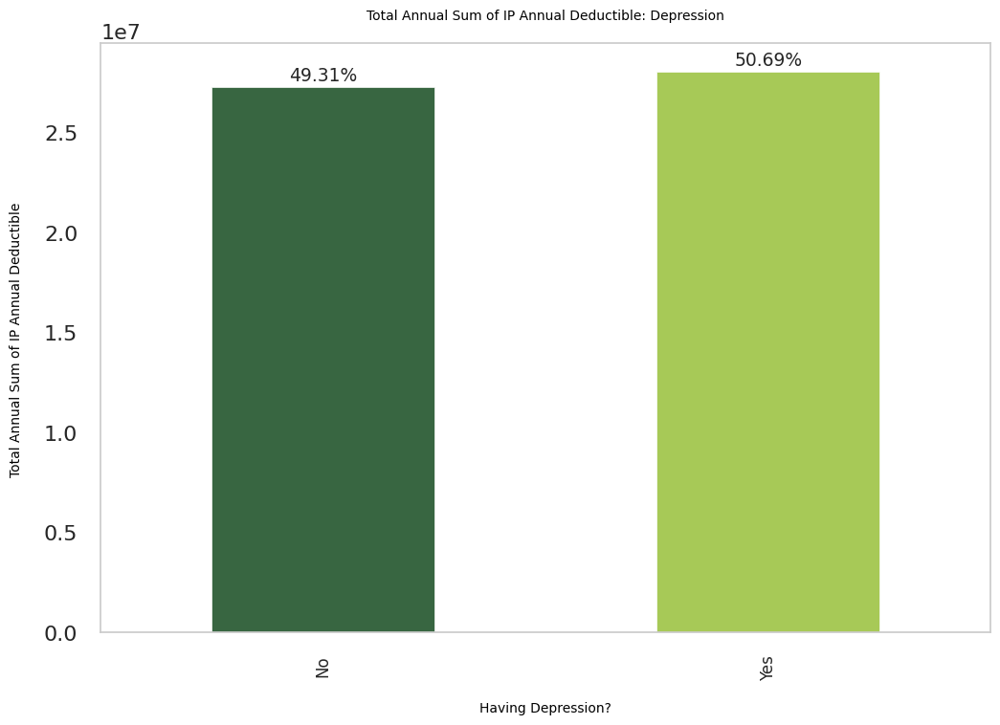

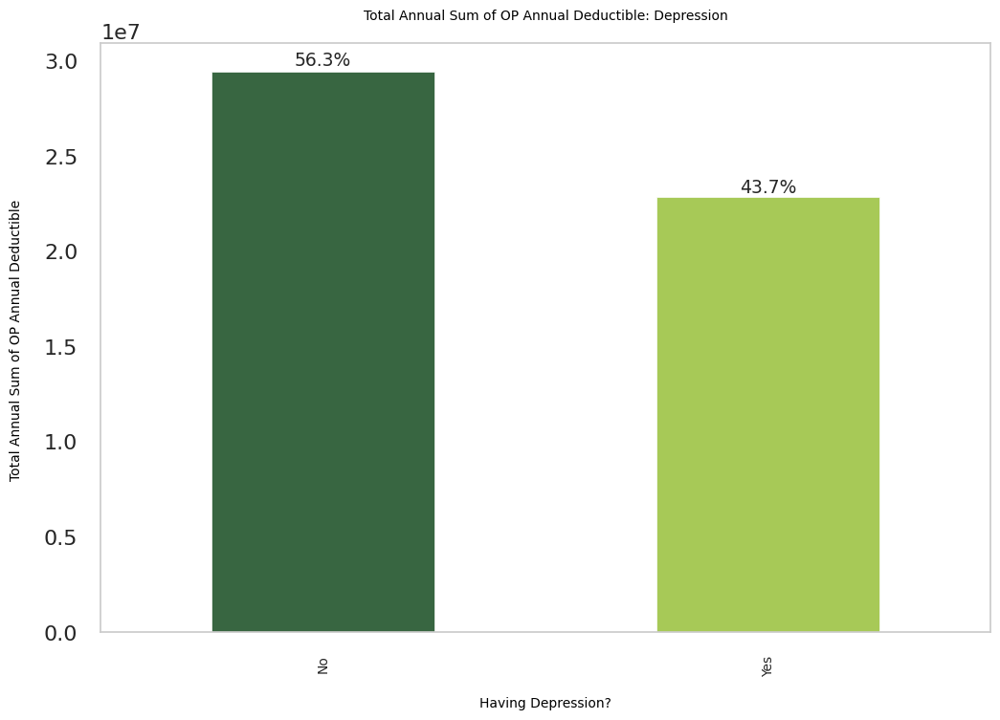

In [ ]:
# Examine the annual deductible amount for  'Depression'
plot_annual_deductible_by_condition(beneficiary,  'Depression',  'Depression')

MULTIVARIATE ANALYSIS

In [ ]:
# Number of beneficiaries with chronic heart disease
pd.DataFrame(beneficiary.groupby(['Alzheimer'])['BeneID'].count())


#Calculate the average IP reimbursement for benefiaries with Chronic heart failure
avg_CALZ_IP_R = pd.DataFrame(beneficiary.groupby(['Alzheimer'])['IPAnnualReimbursementAmt'].sum() / beneficiary.groupby(['Alzheimer'])['BeneID'].count())
avg_CALZ_IP_R.columns = ['AVG IP Reimbursement Amt']
avg_CALZ_IP_R

#Calculate the average IP deductible for benefiaries with Chronic heart failure
avg_CALZ_IP_D = pd.DataFrame(beneficiary.groupby(['Alzheimer'])['IPAnnualDeductibleAmt'].sum() / beneficiary.groupby(['Alzheimer'])['BeneID'].count())
avg_CALZ_IP_D.columns = ['AVG IP Co-payment Amt']
avg_CALZ_IP_D

#Calculate the average OP deductible for benefiaries with Chronic heart failure
avg_CALZ_OP_D = pd.DataFrame(beneficiary.groupby(['Alzheimer'])['OPAnnualDeductibleAmt'].sum() / beneficiary.groupby(['Alzheimer'])['BeneID'].count())
avg_CALZ_OP_D.columns = ['AVG OP Co-payment Amt']
avg_CALZ_OP_D

#Calculate the average OP reimbursement for benefiaries with Chronic heart failure
avg_CALZ_OP_R = pd.DataFrame(beneficiary.groupby(['Alzheimer'])['OPAnnualReimbursementAmt'].sum() / beneficiary.groupby(['Alzheimer'])['BeneID'].count())
avg_CALZ_OP_R.columns = ['AVG OP Reimbursement Amt']
avg_CALZ_OP_R


#concatenate the average cost for chronic heart failure

CALZ_avg = pd.concat([avg_CALZ_IP_R, avg_CALZ_OP_R, avg_CALZ_IP_D, avg_CALZ_OP_D], axis=1)
CALZ_avg

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
Alzheimer,,,,
0,2809.355777,1136.437372,293.962909,333.212472
1,5371.165863,1623.463477,612.715726,467.192044


           AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
Alzheimer                                                       
0                       2809.355777               1136.437372   
1                       5371.165863               1623.463477   

           AVG IP Co-payment Amt  AVG OP Co-payment Amt  
Alzheimer                                                
0                     293.962909             333.212472  
1                     612.715726             467.192044  


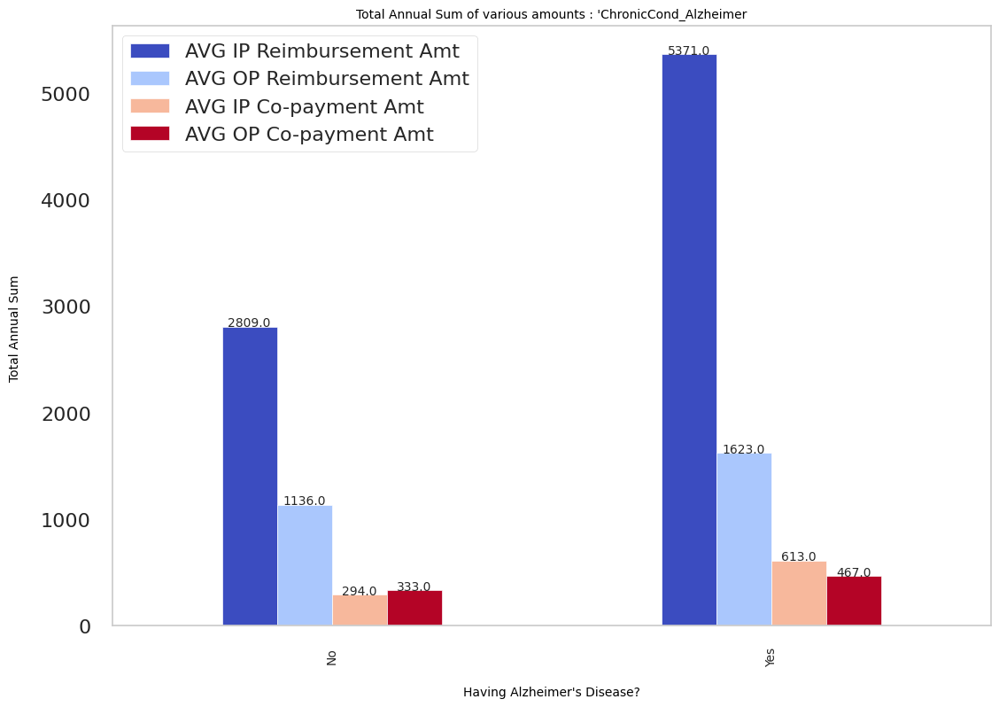

In [ ]:
with plt.style.context('seaborn-poster'):

  fig = CALZ_avg.plot(kind='bar', colormap='coolwarm')

  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height), ha='center', fontsize=10)

  plt.grid(False)
  plt.xlabel("\nHaving Alzheimer's Disease?", color = '#000', fontsize = 10)
  plt.xticks(ticks=[0,1], labels=['No', 'Yes'], fontsize=10)
  plt.ylabel("Total Annual Sum \n", color = '#000', fontsize = 10)

  plt.title("Total Annual Sum of various amounts : 'ChronicCond_Alzheimer", color = '#000', fontsize = 10)

print(CALZ_avg)

Average cost for beneficiaries with Depression

In [ ]:
# Number of beneficiaries with chronic heart disease
pd.DataFrame(beneficiary.groupby(['Depression'])['BeneID'].count())


#Calculate the average IP reimbursement for benefiaries with Chronic heart failure
avg_DEP_IP_R = pd.DataFrame(beneficiary.groupby(['Depression'])['IPAnnualReimbursementAmt'].sum() / beneficiary.groupby(['Depression'])['BeneID'].count())
avg_DEP_IP_R.columns = ['AVG IP Reimbursement Amt']
avg_DEP_IP_R

#Calculate the average IP deductible for benefiaries with Chronic heart failure
avg_DEP_IP_D = pd.DataFrame(beneficiary.groupby(['Depression'])['IPAnnualDeductibleAmt'].sum() / beneficiary.groupby(['Depression'])['BeneID'].count())
avg_DEP_IP_D.columns = ['AVG IP Co-payment Amt']
avg_DEP_IP_D

#Calculate the average OP deductible for benefiaries with Chronic heart failure
avg_DEP_OP_D = pd.DataFrame(beneficiary.groupby(['Depression'])['OPAnnualDeductibleAmt'].sum() / beneficiary.groupby(['Depression'])['BeneID'].count())
avg_DEP_OP_D.columns = ['AVG OP Co-payment Amt']
avg_DEP_OP_D

#Calculate the average OP reimbursement for benefiaries with Chronic heart failure
avg_DEP_OP_R = pd.DataFrame(beneficiary.groupby(['Depression'])['OPAnnualReimbursementAmt'].sum() / beneficiary.groupby(['Depression'])['BeneID'].count())
avg_DEP_OP_R.columns = ['AVG OP Reimbursement Amt']
avg_DEP_OP_R


#concatenate the average cost for chronic heart failure

DEP_avg = pd.concat([avg_DEP_IP_R, avg_DEP_OP_R, avg_DEP_IP_D, avg_DEP_OP_D], axis=1)

DEP_avg

,AVG IP Reimbursement Amt,AVG OP Reimbursement Amt,AVG IP Co-payment Amt,AVG OP Co-payment Amt
Depression,,,,
0,2909.102647,1129.606701,305.952607,329.963459
1,5022.162810,1603.871701,570.054771,464.285708


           AVG IP Reimbursement Amt  AVG OP Reimbursement Amt  \
Alzheimer                                                       
0                       2809.355777               1136.437372   
1                       5371.165863               1623.463477   

           AVG IP Co-payment Amt  AVG OP Co-payment Amt  
Alzheimer                                                
0                     293.962909             333.212472  
1                     612.715726             467.192044  


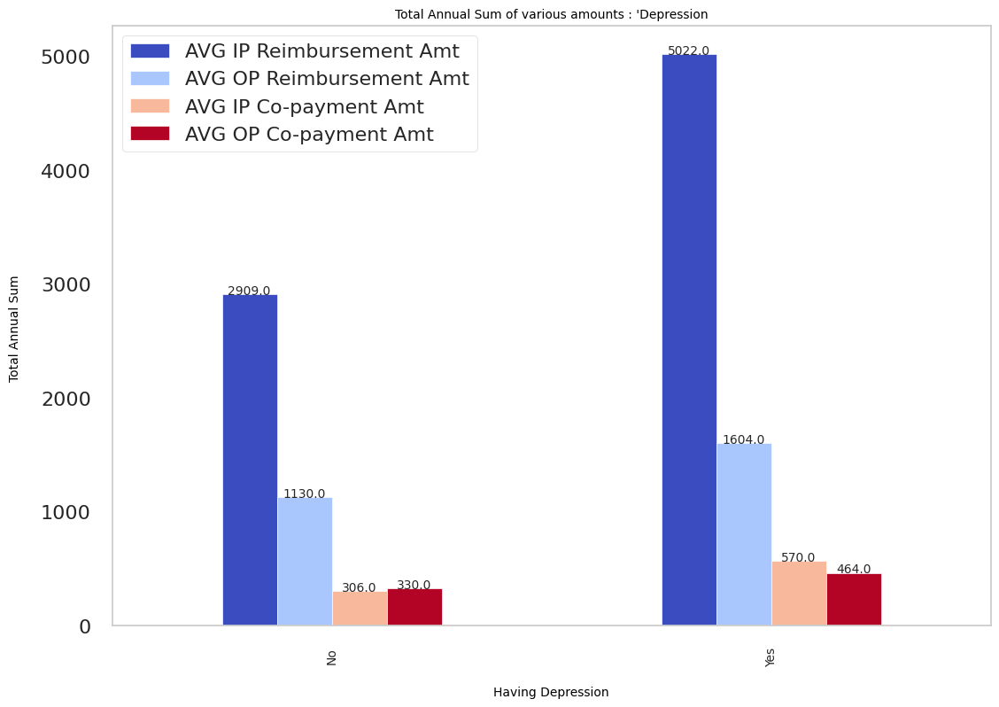

In [ ]:
with plt.style.context('seaborn-poster'):

  fig = DEP_avg.plot(kind='bar', colormap='coolwarm')

  for p in fig.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    fig.annotate(f'{round(height,0)}', (x + width/2, y + height), ha='center', fontsize=10)

  plt.grid(False)
  plt.xlabel("\nHaving Depression", color = '#000', fontsize = 10)
  plt.xticks(ticks=[0,1], labels=['No', 'Yes'], fontsize=10)
  plt.ylabel("Total Annual Sum \n", color = '#000', fontsize = 10)

  plt.title("Total Annual Sum of various amounts : 'Depression", color = '#000', fontsize = 10)

print(CALZ_avg)

In [ ]:
def plot_strip_plots(x_col, hue_col, y_col, lgd_title):
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(10, 7))
        sns.stripplot(data=beneficiary, x=x_col, y=y_col, hue=hue_col, palette='inferno')
        # Providing the labels and title to the graph
        plt.xlabel("\n{}".format(x_col), color='#000', fontsize=10)
        plt.xticks(rotation=90, size=10)
        plt.ylabel("{}\n".format(y_col), color='#000', fontsize=10)
        plt.grid(False)
        plt.title("Spread of payment paid by Insurer\n", color='#000', fontsize=13)
        plt.legend(loc='upper center', title=lgd_title)

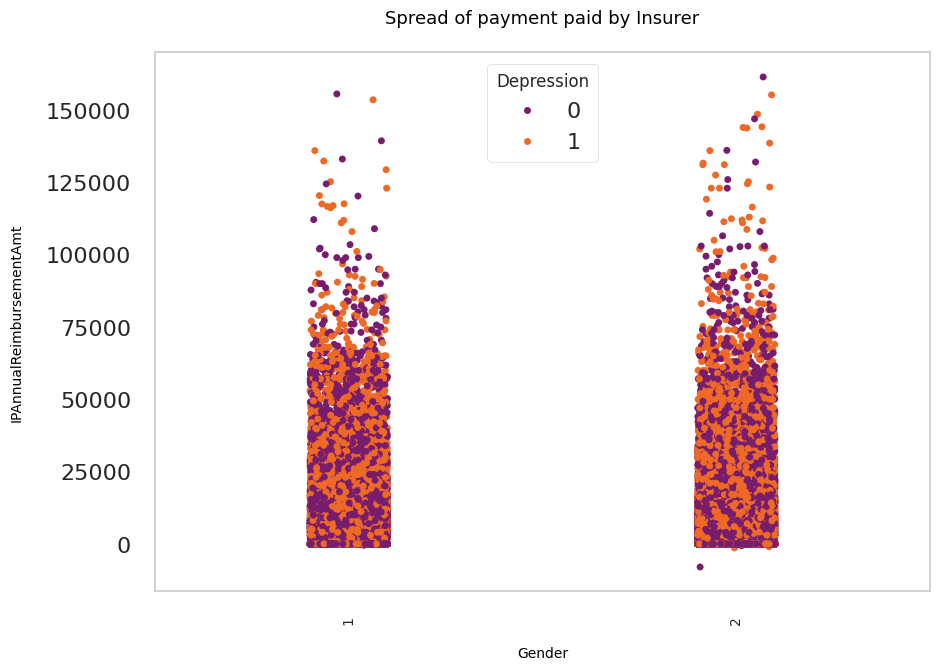

In [ ]:
plot_strip_plots(x_col='Gender', hue_col="Depression", y_col='IPAnnualReimbursementAmt', lgd_title="Depression")

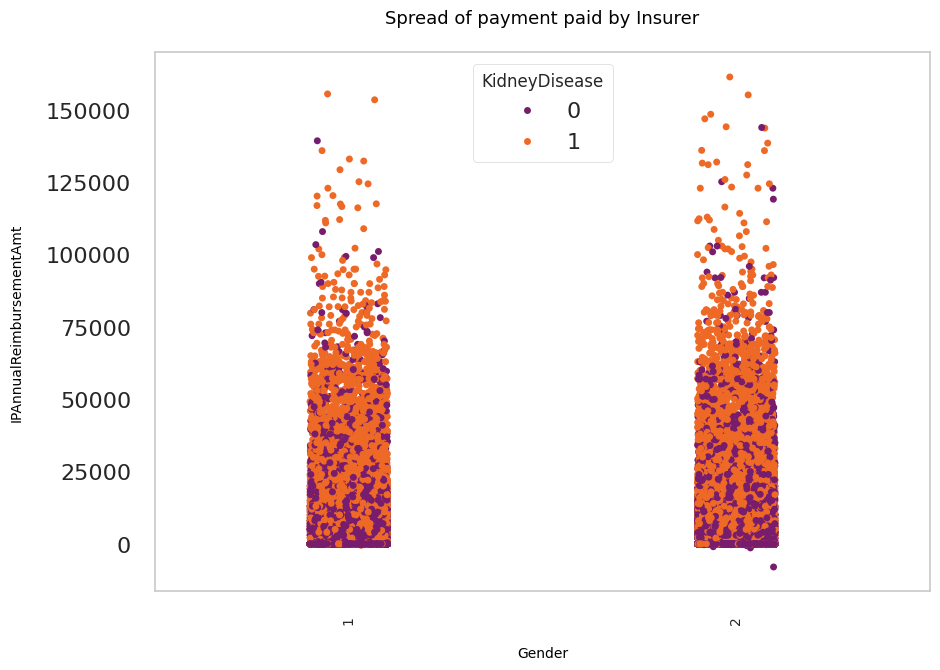

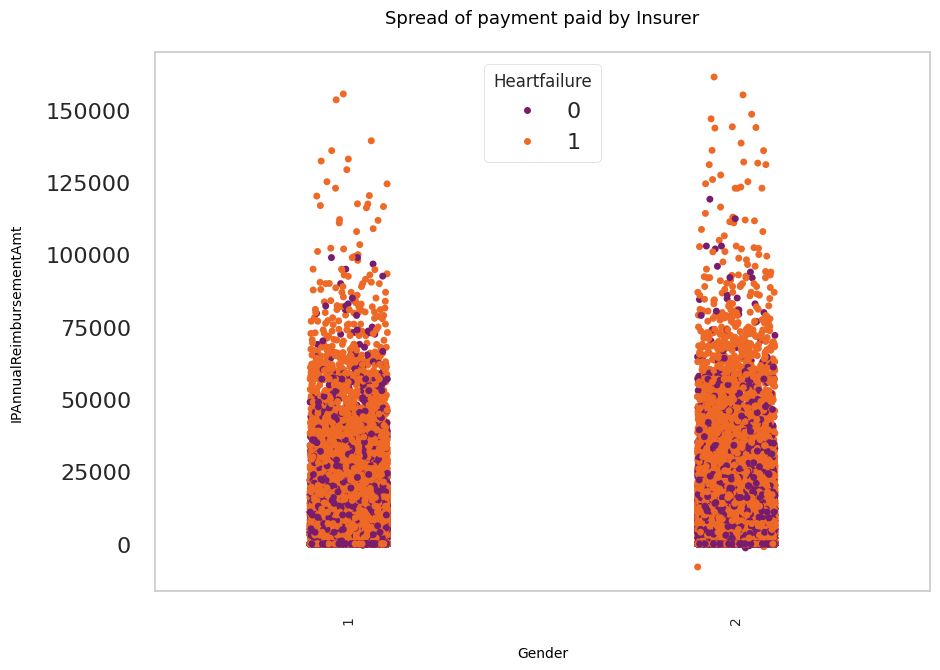

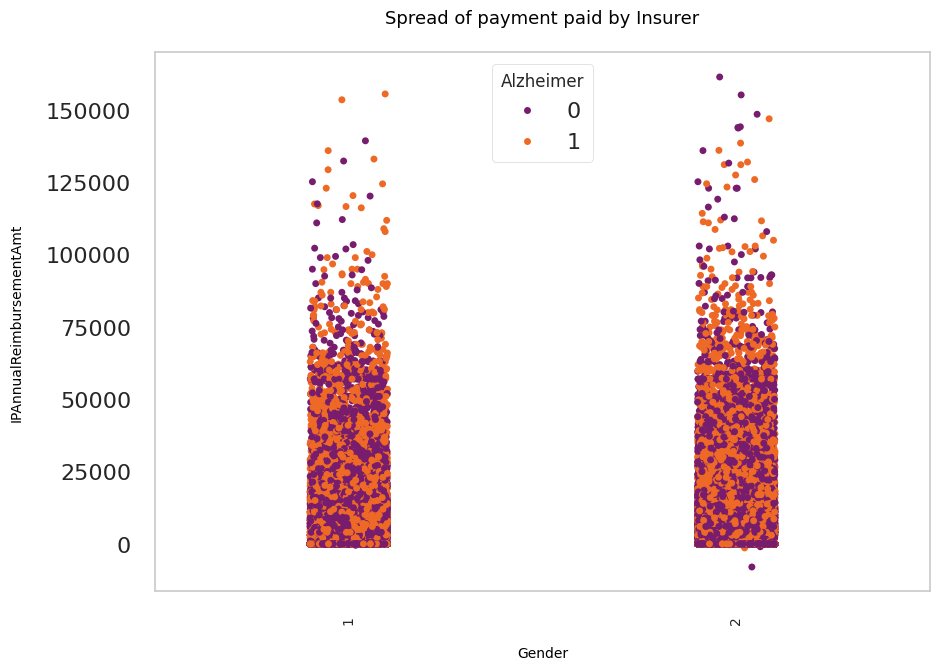

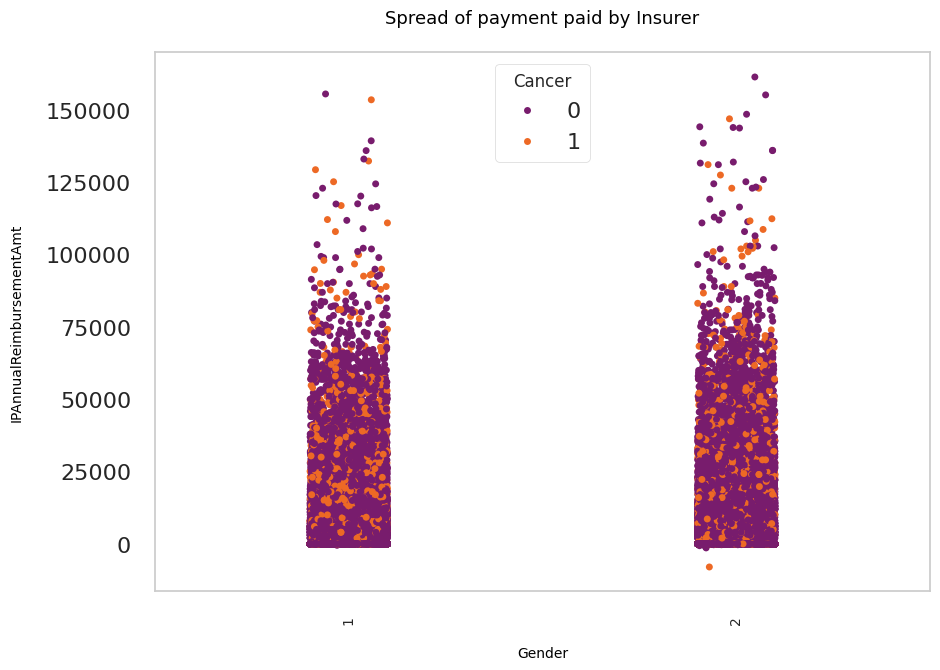

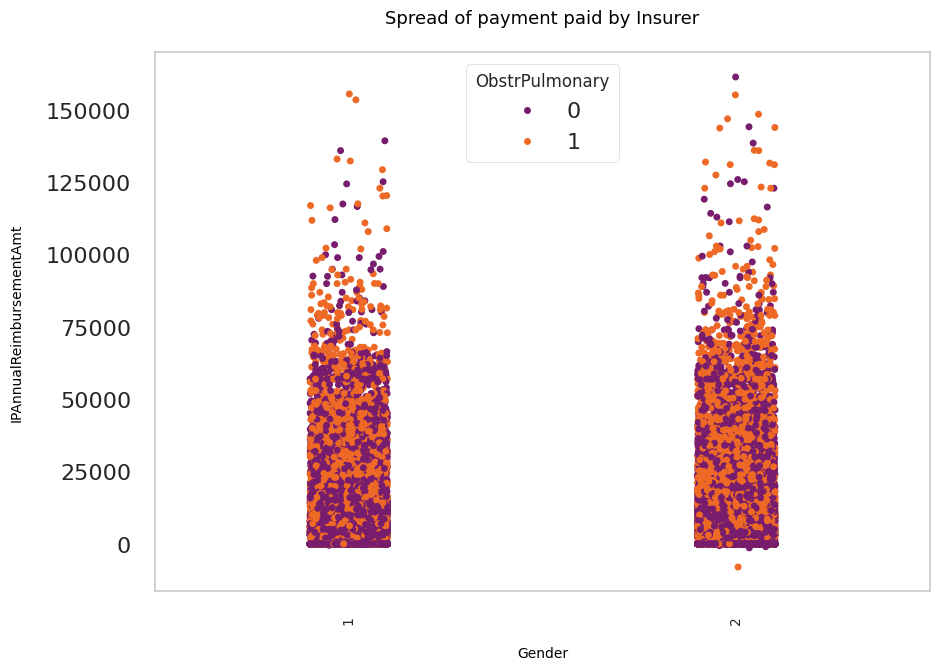

...

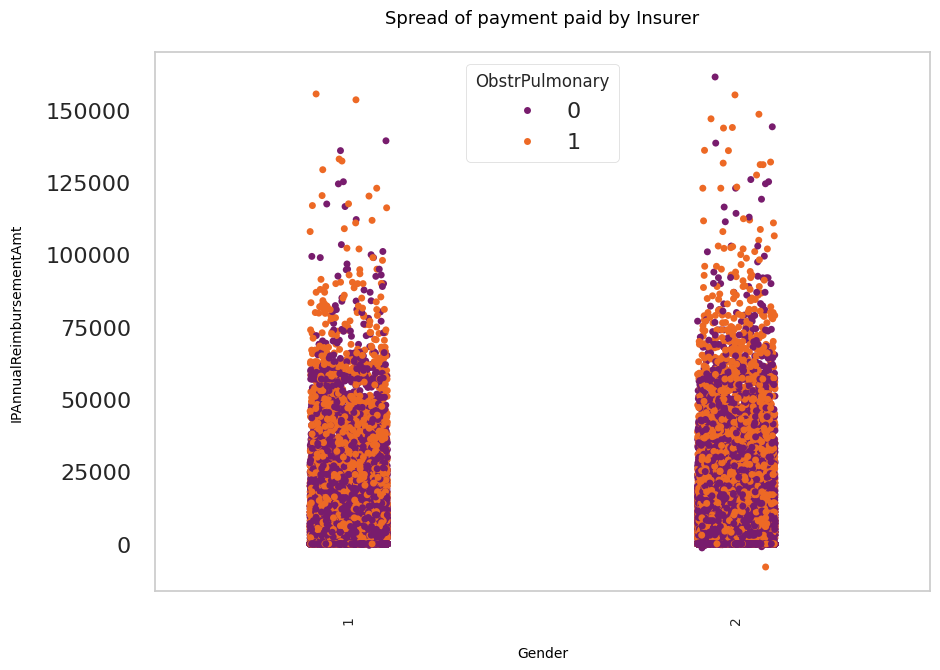

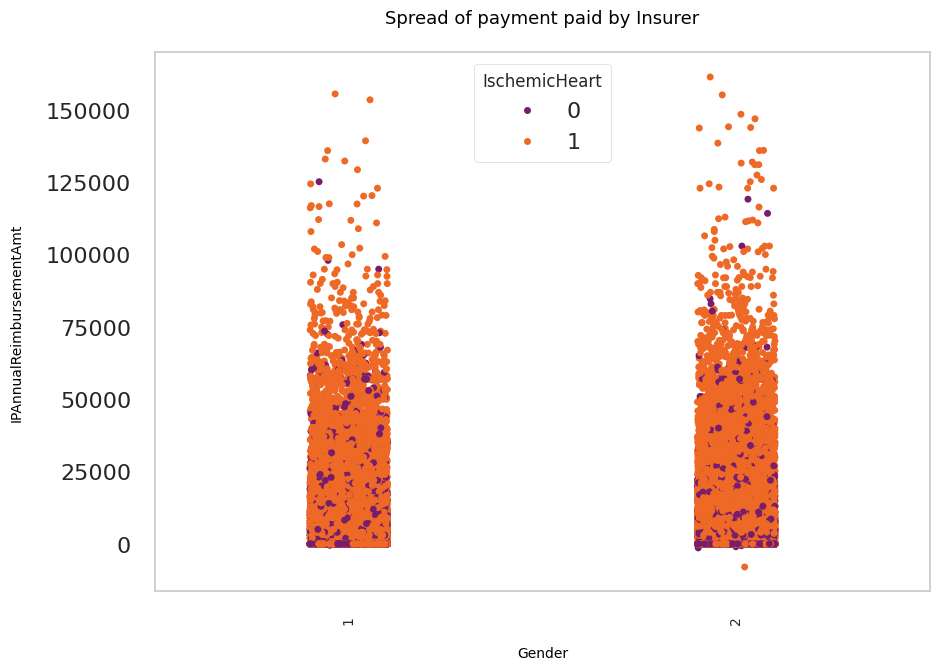

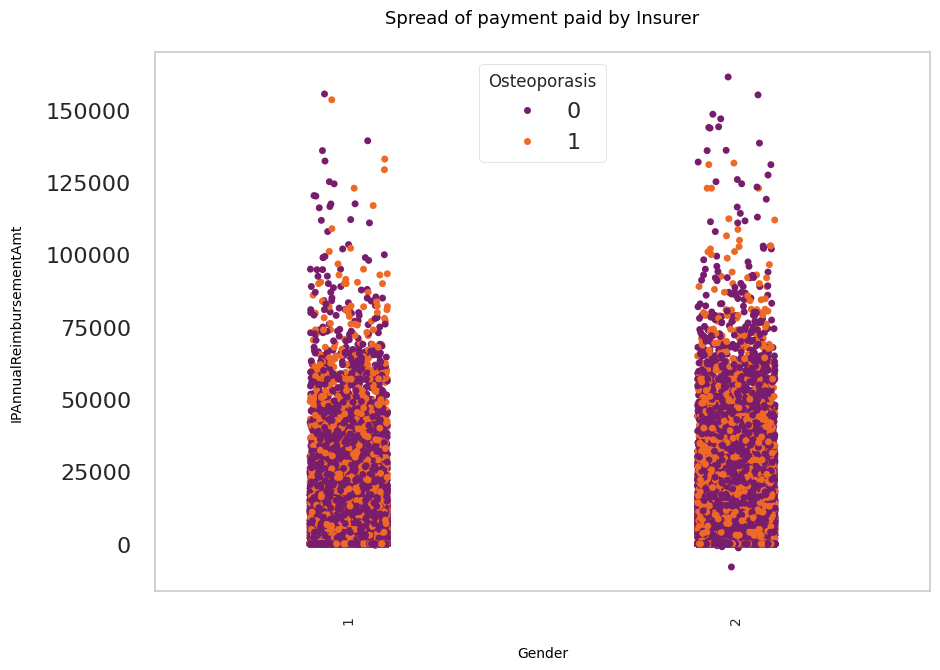

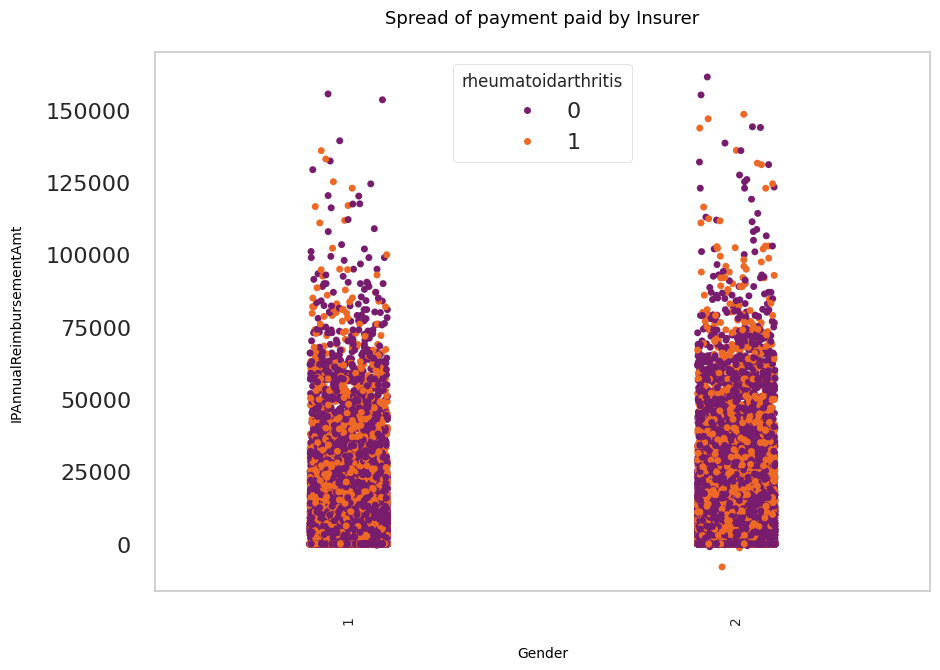

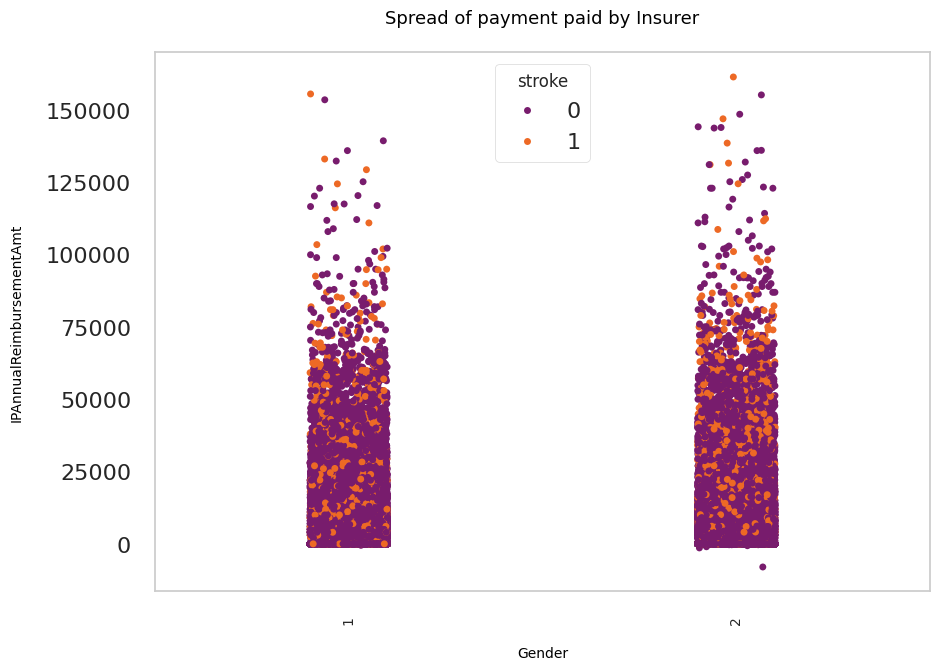

In [ ]:
# ('KidneyDisease'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='KidneyDisease', y_col='IPAnnualReimbursementAmt', lgd_title='KidneyDisease')

# ('Heartfailure'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='Heartfailure', y_col='IPAnnualReimbursementAmt', lgd_title='Heartfailure')

# (Alzheimer), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col="Alzheimer", y_col='IPAnnualReimbursementAmt', lgd_title="Alzheimer")

# ('Cancer'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Cancer', y_col='IPAnnualReimbursementAmt', lgd_title='Cancer')

# ('ObstrPulmonary'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='ObstrPulmonary', y_col='IPAnnualReimbursementAmt', lgd_title= 'ObstrPulmonary')

# (Alzheimer), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col="Depression", y_col='IPAnnualReimbursementAmt', lgd_title="Alzheimer")

# ('Diabetes'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Diabetes', y_col='IPAnnualReimbursementAmt', lgd_title='Diabetes')

# ('ObstrPulmonary'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='ObstrPulmonary', y_col='IPAnnualReimbursementAmt', lgd_title= 'ObstrPulmonary')

# ('IschemicHeart'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='IschemicHeart', y_col='IPAnnualReimbursementAmt', lgd_title='IschemicHeart')
# ('Osteoporasis'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Osteoporasis', y_col='IPAnnualReimbursementAmt', lgd_title='Osteoporasis')

# ('rheumatoidarthritis'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='rheumatoidarthritis', y_col='IPAnnualReimbursementAmt', lgd_title= 'rheumatoidarthritis')

# ('IschemicHeart'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'stroke', y_col='IPAnnualReimbursementAmt', lgd_title= 'stroke')

Exploring Annual reimbursement cost for outpatient visists for each medical condition

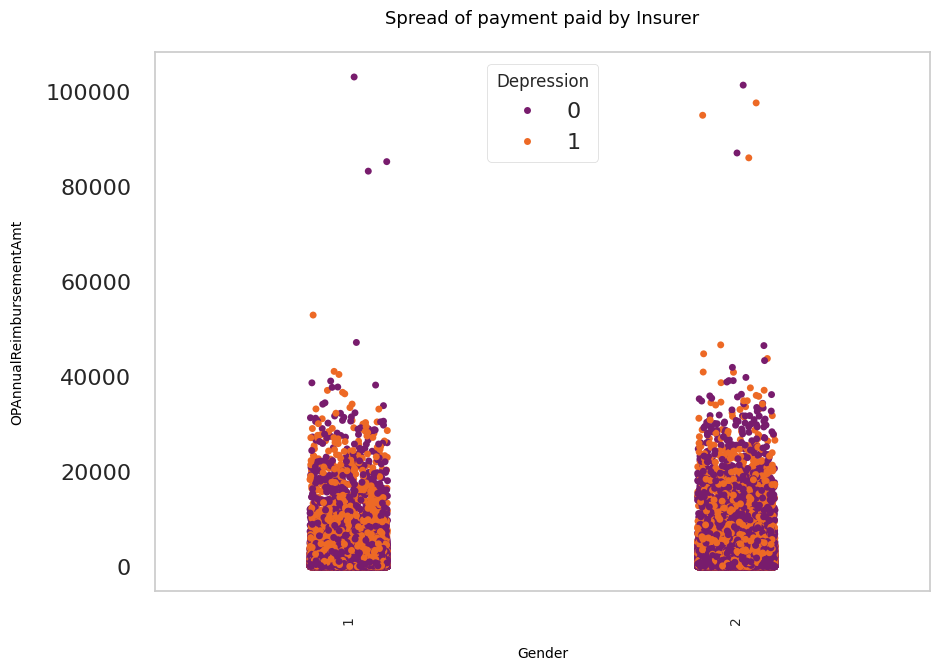

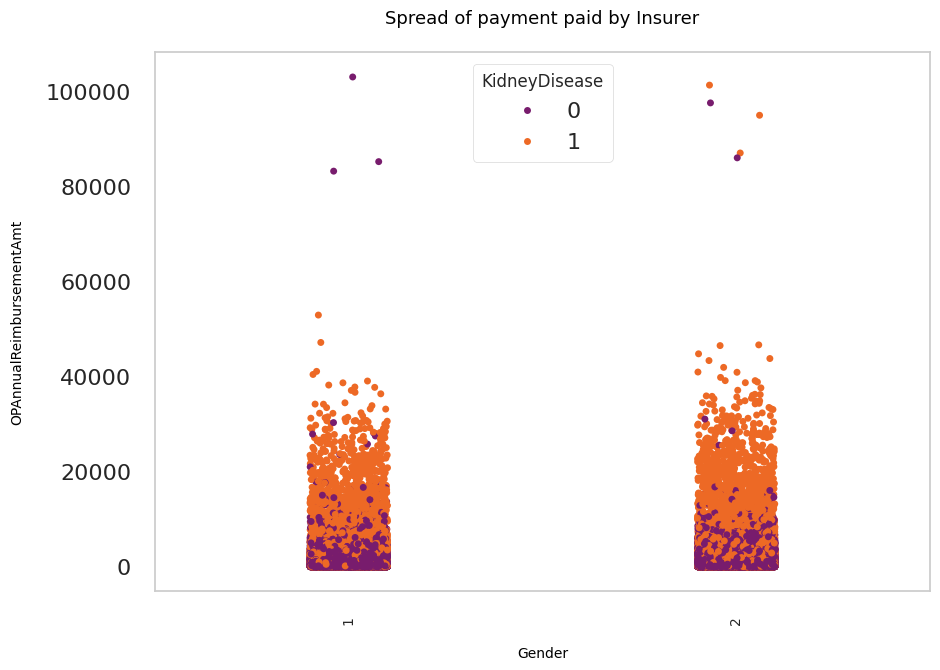

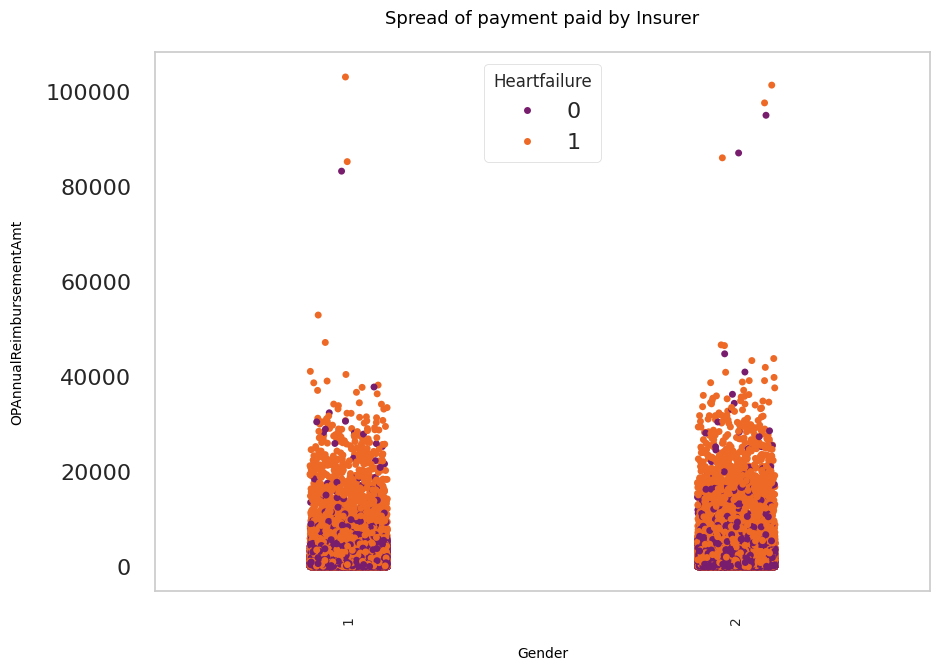

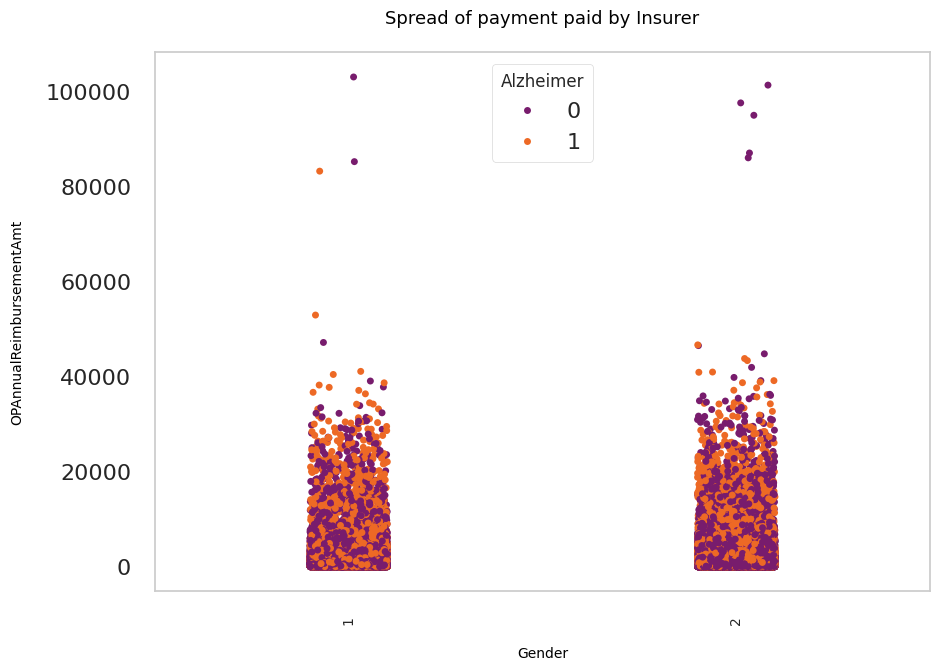

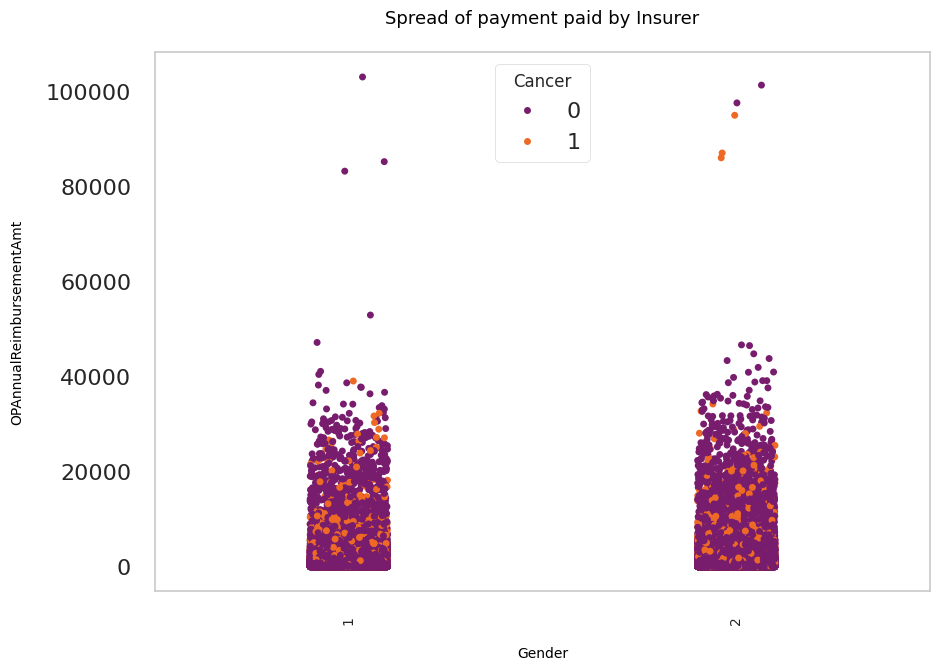

...

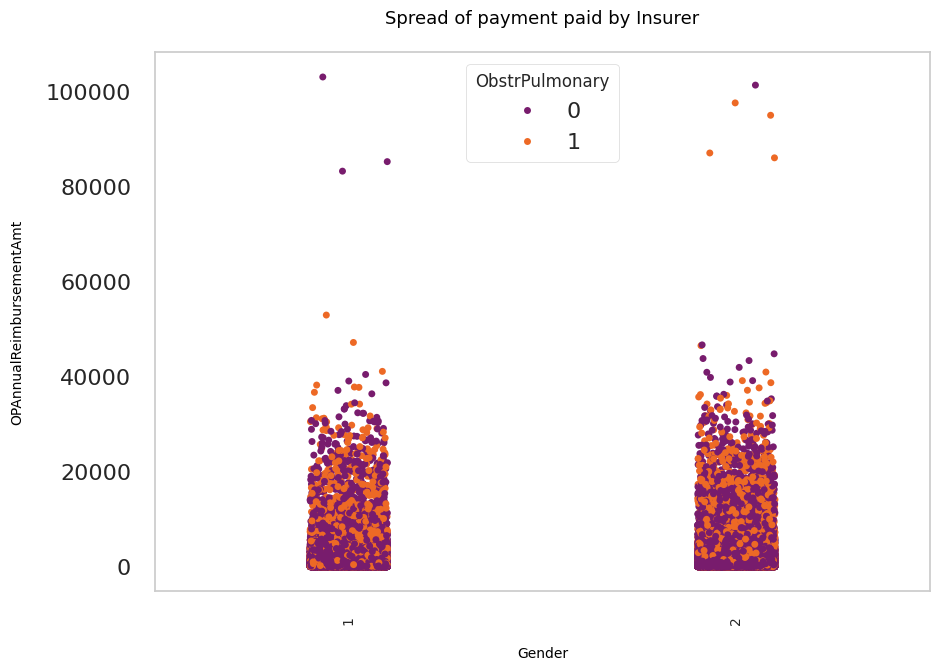

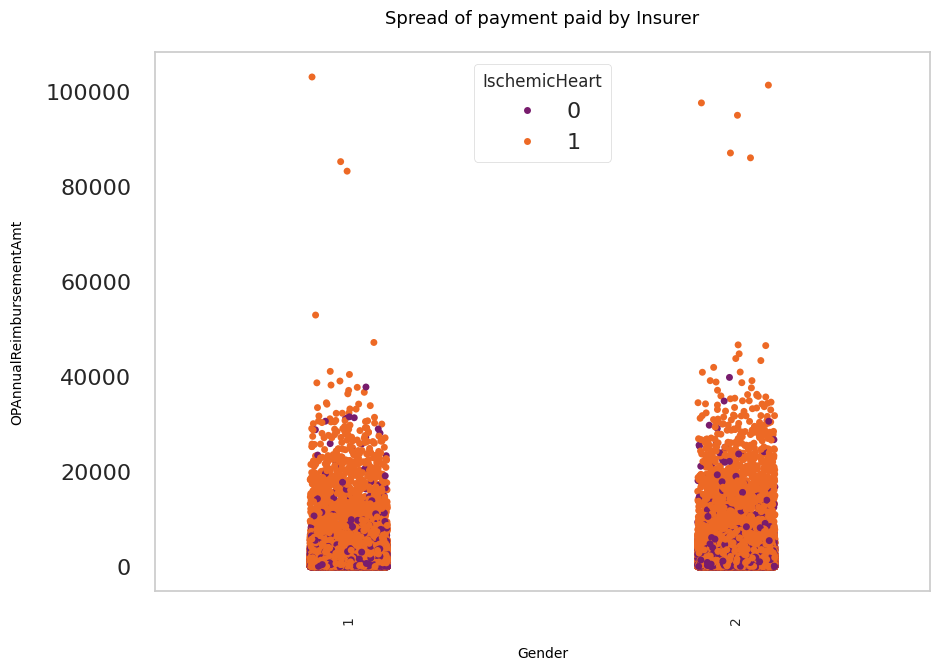

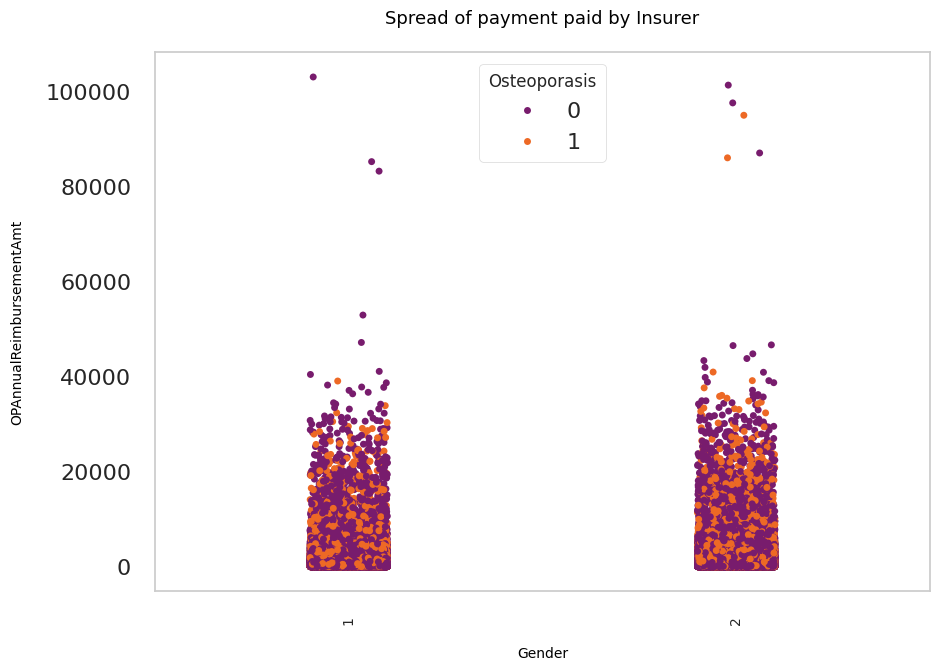

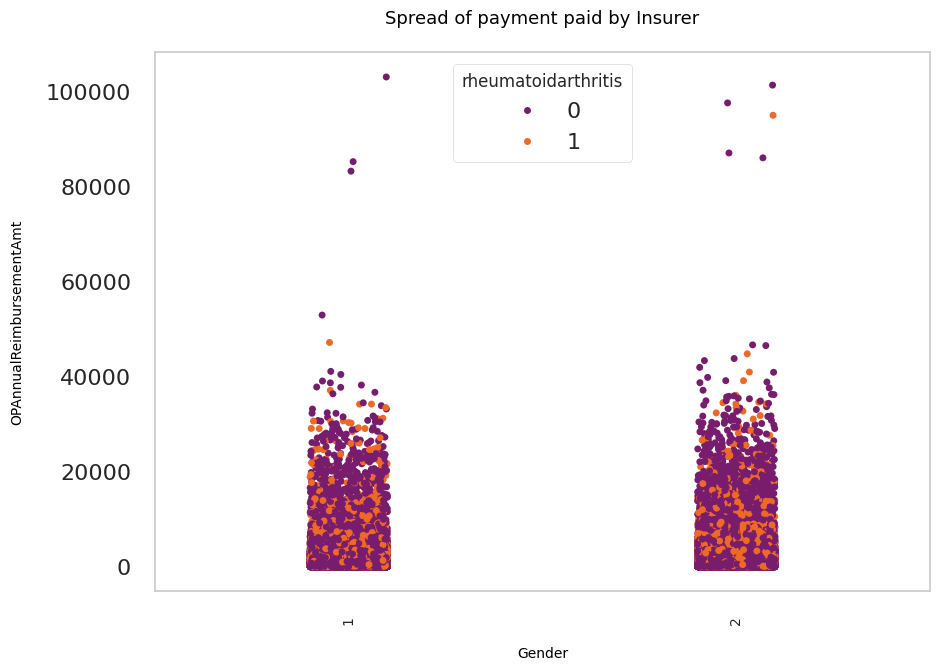

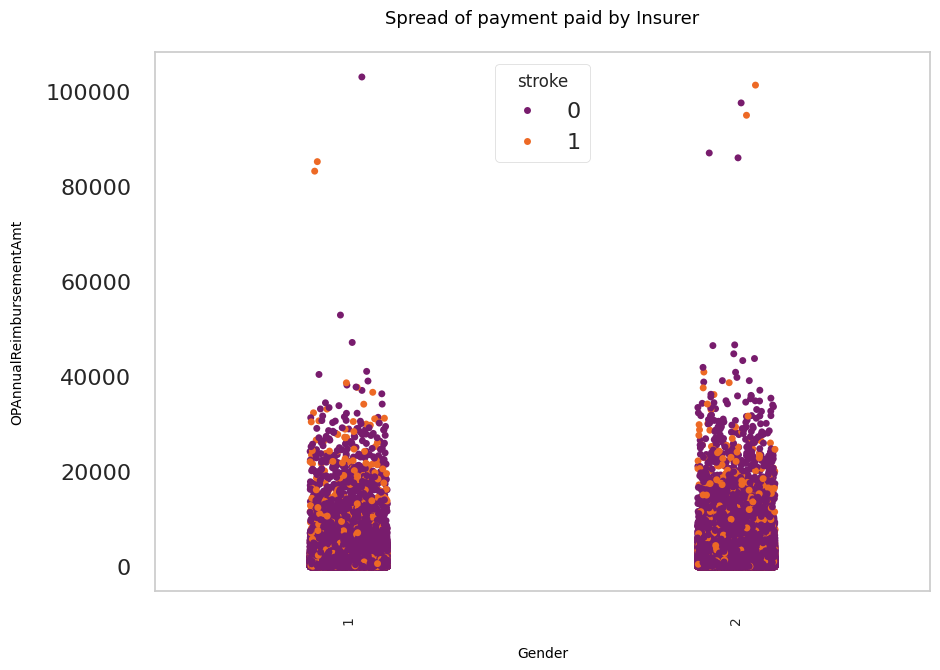

In [ ]:
plot_strip_plots(x_col='Gender', hue_col="Depression", y_col='OPAnnualReimbursementAmt', lgd_title="Depression")

# ('KidneyDisease'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='KidneyDisease', y_col='OPAnnualReimbursementAmt', lgd_title='KidneyDisease')

# ('Heartfailure'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='Heartfailure', y_col='OPAnnualReimbursementAmt', lgd_title='Heartfailure')

# (Alzheimer), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col="Alzheimer", y_col='OPAnnualReimbursementAmt', lgd_title="Alzheimer")

# ('Cancer'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Cancer', y_col='OPAnnualReimbursementAmt', lgd_title='Cancer')

# ('ObstrPulmonary'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='ObstrPulmonary', y_col='OPAnnualReimbursementAmt', lgd_title= 'ObstrPulmonary')

# (Alzheimer), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col="Depression", y_col='OPAnnualReimbursementAmt', lgd_title="Depression")

# ('Diabetes'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Diabetes', y_col='OPAnnualReimbursementAmt', lgd_title='Diabetes')

# ('ObstrPulmonary'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='ObstrPulmonary', y_col='OPAnnualReimbursementAmt', lgd_title= 'ObstrPulmonary')

# ('IschemicHeart'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='IschemicHeart', y_col='OPAnnualReimbursementAmt', lgd_title='IschemicHeart')
# ('Osteoporasis'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'Osteoporasis', y_col='OPAnnualReimbursementAmt', lgd_title='Osteoporasis')

# ('rheumatoidarthritis'), (IPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col='rheumatoidarthritis', y_col='OPAnnualReimbursementAmt', lgd_title= 'rheumatoidarthritis')

# ('IschemicHeart'), (OPAnnualReimbursementAmt), and (GENDER)
plot_strip_plots(x_col='Gender', hue_col= 'stroke', y_col='OPAnnualReimbursementAmt', lgd_title= 'stroke')

Examining annual expeniture across the age distribution

<ipython-input-60-4af82a1e9a5f>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=beneficiary, x='Age', y='IPAnnualReimbursementAmt', palette='inferno')


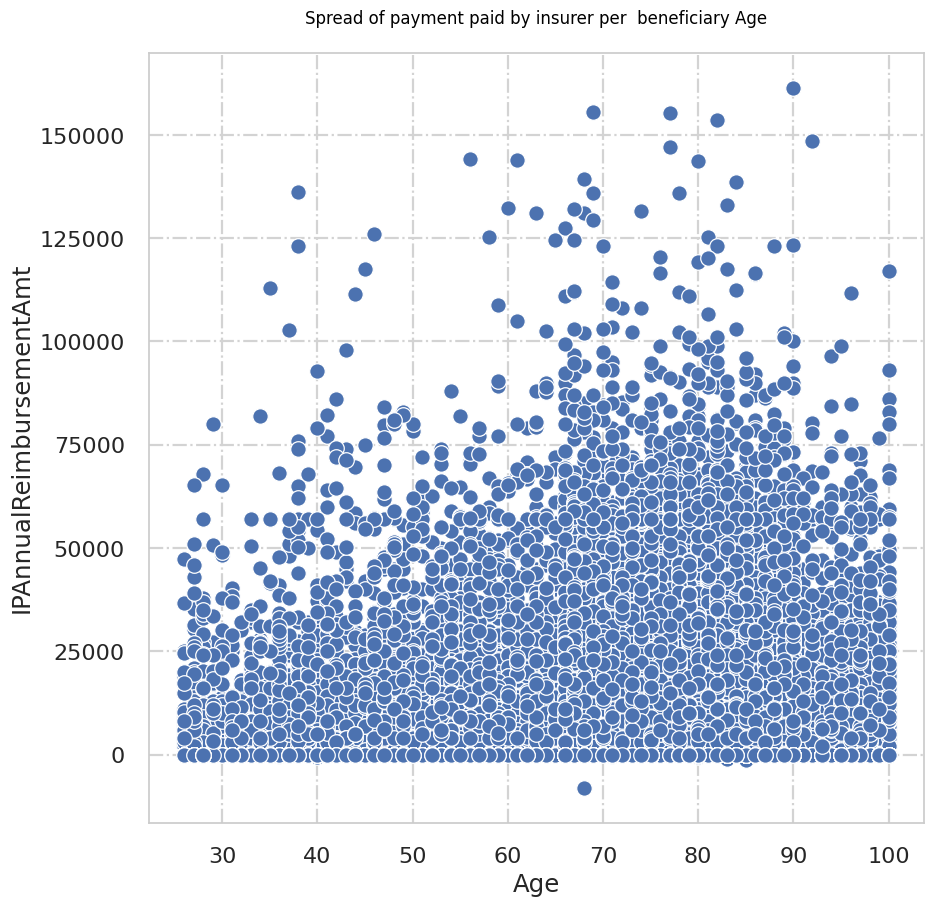

In [ ]:
#Annual expenditure for IP Beneficiaries
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,10))
    sns.scatterplot(data=beneficiary, x='Age', y='IPAnnualReimbursementAmt', palette='inferno')
    plt.grid(which='major', linestyle="-.", color='lightgray')
    plt.minorticks_on()
    plt.title("Spread of payment paid by insurer per  beneficiary Age\n", color= '#000', fontsize = 12)

<ipython-input-61-3f389850d81d>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=beneficiary, x='Age', y='OPAnnualReimbursementAmt', palette='inferno')


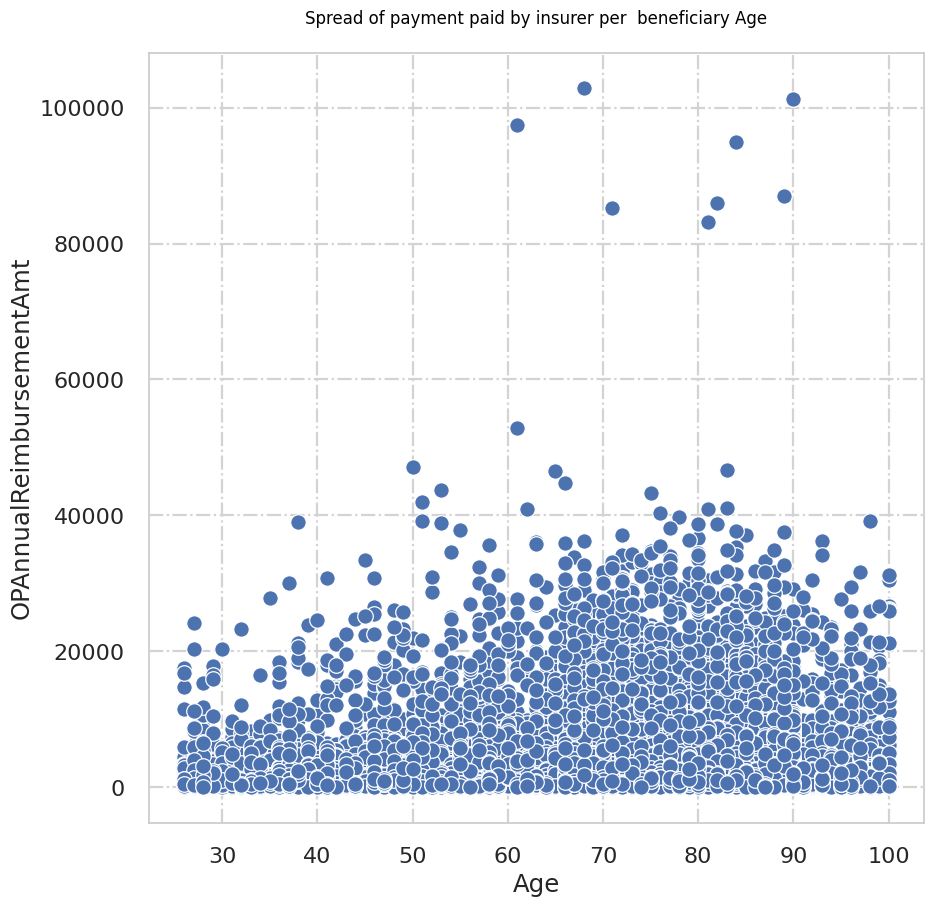

In [ ]:
#Annual expenditure for OP Beneficiaries
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,10))
    sns.scatterplot(data=beneficiary, x='Age', y='OPAnnualReimbursementAmt', palette='inferno')
    plt.grid(which='major', linestyle="-.", color='lightgray')
    plt.minorticks_on()
    plt.title("Spread of payment paid by insurer per  beneficiary Age\n", color= '#000', fontsize = 12)

EDA to investigate hospital visits

   Only In-patients  Only Out-patients
0             26713             107267


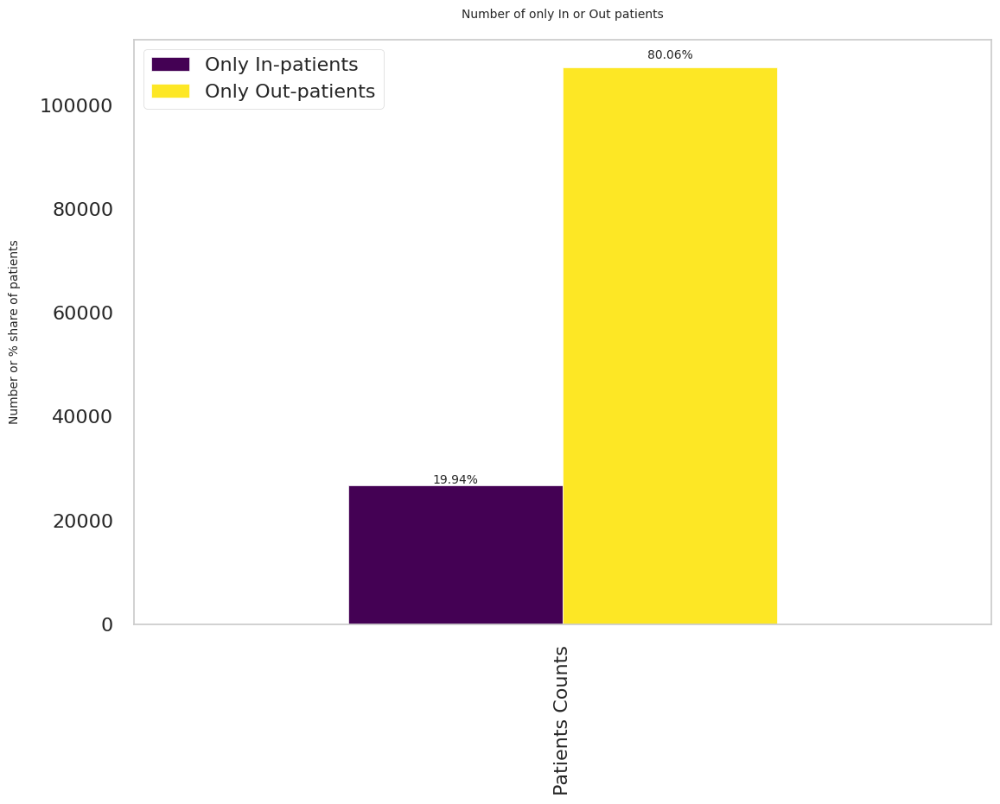

In [ ]:
ip_beneficiary = set(inpatient['BeneID'])
op_beneficiary = set(outpatient['BeneID'])

len(ip_beneficiary), len(op_beneficiary)

#beneficiaries who were either IP or OP

only_in_patients = ip_beneficiary.intersection(op_beneficiary)
len(only_in_patients)

only_out_patients = op_beneficiary.difference(ip_beneficiary)
len(only_out_patients)

#total number of patients
tot_patients = len(only_in_patients) + len(only_out_patients)
tot_patients

#Unique count of patients/ beneficiaries

patients_counts = pd.DataFrame([len(only_in_patients), len(only_out_patients)]).T
patients_counts.columns = ['Only In-patients', 'Only Out-patients']
print(patients_counts)

#Plot distribution of patients
with plt.style.context('seaborn-poster'):
    fig = patients_counts.plot(kind='bar',colormap='viridis')
for p in fig.patches:
        width = p.get_width()
        height = p.get_height()
        x, y = p.get_xy()
        fig.annotate(f'{str(round((height*100)/tot_patients,2))+"%"}', (x + width/2, y + height*1.015), ha='center', fontsize=10)

plt.xticks(labels=["Patients Counts"], ticks=[0])
plt.ylabel("Number or % share of patients\n", fontsize =10)
plt.grid(False)
plt.title("Number of only In or Out patients\n", fontsize = 10)
plt.plot();


In [ ]:
print(inpatient.shape)


(40474, 30)


In [ ]:
print(inpatient.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40474 entries, 0 to 40473
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   BeneID                  40474 non-null  object 
 1   ClaimID                 40474 non-null  object 
 2   ClaimStartDt            40474 non-null  object 
 3   ClaimEndDt              40474 non-null  object 
 4   Provider                40474 non-null  object 
 5   InscClaimAmtReimbursed  40474 non-null  int64  
 6   AttendingPhysician      40362 non-null  object 
 7   OperatingPhysician      23830 non-null  object 
 8   OtherPhysician          4690 non-null   object 
 9   AdmissionDt             40474 non-null  object 
 10  ClmAdmitDiagnosisCode   40474 non-null  object 
 11  DeductibleAmtPaid       39575 non-null  float64
 12  DischargeDt             40474 non-null  object 
 13  DiagnosisGroupCode      40474 non-null  object 
 14  ClmDiagnosisCode_1      40474 non-null

In [ ]:
print(inpatient.isnull().sum())

BeneID                        0
ClaimID                       0
ClaimStartDt                  0
ClaimEndDt                    0
Provider                      0
InscClaimAmtReimbursed        0
AttendingPhysician          112
OperatingPhysician        16644
OtherPhysician            35784
AdmissionDt                   0
ClmAdmitDiagnosisCode         0
DeductibleAmtPaid           899
DischargeDt                   0
DiagnosisGroupCode            0
ClmDiagnosisCode_1            0
ClmDiagnosisCode_2          226
ClmDiagnosisCode_3          676
ClmDiagnosisCode_4         1534
ClmDiagnosisCode_5         2894
ClmDiagnosisCode_6         4838
ClmDiagnosisCode_7         7258
ClmDiagnosisCode_8         9942
ClmDiagnosisCode_9        13497
ClmDiagnosisCode_10       36547
ClmProcedureCode_1        17326
ClmProcedureCode_2        35020
ClmProcedureCode_3        39509
ClmProcedureCode_4        40358
ClmProcedureCode_5        40465
ClmProcedureCode_6        40474
dtype: int64


In [ ]:
#Change the date format from object to the date time format
inpatient['ClaimStartDt'] = pd.to_datetime(inpatient['ClaimStartDt'], format="%Y-%m-%d")
inpatient['ClaimEndDt'] = pd.to_datetime(inpatient['ClaimEndDt'], format="%Y-%m-%d")

In [ ]:
inpatient['Claim_Duration'] = (inpatient['ClaimEndDt'] - inpatient['ClaimStartDt']).dt.days

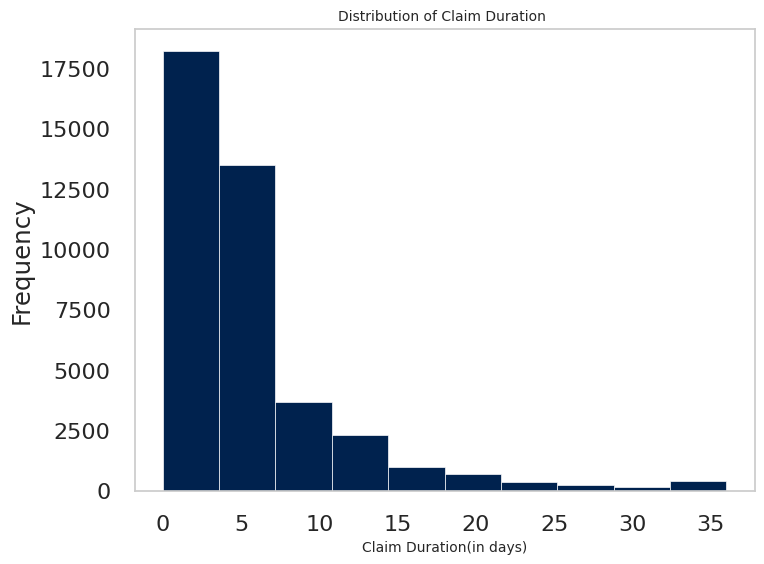

In [ ]:
#plot the distribution of claims duration of the inpatient data

with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(8,6))
    inpatient['Claim_Duration'].plot(kind='hist', colormap="cividis");

    plt.xlabel("Claim Duration(in days)", fontsize = 10)
    plt.minorticks_on()
    plt.grid(False)
    plt.title("Distribution of Claim Duration ", fontsize = 10)
    plt.plot();

<ipython-input-69-9211cab5a565>:14: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=avg_reimbursement_per_duration, x='Claim_Duration', y='InscClaimAmtReimbursed', palette='viridis')


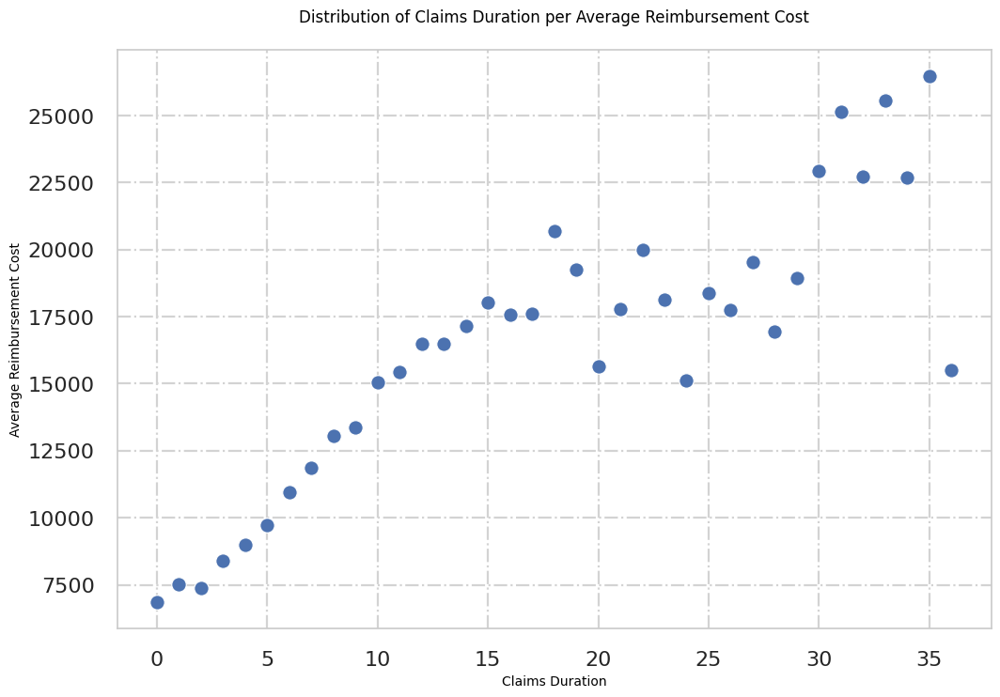

In [ ]:
# Compute the average
# Extract relevant columns for calculations
selected_columns = ['ClaimID', 'InscClaimAmtReimbursed', 'Claim_Duration']

# Filter data for non-zero reimbursements
inpatient_nonzero_reimbursements = inpatient[inpatient['InscClaimAmtReimbursed'] > 0][selected_columns]

# Calculate average reimbursement per claim duration
avg_reimbursement_per_duration = inpatient_nonzero_reimbursements.groupby('Claim_Duration')['InscClaimAmtReimbursed'].mean().reset_index()

# Plot the distribution of claims duration per average reimbursement cost
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12, 8))
    sns.scatterplot(data=avg_reimbursement_per_duration, x='Claim_Duration', y='InscClaimAmtReimbursed', palette='viridis')
    #sns.lineplot(data=avg_reimbursement_per_duration, x='Claim_Duration', y='InscClaimAmtReimbursed', palette='viridis')
    plt.grid(which='major', linestyle="-.", color='lightgray')
    plt.minorticks_on()
    plt.title("Distribution of Claims Duration per Average Reimbursement Cost\n", color='#000', fontsize=12)
    plt.xlabel("Claims Duration", color='#000', fontsize=10)
    plt.ylabel("Average Reimbursement Cost", color='#000', fontsize=10)

plt.show()


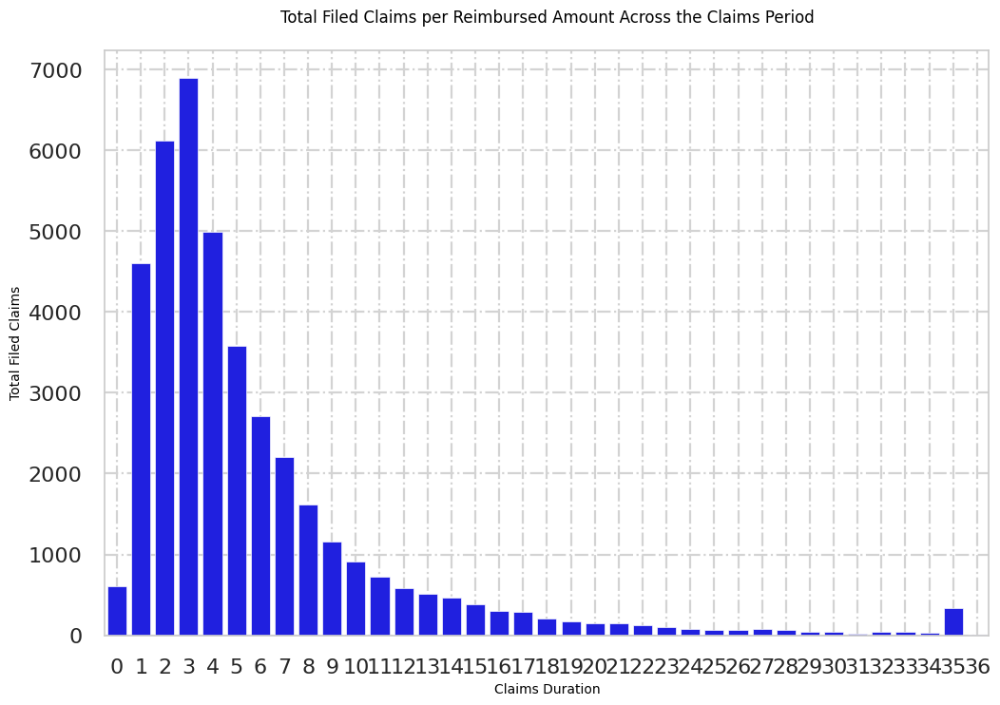

In [ ]:

# Extract relevant columns for calculations
selected_columns = ['ClaimID', 'InscClaimAmtReimbursed', 'Claim_Duration']

# Calculate total filed claims per claim duration
total_claims_per_duration = inpatient.groupby('Claim_Duration')['ClaimID'].count().reset_index()

# Plot the graph of total filed claims per reimbursed amount across the claims period
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(12, 8))
    sns.barplot(data=total_claims_per_duration, x='Claim_Duration', y='ClaimID', color='blue')
    plt.grid(which='major', linestyle="-.", color='lightgray')
    plt.minorticks_on()
    plt.title("Total Filed Claims per Reimbursed Amount Across the Claims Period\n", color='#000', fontsize=12)
    plt.xlabel("Claims Duration", color='#000', fontsize=10)
    plt.ylabel("Total Filed Claims", color='#000', fontsize=10)

plt.show()


In [ ]:


# Convert attributes data type from object to datetime
inpatient['DischargeDt'] = pd.to_datetime(inpatient['DischargeDt'], format="%Y-%m-%d")
inpatient['AdmissionDt'] = pd.to_datetime(inpatient['AdmissionDt'], format="%Y-%m-%d")

# Create a new attribute "admittedDays" representing the number of days a patient was admitted
inpatient['admittedDays'] = (inpatient['DischargeDt'] - inpatient['AdmissionDt']).dt.days

# Identify claims with a different duration than the number of days a patient was admitted
claims_with_diff_duration = inpatient[inpatient['Claim_Duration'] != inpatient['admittedDays']]

# Display the first 3 rows of claims with different duration
#print(claims_with_diff_duration.head(3))



In [ ]:

# Calculate the total reimbursed amount for claims with different duration
total_reimbursed_amount_diff_duration = claims_with_diff_duration['InscClaimAmtReimbursed'].sum()

# Display the total reimbursed amount and the shape of the DataFrame
print(f"Total Reimbursed Amount for Claims with Different Duration: {total_reimbursed_amount_diff_duration}")
print(f"Shape of DataFrame for Claims with Different Duration: {claims_with_diff_duration.shape}")

Total Reimbursed Amount for Claims with Different Duration: 671400
Shape of DataFrame for Claims with Different Duration: (49, 32)


In [ ]:
inpatient['Provider'].nunique()

#determine the total claims filed per provider
prv_total_claim_filed = pd.DataFrame(inpatient.groupby(['Provider'])['ClaimID'].count())
prv_total_claim_reimbursed = pd.DataFrame(inpatient.groupby(['Provider'])['InscClaimAmtReimbursed'].sum())

prv_claims_filed_vs_reimbursed = pd.merge(left=prv_total_claim_filed, right=prv_total_claim_reimbursed, how='inner',
                                                  left_on=prv_total_claim_filed.index, right_on=prv_total_claim_reimbursed.index)

prv_claims_filed_vs_reimbursed.columns = ['ProviderID', 'Tot_Claims_Filed', 'Tot_Re_Imbursed_Amt']
prv_claims_filed_vs_reimbursed.reset_index(drop=True,inplace=True)
prv_claims_filed_vs_reimbursed['Percentage_out_of_tot_reimb_amt'] = round((prv_claims_filed_vs_reimbursed['Tot_Re_Imbursed_Amt'] / inpatient['InscClaimAmtReimbursed'].sum()) * 100, 3)

prv_max_reimbursed_amt = pd.DataFrame(inpatient.groupby(['Provider'])['InscClaimAmtReimbursed'].max())
prv_max_reimbursed_amt.rename(columns={"InscClaimAmtReimbursed": "Max_Re_Imbursed_Amt"}, inplace=True)

prv_total_filed_vs_max_reimbursed = pd.merge(left=prv_claims_filed_vs_reimbursed,
                                                  right=prv_max_reimbursed_amt, how='inner',
                                                  left_on=prv_claims_filed_vs_reimbursed['ProviderID'],
                                                  right_on=prv_max_reimbursed_amt.index)

prv_total_filed_vs_max_reimbursed.drop(['key_0'], axis=1, inplace=True)
prv_total_filed_vs_max_reimbursed['Diff_in_Tot_and_Max'] = prv_claims_filed_vs_reimbursed['Tot_Re_Imbursed_Amt'] - \
prv_total_filed_vs_max_reimbursed['Max_Re_Imbursed_Amt']




In [ ]:
prv_total_filed_vs_max_reimbursed.head(4)

,ProviderID,Tot_Claims_Filed,Tot_Re_Imbursed_Amt,Percentage_out_of_tot_reimb_amt,Max_Re_Imbursed_Amt,Diff_in_Tot_and_Max
0,PRV51001,5,97000,0.024,42000,55000
1,PRV51003,62,573000,0.140,57000,516000
2,PRV51007,3,19000,0.005,10000,9000
3,PRV51008,2,25000,0.006,21000,4000


In [ ]:
tot_re_imb_amt_for_prv_with_lt2_claims = prv_total_filed_vs_max_reimbursed[prv_total_filed_vs_max_reimbursed['Tot_Claims_Filed'] <= 2] \
                                            ['Tot_Re_Imbursed_Amt'].sum()

pct_re_imb_amt_for_prv_with_lt2_claims = round((tot_re_imb_amt_for_prv_with_lt2_claims / inpatient['InscClaimAmtReimbursed'].sum()) * 100,2)

print("Total Re-imbursed Amount for Providers with 2 or less filed claims is --> {} \n\
which is {}% of Total Re-imbursed Claim Amount".format(tot_re_imb_amt_for_prv_with_lt2_claims,
                                                                    pct_re_imb_amt_for_prv_with_lt2_claims))

Total Re-imbursed Amount for Providers with 2 or less filed claims is --> 5583500 
which is 1.37% of Total Re-imbursed Claim Amount


In [ ]:
tot_re_imb_amt_for_prv_with_lt5_claims = prv_total_filed_vs_max_reimbursed[prv_total_filed_vs_max_reimbursed['Tot_Claims_Filed'] <= 5] \
                                            ['Tot_Re_Imbursed_Amt'].sum()

pct_re_imb_amt_for_prv_with_lt5_claims = round((tot_re_imb_amt_for_prv_with_lt5_claims / inpatient['InscClaimAmtReimbursed'].sum()) * 100,2)

print("Total Re-imbursed Amount for Providers with 5 or less filed claims is --> {} \n\
which is {}% of Total Re-imbursed Claim Amount".format(tot_re_imb_amt_for_prv_with_lt5_claims,
                                                                    pct_re_imb_amt_for_prv_with_lt5_claims))

Total Re-imbursed Amount for Providers with 5 or less filed claims is --> 23061750 
which is 5.65% of Total Re-imbursed Claim Amount


In [ ]:
print(outpatient.shape)

print(outpatient.info())

print(outpatient.describe().T)

(517737, 27)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517737 entries, 0 to 517736
Data columns (total 27 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   BeneID                  517737 non-null  object 
 1   ClaimID                 517737 non-null  object 
 2   ClaimStartDt            517737 non-null  object 
 3   ClaimEndDt              517737 non-null  object 
 4   Provider                517737 non-null  object 
 5   InscClaimAmtReimbursed  517737 non-null  int64  
 6   AttendingPhysician      516341 non-null  object 
 7   OperatingPhysician      90617 non-null   object 
 8   OtherPhysician          195046 non-null  object 
 9   ClmDiagnosisCode_1      507284 non-null  object 
 10  ClmDiagnosisCode_2      322357 non-null  object 
 11  ClmDiagnosisCode_3      203257 non-null  object 
 12  ClmDiagnosisCode_4      125596 non-null  object 
 13  ClmDiagnosisCode_5      74344 non-null   object 
 14  ClmDiag

In [ ]:
#convert the date attributes to the correct datatype

outpatient['ClaimStartDt'] = pd.to_datetime(outpatient['ClaimStartDt'], format= "%Y-%m-%d")
outpatient['ClaimEndDt'] = pd.to_datetime(outpatient['ClaimEndDt'], format= "%Y-%m-%d")

In [ ]:
#new column: claims duration
outpatient['Claim_Duration'] = (outpatient['ClaimEndDt'] - outpatient['ClaimStartDt']).dt.days

In [ ]:

# Group by 'Claim_Duration' and calculate total claims and total reimbursed amount
claimed_amount = outpatient.groupby('Claim_Duration').agg(Total_claims=('ClaimID', 'count'),
                                                          All_Claims_Total_Amount=('InscClaimAmtReimbursed', 'sum'))

# Calculate the average reimbursement per claim
claimed_amount['Avg_Claim_Insc_Amount'] = claimed_amount['All_Claims_Total_Amount'] / claimed_amount['Total_claims']

# Round the average reimbursement to two decimal places
claimed_amount['Avg_Claim_Insc_Amount'] = claimed_amount['Avg_Claim_Insc_Amount'].round(2)


In [ ]:
#claimed_amount = claim_clearance_amts
claimed_amount['Avg_Claim_Insc_Amount'].max()

102500.0

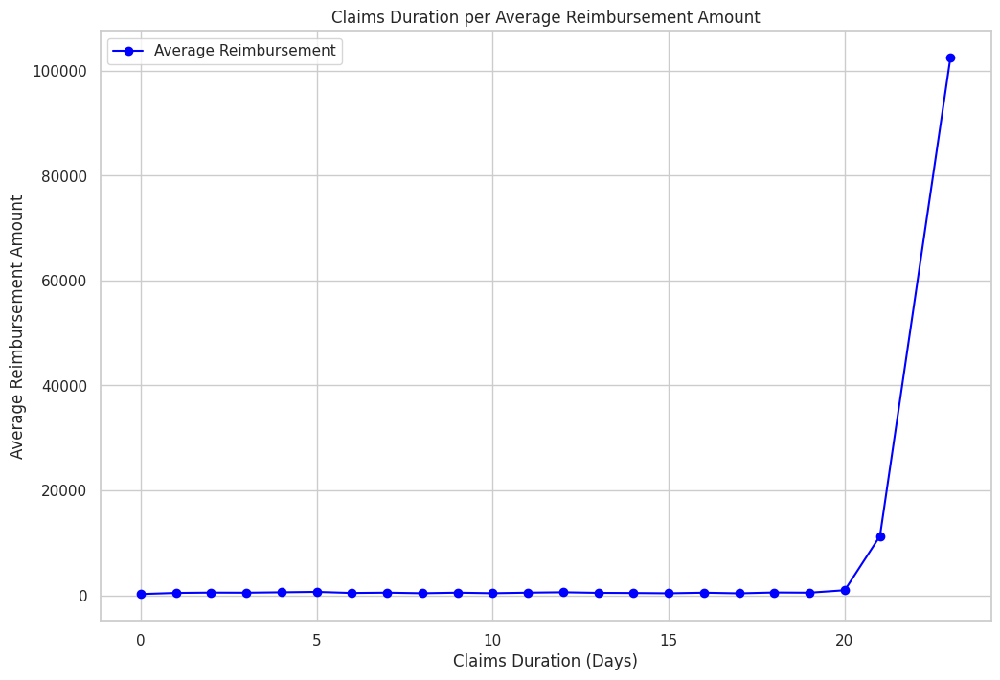

In [ ]:


# Plotting the claims duration per average reimbursement amount
plt.figure(figsize=(12, 8))
plt.plot(claimed_amount.index, claimed_amount['Avg_Claim_Insc_Amount'], marker='o', color='blue', label='Average Reimbursement')
plt.title('Claims Duration per Average Reimbursement Amount')
plt.xlabel('Claims Duration (Days)')
plt.ylabel('Average Reimbursement Amount')
plt.legend()
plt.grid(True)
plt.show()


EXPLORATORY ANALYSIS OF THE MERGED DATASET

In [ ]:
#set the target variable for inpatient and outpatient data
inpatient['Admitted'] = 1

print(inpatient.shape)

outpatient['Admitted']= 0
print(outpatient.shape)

(40474, 33)
(517737, 29)


In [ ]:
provider.head(2)

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes


In [ ]:
#set common columns for which the data is merged

common_cols = [col for col in inpatient.columns if col in outpatient.columns]
len(common_cols)

# Merging the IP and OP dataset on the basis of common columns
patient_df = pd.merge(left=inpatient, right=outpatient, left_on=common_cols, right_on=common_cols, how="outer")


#merge provider patient data with the beneficiary details

patient_ben_df =pd.merge(left=patient_df, right=beneficiary, left_on='BeneID', right_on='BeneID',how='inner')
patient_ben_df.shape

#Merge patient data to the provider df

merge_data= pd.merge(left=patient_ben_df, right= provider, left_on='Provider', right_on='Provider',how='inner')

df= merge_data

df.shape

(558211, 60)

In [ ]:
merge_data.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,rheumatoidarthritis,stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,Age,DeathStatus,ageGrp,PotentialFraud
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,1,1,36000,3204,60,70,66.0,0,Old,Yes
1,BENE16973,CLM565430,2009-09-06,2009-09-06,PRV55912,50,PHY365867,PHY327147,NaN,NaT,...,0,0,24000,2136,450,200,77.0,0,Old,Yes
2,BENE17521,CLM34721,2009-01-20,2009-02-01,PRV55912,19000,PHY349293,PHY370861,PHY363291,2009-01-20,...,0,0,19000,1068,100,20,96.0,0,Very Old,Yes
3,BENE21718,CLM72336,2009-10-17,2009-11-04,PRV55912,17000,PHY334706,PHY334706,NaN,2009-10-17,...,0,0,17000,1068,1050,540,87.0,0,Very Old,Yes
4,BENE22934,CLM73394,2009-10-25,2009-10-29,PRV55912,13000,PHY390614,PHY323689,PHY363291,2009-10-25,...,1,0,27000,2136,450,160,79.0,0,Old,Yes


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 558211 entries, 0 to 558210
Data columns (total 60 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   BeneID                    558211 non-null  object        
 1   ClaimID                   558211 non-null  object        
 2   ClaimStartDt              558211 non-null  datetime64[ns]
 3   ClaimEndDt                558211 non-null  datetime64[ns]
 4   Provider                  558211 non-null  object        
 5   InscClaimAmtReimbursed    558211 non-null  int64         
 6   AttendingPhysician        556703 non-null  object        
 7   OperatingPhysician        114447 non-null  object        
 8   OtherPhysician            199736 non-null  object        
 9   AdmissionDt               40474 non-null   datetime64[ns]
 10  ClmAdmitDiagnosisCode     145899 non-null  object        
 11  DeductibleAmtPaid         557312 non-null  float64       
 12  Di

In [ ]:
df.head(5)

,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,...,rheumatoidarthritis,stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt,Age,DeathStatus,ageGrp,PotentialFraud
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,...,1,1,36000,3204,60,70,66.0,0,Old,Yes
1,BENE16973,CLM565430,2009-09-06,2009-09-06,PRV55912,50,PHY365867,PHY327147,NaN,NaT,...,0,0,24000,2136,450,200,77.0,0,Old,Yes
2,BENE17521,CLM34721,2009-01-20,2009-02-01,PRV55912,19000,PHY349293,PHY370861,PHY363291,2009-01-20,...,0,0,19000,1068,100,20,96.0,0,Very Old,Yes
3,BENE21718,CLM72336,2009-10-17,2009-11-04,PRV55912,17000,PHY334706,PHY334706,NaN,2009-10-17,...,0,0,17000,1068,1050,540,87.0,0,Very Old,Yes
4,BENE22934,CLM73394,2009-10-25,2009-10-29,PRV55912,13000,PHY390614,PHY323689,PHY363291,2009-10-25,...,1,0,27000,2136,450,160,79.0,0,Old,Yes


In [ ]:
#examine the provider claims
prvs_claims_df = pd.DataFrame(df.groupby(['Provider'])['ClaimID'].count()).reset_index()
target_df = pd.merge(left=prvs_claims_df, right=provider, on='Provider', how='inner')
#target_df.head(2)

In [ ]:
color = ['#03045e', '#bde0fe']

fraud_counts = df['PotentialFraud'].value_counts()

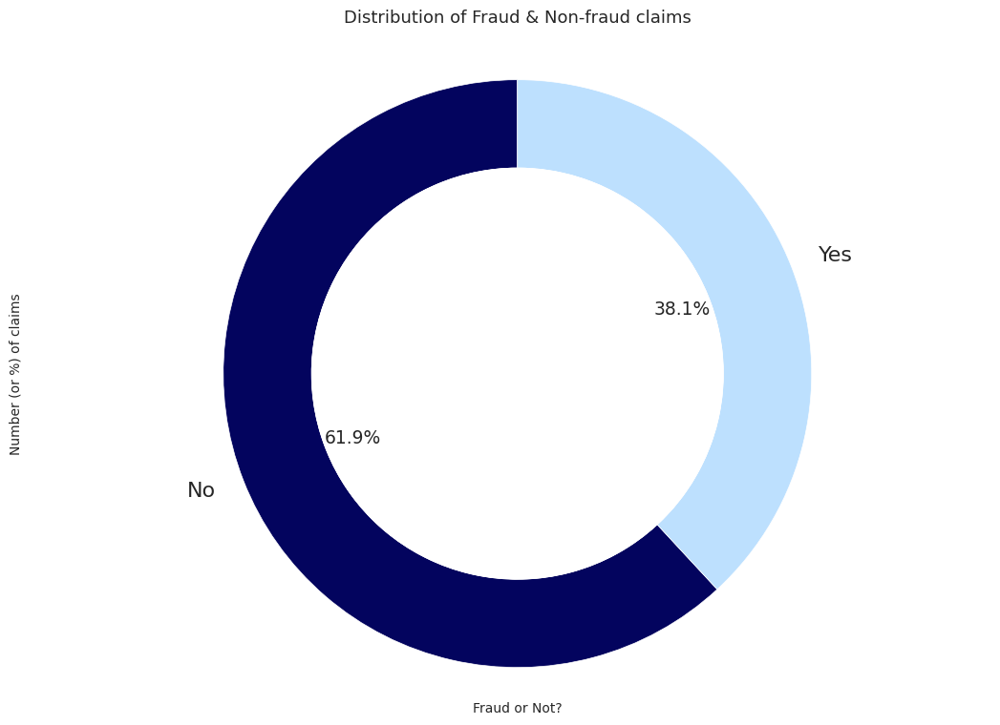

In [ ]:


# Create a donut chart
with plt.style.context('seaborn-poster'):
    fig, ax = plt.subplots()

    # Plot the pie chart
    wedges, texts, autotexts = ax.pie(fraud_counts, labels=fraud_counts.index, autopct='%1.1f%%',
                                      startangle=90, colors= color, wedgeprops=dict(width=0.3))

    # Increase the size of the autopct labels
    for autotext in autotexts:
        autotext.set_fontsize(13.5)

    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    # Set labels and title
    ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.xlabel("Fraud or Not?", fontsize=10)
    plt.ylabel("Number (or %) of claims\n", fontsize=10)
    plt.grid(False)
    plt.title("Distribution of Fraud & Non-fraud claims\n", fontsize=13)

    plt.show()

<ipython-input-92-0e9206b1fc22>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.boxenplot(data=df, x='PotentialFraud',y='Claim_Duration', palette='inferno')


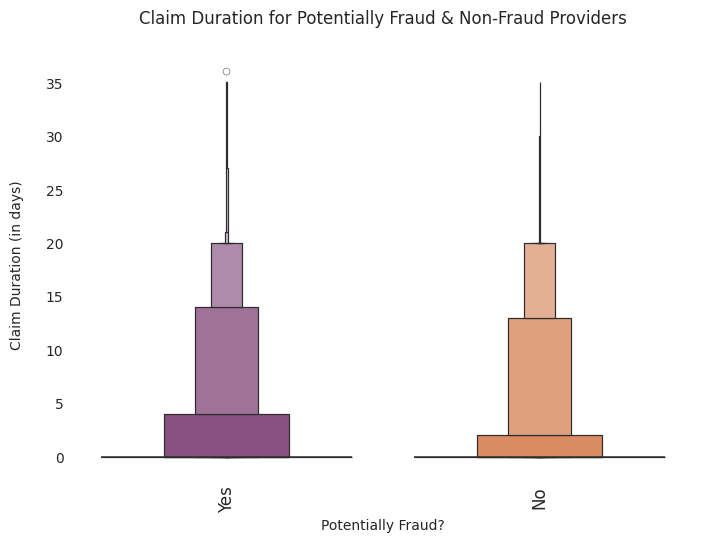

In [ ]:
#Plot claims duration vs target label (potential fraud)

with plt.style.context('seaborn'):
    fig = sns.boxenplot(data=df, x='PotentialFraud',y='Claim_Duration', palette='inferno')


    plt.xlabel("Potentially Fraud?", fontsize = 10)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontsize = 10)
    plt.minorticks_on()
    plt.grid(False)

    fig.set_facecolor('white')

    plt.title("Claim Duration for Potentially Fraud & Non-Fraud Providers\n", fontsize = 12)
    plt.plot();

In [ ]:
df['PotentialFraud'].value_counts()

No     345415
Yes    212796
Name: PotentialFraud, dtype: int64

In [ ]:
#Plot claims duration vs target label (potential fraud)
fraud_df= df[(df["PotentialFraud"] == 'Yes')]

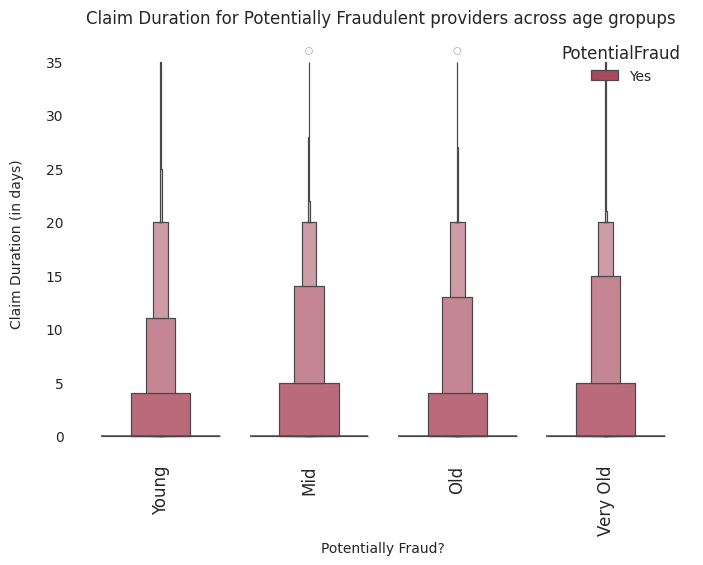

In [ ]:
#the spread of potentially fraudulent claim duration across age groups
with plt.style.context('seaborn'):
    fig = sns.boxenplot(data=fraud_df, x='ageGrp',y='Claim_Duration', hue='PotentialFraud', palette='inferno')


    plt.xlabel("Potentially Fraud?", fontsize = 10)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontsize = 10)
    plt.minorticks_on()
    plt.grid(False)

    fig.set_facecolor('white')

    plt.title("Claim Duration for Potentially Fraudulent providers across age gropups ", fontsize = 12)
    plt.plot();

<ipython-input-96-8f6553eb0608>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.boxenplot(data=fraud_df, x='Gender',y='Claim_Duration', palette='inferno')


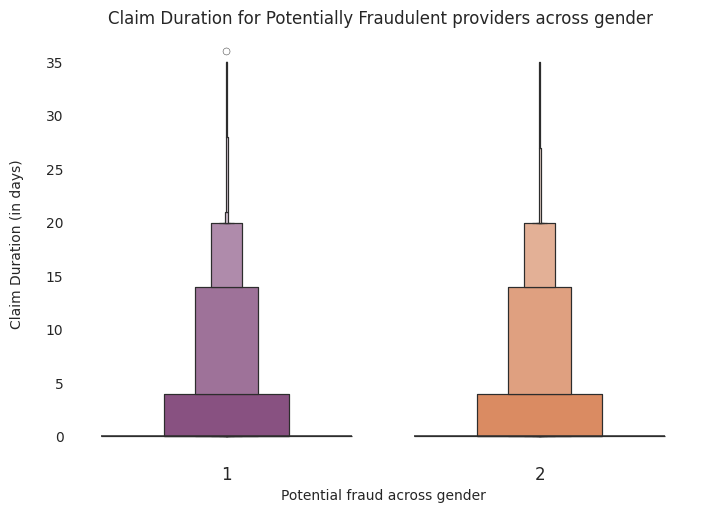

In [ ]:
#the spread of potentially fraudulent claim duration across gender

with plt.style.context('seaborn'):
    fig = sns.boxenplot(data=fraud_df, x='Gender',y='Claim_Duration', palette='inferno')


    plt.xlabel("Potential fraud across gender", fontsize = 10)
    plt.xticks(rotation=0, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontsize = 10)
    plt.minorticks_on()
    plt.grid(False)

    fig.set_facecolor('white')

    plt.title("Claim Duration for Potentially Fraudulent providers across gender ", fontsize = 12)
    plt.plot();

In [ ]:
df= df.replace({'RenalDiseaseIndicator': 'Y'}, 1)

In [ ]:
rdi_df = df[(df['RenalDiseaseIndicator']== 1)]

<ipython-input-99-4a8ee78d7490>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data=condition_df, x=x_axis, y='Claim_Duration', palette='inferno')


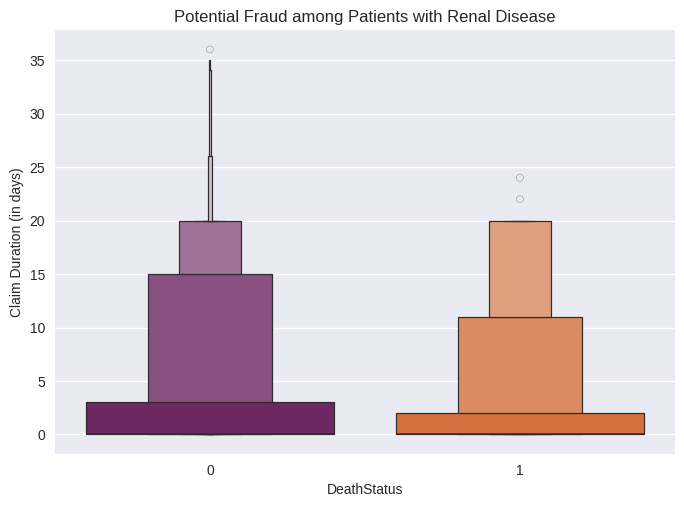

<ipython-input-99-4a8ee78d7490>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data=condition_df, x=x_axis, y='Claim_Duration', palette='inferno')


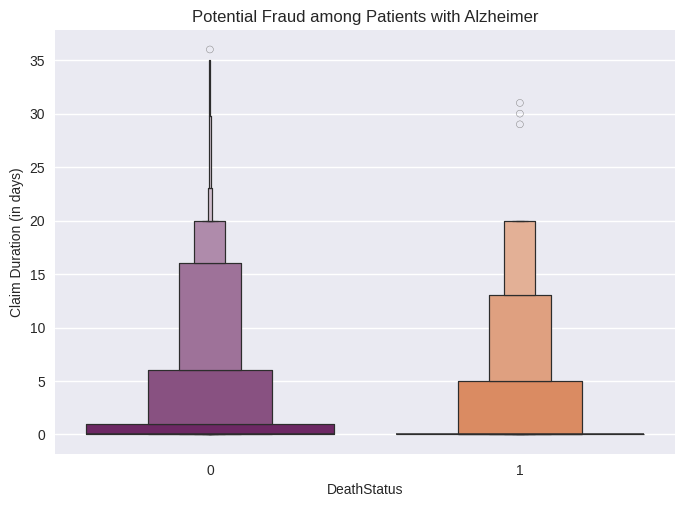

<ipython-input-99-4a8ee78d7490>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxenplot(data=condition_df, x=x_axis, y='Claim_Duration', palette='inferno')


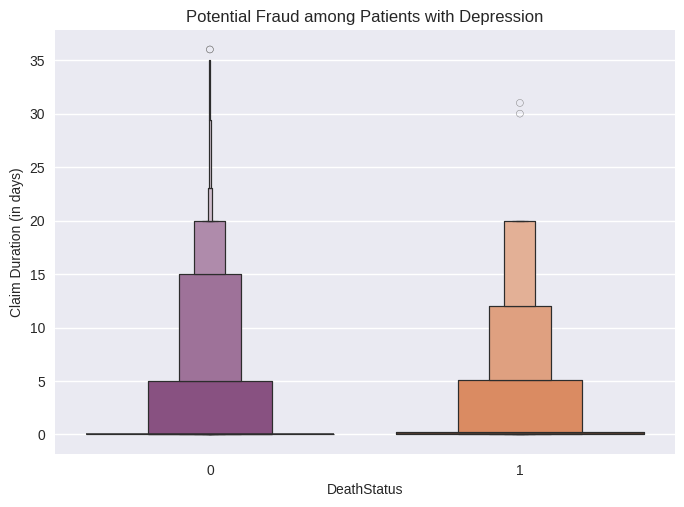

In [ ]:

def plot_claim_duration(df, condition, fraud_indicator, x_axis, title):
    condition_df = df[(df[condition] == 1) & (df['PotentialFraud'] == fraud_indicator)]

    with plt.style.context('seaborn'):
        sns.boxenplot(data=condition_df, x=x_axis, y='Claim_Duration', palette='inferno')

        plt.xlabel(x_axis, fontsize=10)
        plt.ylabel("Claim Duration (in days)", fontsize=10)
        plt.title(title, fontsize=12)

        plt.show()

# Example usage:
# Renal Disease
plot_claim_duration(df, 'RenalDiseaseIndicator', 'Yes', 'DeathStatus', 'Potential Fraud among Patients with Renal Disease')

# Alzheimer's Disease
plot_claim_duration(df, 'Alzheimer', 'Yes', 'DeathStatus', 'Potential Fraud among Patients with Alzheimer')

# Depression
plot_claim_duration(df, 'Depression', 'Yes', 'DeathStatus', 'Potential Fraud among Patients with Depression')


<ipython-input-100-4a8c03f502a2>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.barplot(data=df, x='PotentialFraud',y='admittedDays', palette=color)


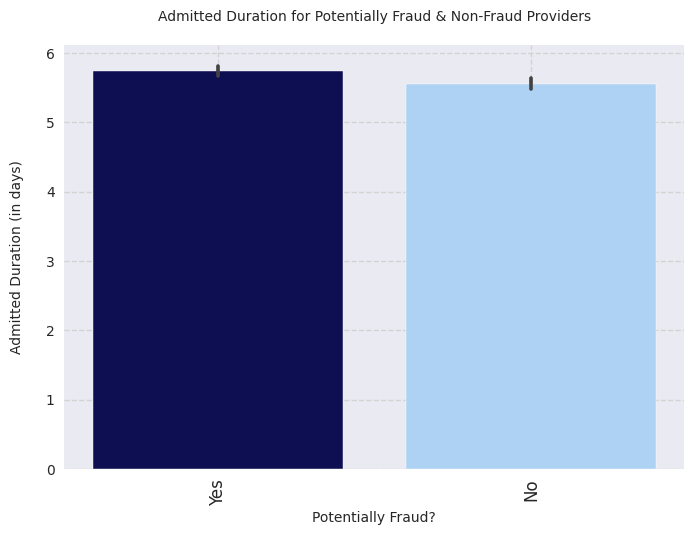

In [ ]:
color= ['#03045e', '#a2d2ff']

with plt.style.context('seaborn'):
    fig = sns.barplot(data=df, x='PotentialFraud',y='admittedDays', palette=color)

    # Providing the labels and title to the graph
    plt.xlabel("Potentially Fraud?", fontsize = 10)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Admitted Duration (in days)\n", fontsize = 10)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')

    plt.title("Admitted Duration for Potentially Fraud & Non-Fraud Providers\n", fontsize = 10)
    plt.plot();

<ipython-input-101-caad548261d0>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.barplot(data=fraud_df, x='admittedDays', y='Claim_Duration', palette='Blues')


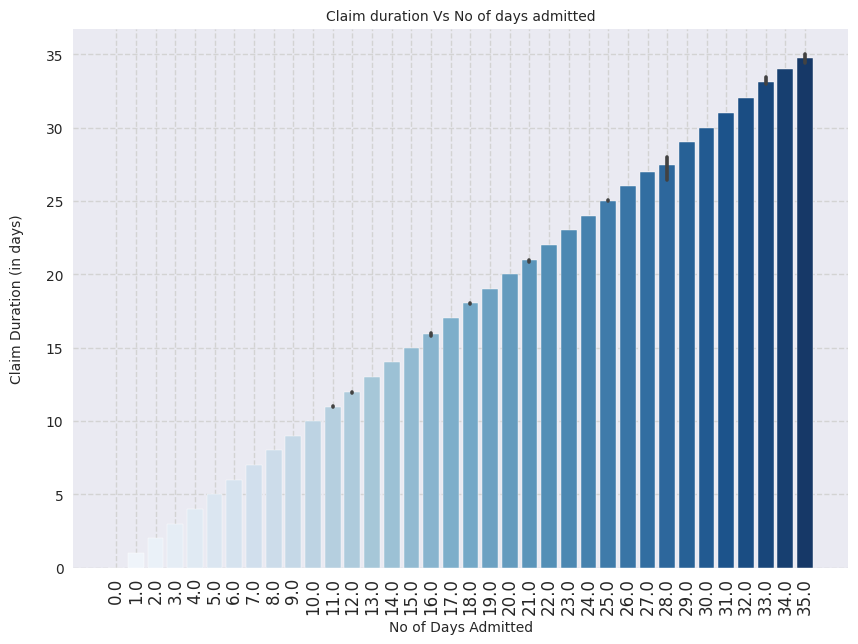

In [ ]:
with plt.style.context('seaborn'):
    plt.figure(figsize=(10,7))
    fig = sns.barplot(data=fraud_df, x='admittedDays', y='Claim_Duration', palette='Blues')

    # Providing the labels and title to the graph
    plt.xlabel("No of Days Admitted", fontsize = 10)
    plt.xticks(rotation=90, fontsize=12)
    plt.ylabel("Claim Duration (in days)\n", fontsize = 10)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')


    plt.title("Claim duration Vs No of days admitted", fontsize = 10)
    plt.plot();

In [ ]:

def plot_bar_graph(data, x_axis, y_axis, title, rotation=90):
    with plt.style.context('seaborn'):
        plt.figure(figsize=(10, 7))
        fig = sns.barplot(data=data, x=x_axis, y=y_axis, palette='Blues')

        # Providing the labels and title to the graph
        plt.xlabel(x_axis, fontsize=10)
        plt.xticks(rotation=rotation, fontsize=12)
        plt.ylabel(f"{y_axis}\n", fontsize=10)
        plt.minorticks_on()
        plt.grid(which='major', linestyle="--", color='lightgrey')
        plt.title(title, fontsize=10)
        plt.show()




<ipython-input-102-d65b482d54a6>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.barplot(data=data, x=x_axis, y=y_axis, palette='Blues')


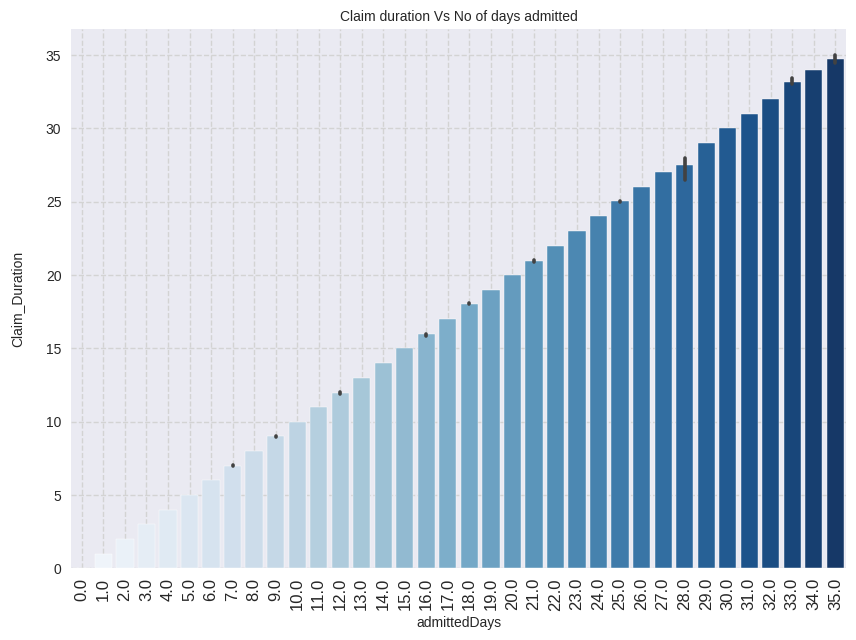

In [ ]:
# Claim duration Vs No of days admitted
plot_bar_graph(fraud_df, 'admittedDays', 'Claim_Duration', 'Claim duration Vs No of days admitted')


<ipython-input-102-d65b482d54a6>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.barplot(data=data, x=x_axis, y=y_axis, palette='Blues')


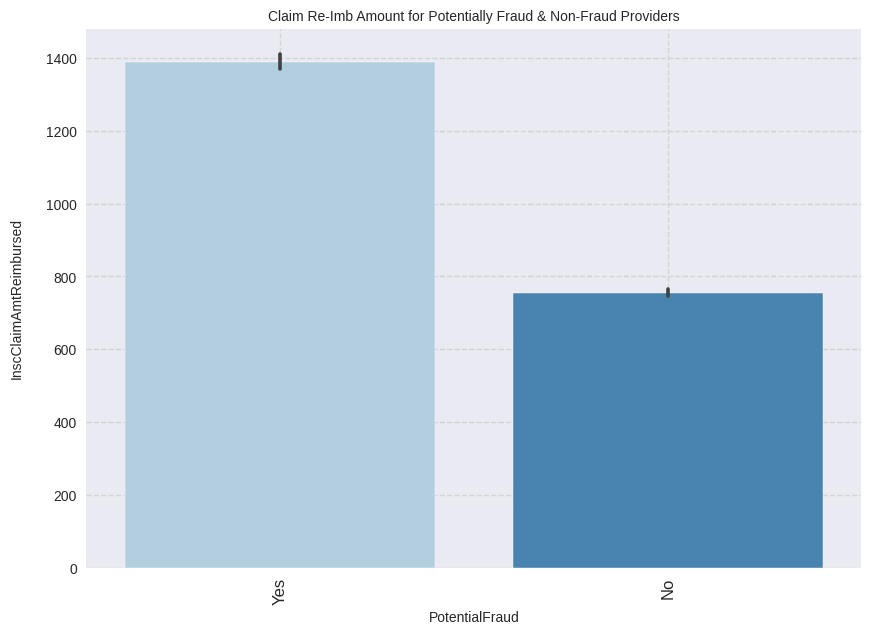

In [ ]:
# Claims reimbursement
plot_bar_graph(df, 'PotentialFraud', 'InscClaimAmtReimbursed', 'Claim Re-Imb Amount for Potentially Fraud & Non-Fraud Providers')

<ipython-input-102-d65b482d54a6>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.barplot(data=data, x=x_axis, y=y_axis, palette='Blues')


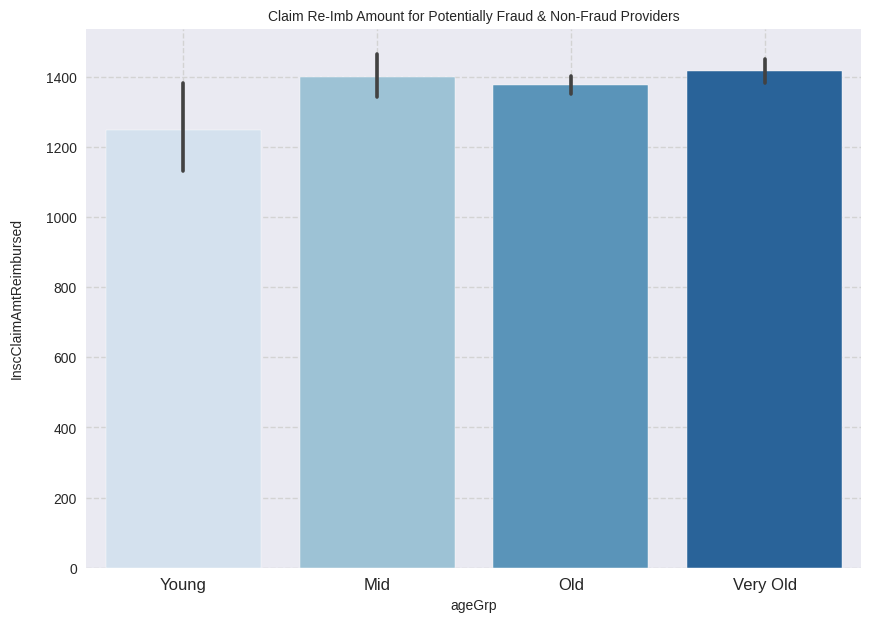

In [ ]:
# Investigate the data further for potential fraud with age groups
plot_bar_graph(fraud_df, 'ageGrp', 'InscClaimAmtReimbursed', 'Claim Re-Imb Amount for Potentially Fraud & Non-Fraud Providers', rotation=0)

In [ ]:
def plot_strip_plots(x_col, hue_col, y_col, lgd_title):
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(10, 7))
        sns.stripplot(data=fraud_df, x=x_col, y=y_col, hue=hue_col, palette='inferno')
        # Providing the labels and title to the graph
        plt.xlabel("\n{}".format(x_col), color='#000', fontsize=10)
        plt.xticks(rotation=90, size=10)
        plt.ylabel("{}\n".format(y_col), color='#000', fontsize=10)
        plt.grid(False)
        plt.title("Spread of payment paid by patient\n", color='#000', fontsize=10)
        plt.legend(loc='upper center', title=lgd_title)

fraud_df['DeathStatus'].value_counts()



0    211252
1      1544
Name: DeathStatus, dtype: int64

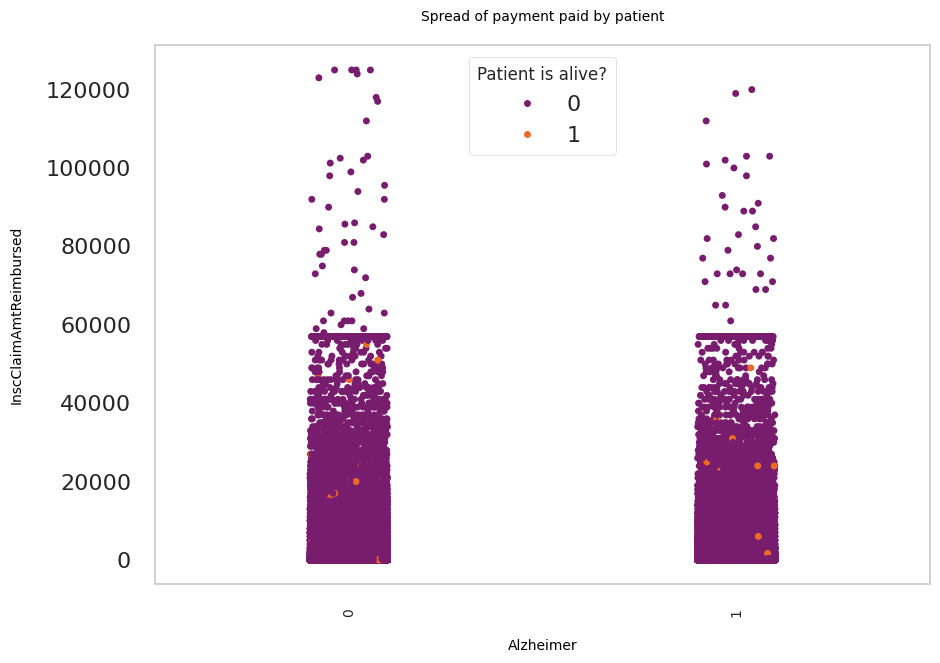

In [ ]:
plot_strip_plots(x_col='Alzheimer', hue_col="DeathStatus", y_col='InscClaimAmtReimbursed', lgd_title="Patient is alive?")

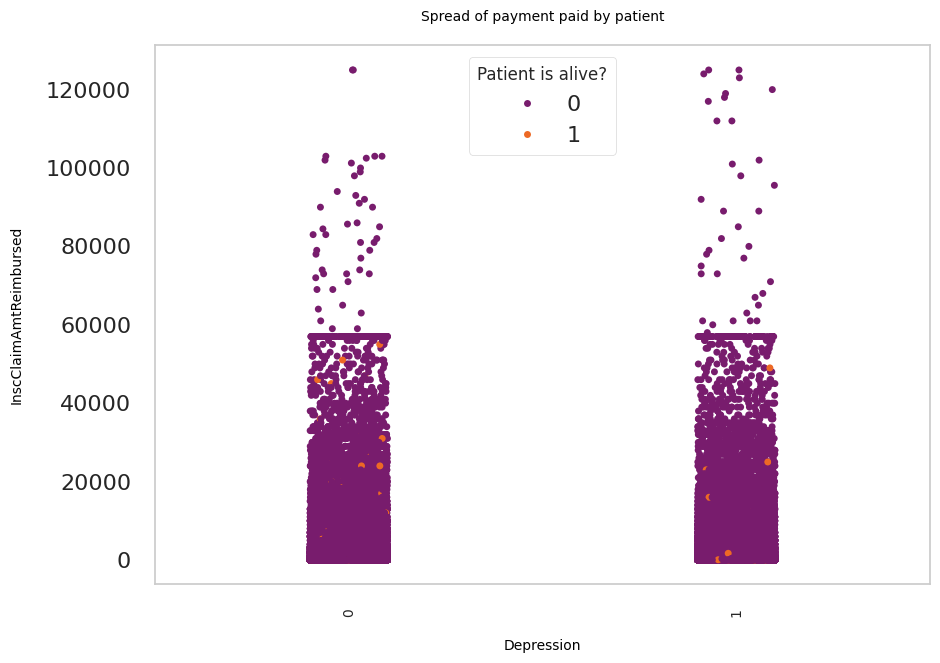

In [ ]:

plot_strip_plots(x_col='Depression', hue_col="DeathStatus", y_col='InscClaimAmtReimbursed', lgd_title="Patient is alive?")

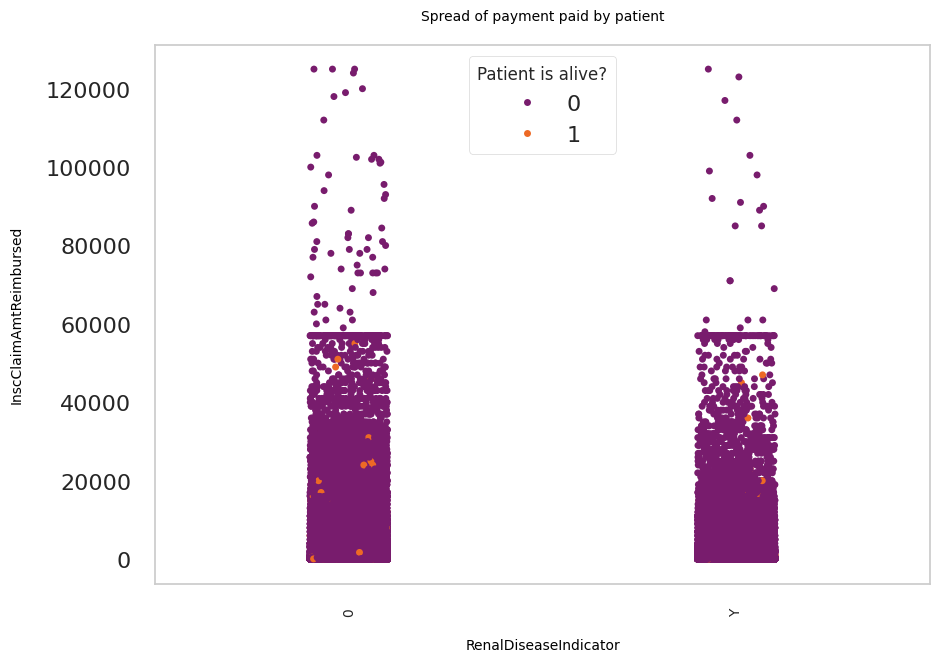

In [ ]:
plot_strip_plots(x_col='RenalDiseaseIndicator', hue_col="DeathStatus", y_col='InscClaimAmtReimbursed', lgd_title="Patient is alive?")

In [ ]:
#analysing the possibility of a fraud for annual deductible where the value is 0

print(pd.DataFrame(df[(df['IPAnnualReimbursementAmt'] == 0)]['Admitted'].value_counts()))

print(pd.DataFrame(df[(df['IPAnnualReimbursementAmt'] == 0) & (df['Admitted'] == 1)]\
                   ['PotentialFraud'].value_counts()))

   Admitted
0    371263
1       413
     PotentialFraud
Yes             249
No              164


Unique number of Attending Physicians present in the dataset are --> 82063
No ofOperating Physicians:: 35315
No of Other Physicians :: 46457


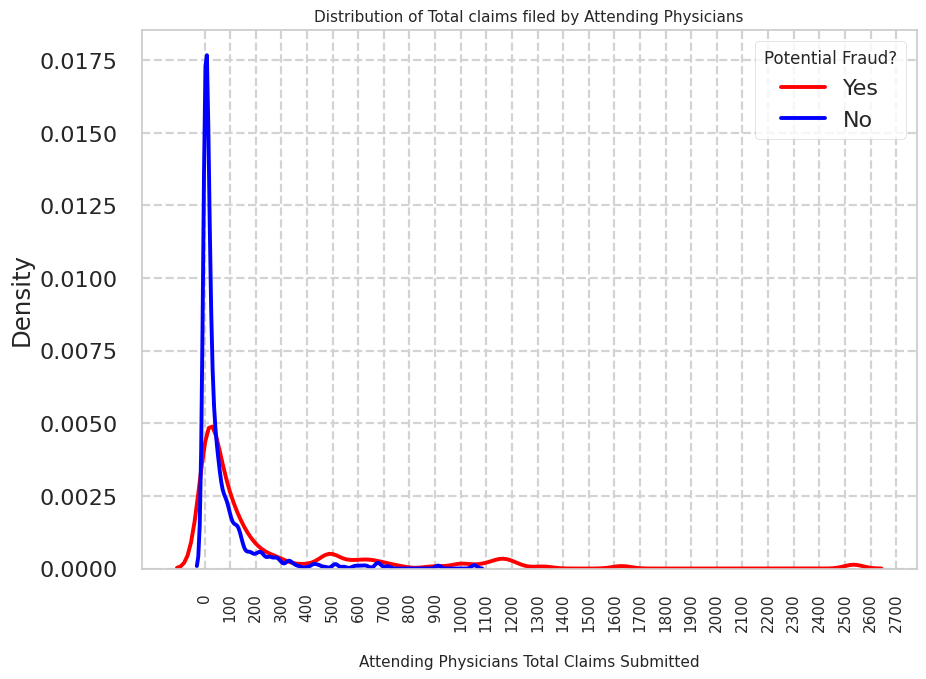

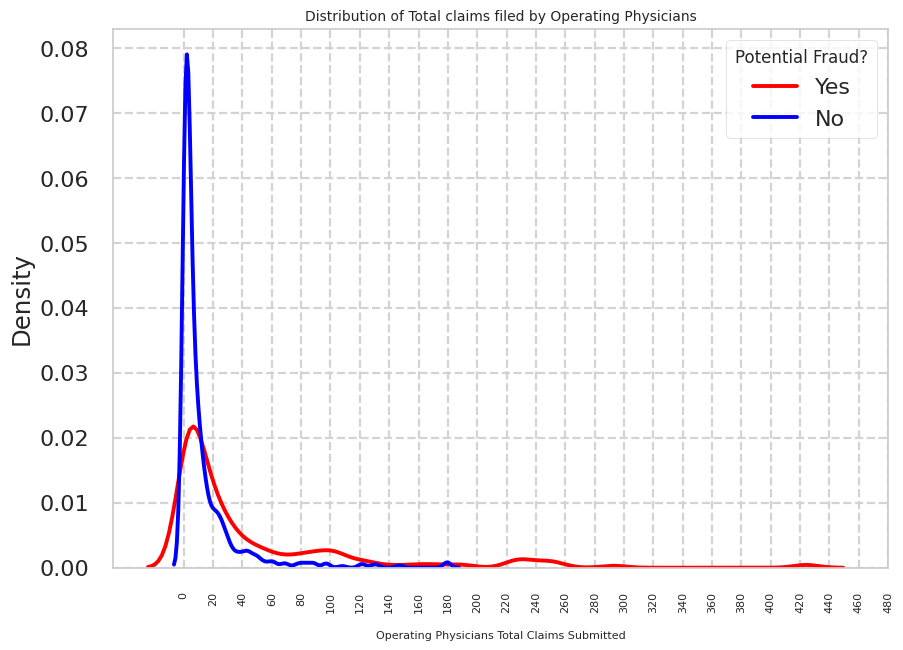

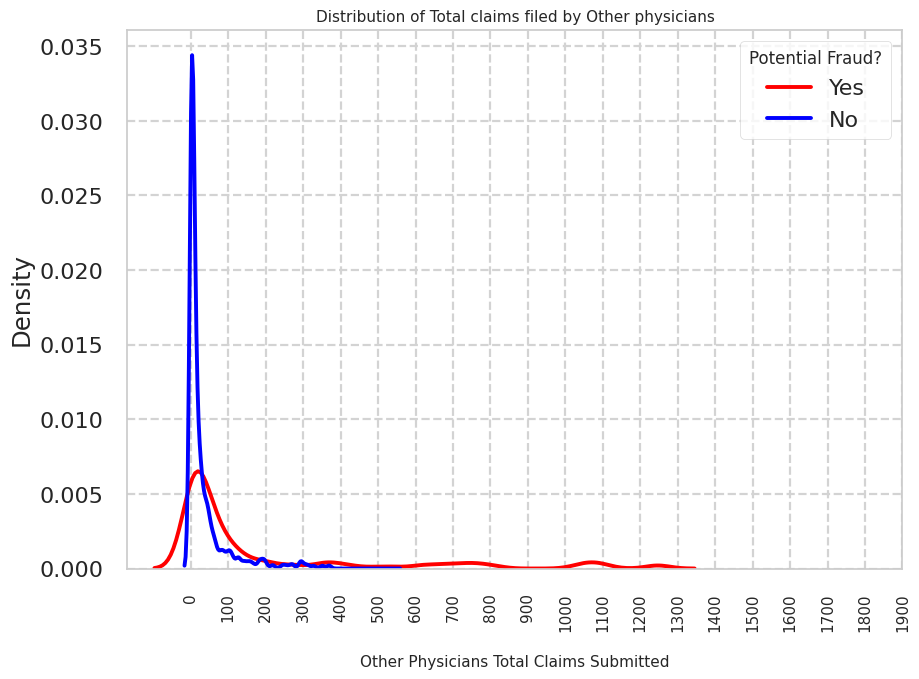

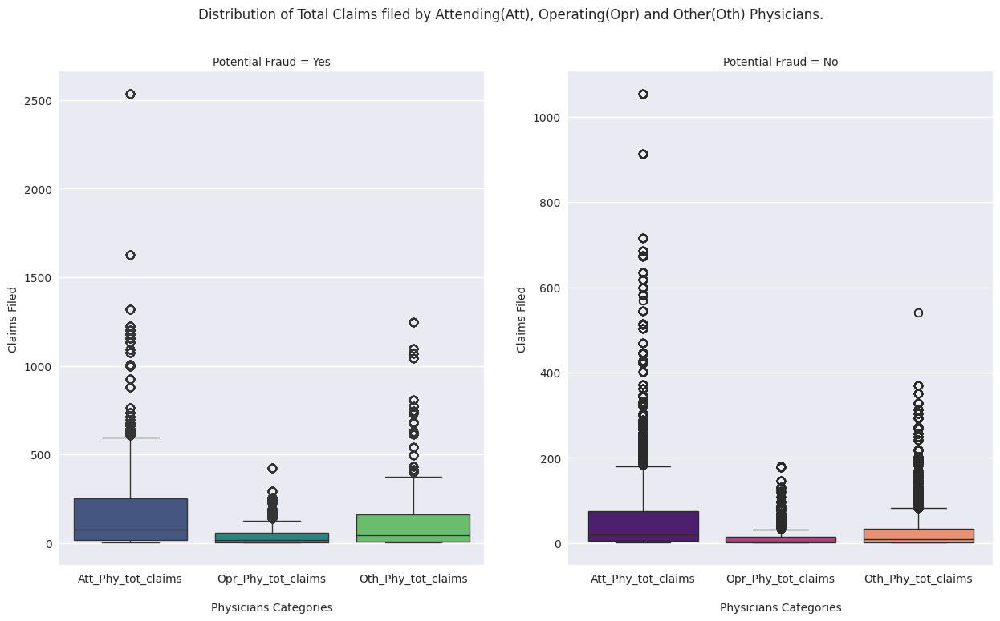

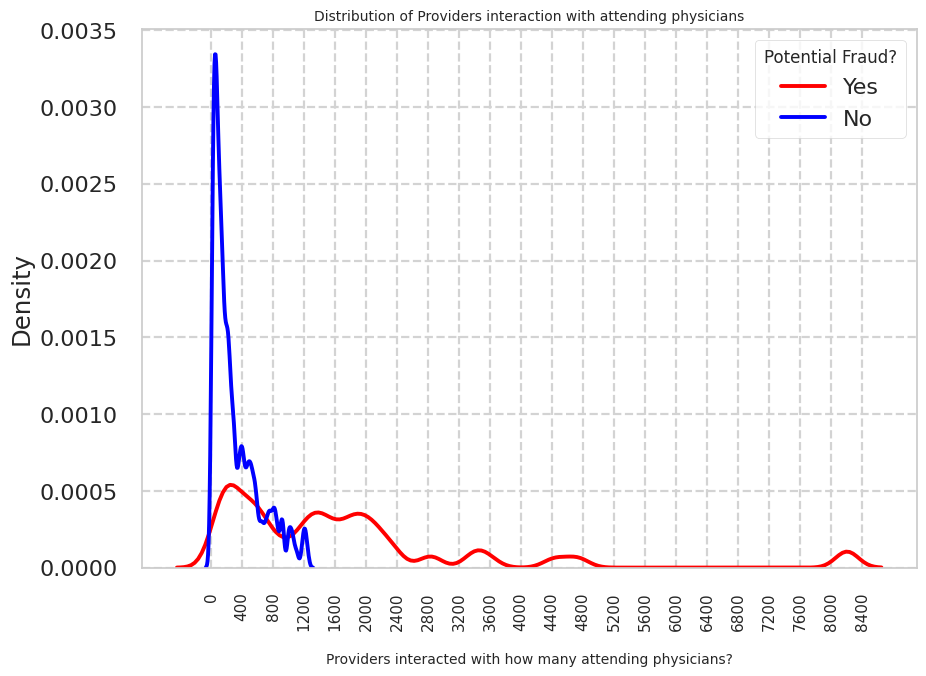

In [ ]:
# Investigating the claims per physician

#Total unique number of Attended Physicians
print("Unique number of Attending Physicians present in the dataset are --> {}".format(df['AttendingPhysician'].nunique()))

df['Att_Phy_tot_claims'] = df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')
df['Att_Phy_tot_claims'].describe()

#total claims submitted by Attending physicians

with plt.style.context('seaborn-poster'):
    plt.figure(figsize = (10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['Att_Phy_tot_claims'],color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['Att_Phy_tot_claims'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nAttending Physicians Total Claims Submitted", fontsize=11)
    plt.xticks(np.arange(0,2800,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Total claims filed by Attending Physicians", fontsize=11)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

print("No ofOperating Physicians:: {}".format(df['OperatingPhysician'].nunique()))
#claims filed by operating physician
df['Opr_Phy_tot_claims'] = df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')
df['Opr_Phy_tot_claims'].describe()

with plt.style.context('seaborn-poster'):
    plt.figure(figsize= (10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['Opr_Phy_tot_claims'],color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['Opr_Phy_tot_claims'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nOperating Physicians Total Claims Submitted", fontsize= 8)
    plt.xticks(np.arange(0,500,20), rotation=90, fontsize=8)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Total claims filed by Operating Physicians", fontsize= 10)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");


# Total unique number of Other Physicians
print("No of Other Physicians :: {}".format(df['OtherPhysician'].nunique()))

df['Oth_Phy_tot_claims'] = df.groupby(['OtherPhysician'])['ClaimID'].transform('count')
df['Oth_Phy_tot_claims'].describe()

with plt.style.context('seaborn-poster'):
    plt.figure(figsize = (10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['Oth_Phy_tot_claims'],color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['Oth_Phy_tot_claims'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nOther Physicians Total Claims Submitted", fontsize=11)
    plt.xticks(np.arange(0,2000,100), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Total claims filed by Other physicians", fontsize=11)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

#Distribution of claims filled by the physicians


with plt.style.context('seaborn'):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15,8), sharey=False)
    sns.boxplot(data=df[df["PotentialFraud"] == 'Yes'][['Att_Phy_tot_claims','Opr_Phy_tot_claims','Oth_Phy_tot_claims']],ax=ax1, palette='viridis')

    ax1.set_title("Potential Fraud = Yes", fontsize= 10)
    ax1.set_xlabel("\nPhysicians Categories", fontsize= 10)
    ax1.set_ylabel("Claims Filed", fontsize= 10)

    sns.boxplot(data=df[df["PotentialFraud"] == 'No'][['Att_Phy_tot_claims','Opr_Phy_tot_claims','Oth_Phy_tot_claims']],
                ax=ax2, palette='magma')

    ax2.set_title("Potential Fraud = No", fontsize= 10)
    ax2.set_xlabel("\nPhysicians Categories", fontsize= 10)
    ax2.set_ylabel("Claims Filed", fontsize= 10)
    # Providing the title to the figure
    fig.suptitle("Distribution of Total Claims filed by Attending(Att), Operating(Opr) and Other(Oth) Physicians.\n", fontsize= 12)
    plt.minorticks_on()
    plt.plot();

df["Prv_Tot_Att_Phy"] = df.groupby(['Provider'])['AttendingPhysician'].transform('count')
df["Prv_Tot_Opr_Phy"] = df.groupby(['Provider'])['OperatingPhysician'].transform('count')
df["Prv_Tot_Oth_Phy"] = df.groupby(['Provider'])['OtherPhysician'].transform('count')

#providers and attending physicians

with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['Prv_Tot_Att_Phy'], color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['Prv_Tot_Att_Phy'],color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders interacted with how many attending physicians?", fontsize=10)
    plt.xticks(np.arange(0,8800,400), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Providers interaction with attending physicians", fontsize=10)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

Investigating the claim admission codes used by providers and physician to identify the possibility of a fraudulent claim

In [ ]:
df['PRV_Tot_Admit_DCodes'] = df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

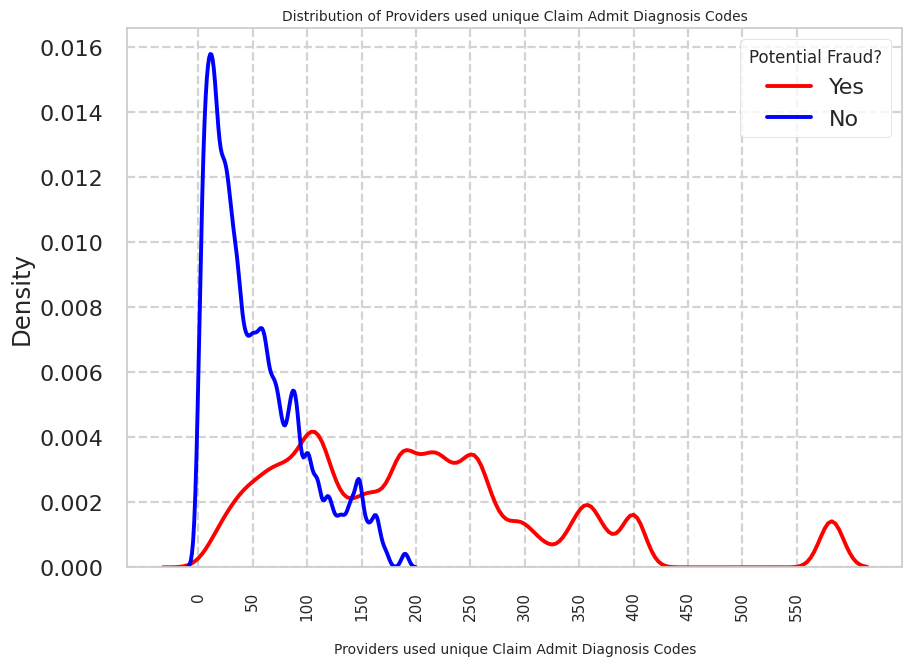

In [ ]:
#provider::diagnosis code
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['PRV_Tot_Admit_DCodes'], color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['PRV_Tot_Admit_DCodes'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nProviders used unique Claim Admit Diagnosis Codes", fontsize=10)
    plt.xticks(np.arange(0,600,50), rotation=90, fontsize=11)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Providers used unique Claim Admit Diagnosis Codes", fontsize=10)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

<ipython-input-114-78435b384b66>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  fig = sns.boxplot(data=df, y='PotentialFraud', x='PRV_Tot_Admit_DCodes', palette='viridis', orient='h')


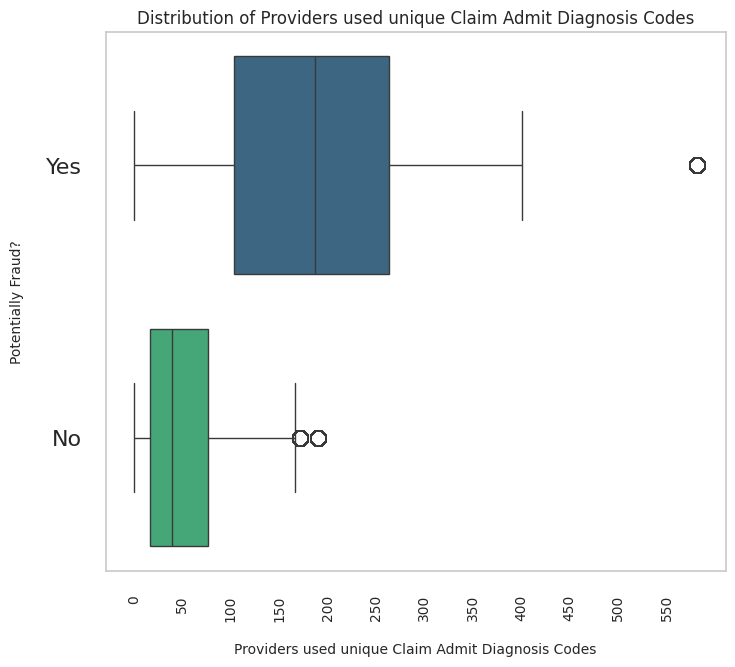

In [ ]:
with plt.style.context('seaborn-poster'):

    plt.figure(figsize=(8,7))
    fig = sns.boxplot(data=df, y='PotentialFraud', x='PRV_Tot_Admit_DCodes', palette='viridis', orient='h')
    # Providing the labels and title to the graph
    plt.ylabel("Potentially Fraud?\n", fontsize=10)
    plt.xticks(np.arange(0,600,50), rotation=90, fontsize=10)
    plt.xlabel("\nProviders used unique Claim Admit Diagnosis Codes", fontsize=10)
    plt.minorticks_on()
    plt.grid(False)
    plt.title("Distribution of Providers used unique Claim Admit Diagnosis Codes", fontsize=12)
    plt.plot();

In [ ]:
#investigating provider claims and the beneficiary age

df['PRV_Tot_Age'] = df.groupby(['Provider'])['Age'].transform('nunique')

In [ ]:
#investigating provider claims and the beneficiary age

df['PRV_Tot_Age'] = df.groupby(['Provider'])['Age'].transform('nunique')

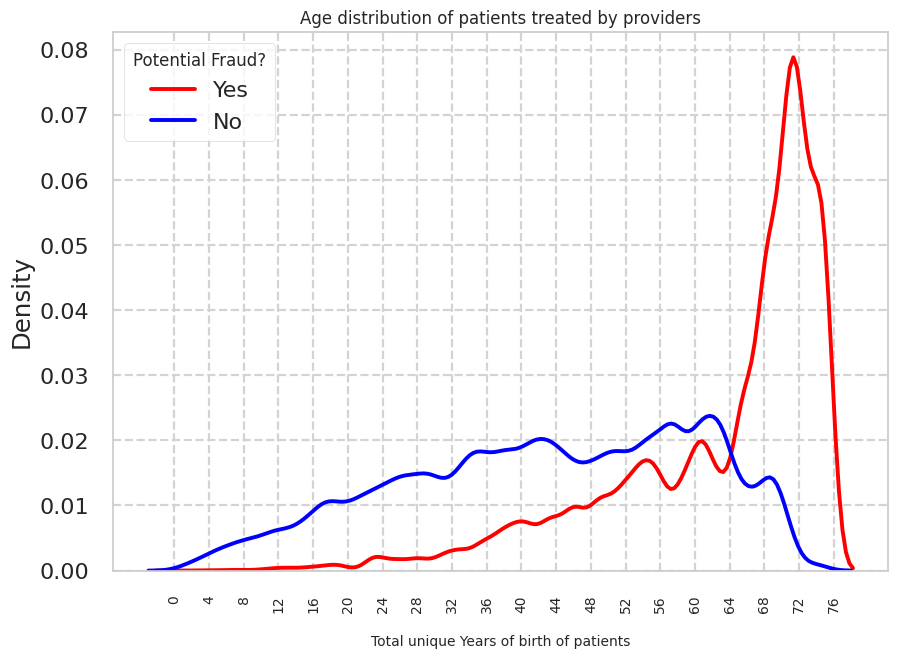

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['PRV_Tot_Age'], color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['PRV_Tot_Age'], color='blue')
    # Providing the labels and title to the graph
    plt.xlabel("\nTotal unique Years of birth of patients", fontsize=10)
    plt.xticks(np.arange(0,80,4), rotation=90, fontsize=10)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Age distribution of patients treated by providers", fontsize=12)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

In [ ]:
#observing fraudulent claims among patients older than 60

df[df['PRV_Tot_Age'] >=60]['PotentialFraud'].value_counts()


Yes    150180
No      71646
Name: PotentialFraud, dtype: int64

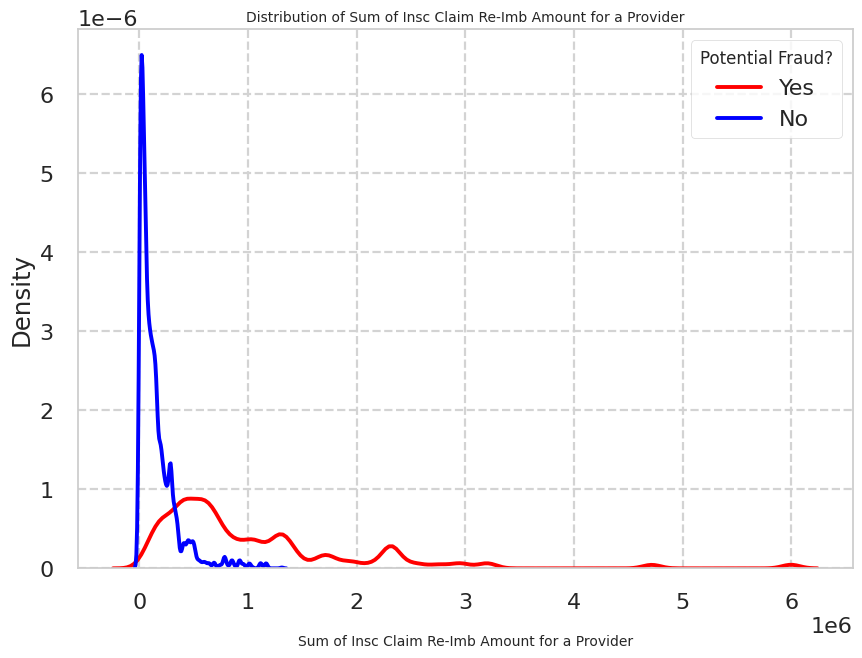

In [ ]:
#claim reimbursement

df['PRV_Insc_Clm_ReImb_Amt'] = df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,7))
    sns.kdeplot(x=df[df['PotentialFraud'] == 'Yes']['PRV_Insc_Clm_ReImb_Amt'], color='red')
    sns.kdeplot(x=df[df['PotentialFraud'] == 'No']['PRV_Insc_Clm_ReImb_Amt'], color='blue')
    # labels
    plt.xlabel("\nSum of Insc Claim Re-Imb Amount for a Provider", fontsize= 10)
    plt.minorticks_on()
    plt.grid(which='major', linestyle="--", color='lightgrey')
    plt.title("Distribution of Sum of Insc Claim Re-Imb Amount for a Provider", fontsize= 10)
    plt.legend(labels=["Yes", "No"], title="Potential Fraud?");

In [ ]:
#Feature engineering: calculate interaction between a provider and the physicians

df["Prv_Tot_Att_Phy"] = df.groupby(['Provider'])['AttendingPhysician'].transform('count')
df["Prv_Tot_Opr_Phy"] = df.groupby(['Provider'])['OperatingPhysician'].transform('count')
df["Prv_Tot_Oth_Phy"] = df.groupby(['Provider'])['OtherPhysician'].transform('count')

#find the unique diagnosis code interacting with the provider

df['PRV_Tot_Admit_DCodes'] = df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

df['PRV_Tot_Admit_DCodes'].describe()

#reimbursed insurance claim per provider

df['PrvInscClmReimbursed'] = df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

#converting to numeric dattype from object
df['RenalDiseaseIndicator'] = pd.to_numeric(df['RenalDiseaseIndicator'], errors='coerce')

#provider interaction with RDI

df['PRV_RDI_Patients'] = df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

pd.DataFrame(df.isna().sum())

,0
BeneID,0
ClaimID,0
ClaimStartDt,0
ClaimEndDt,0
Provider,0
...,...
PRV_Tot_Admit_DCodes,0
PRV_Tot_Age,0
PRV_Insc_Clm_ReImb_Amt,0
PrvInscClmReimbursed,0


FEATURE ENGINEERING

In [ ]:
#Feature engineering: calculate interaction between a provider and the physicians

df["Prv_Tot_Att_Phy"] = df.groupby(['Provider'])['AttendingPhysician'].transform('count')
df["Prv_Tot_Opr_Phy"] = df.groupby(['Provider'])['OperatingPhysician'].transform('count')
df["Prv_Tot_Oth_Phy"] = df.groupby(['Provider'])['OtherPhysician'].transform('count')

#find the unique diagnosis code interacting with the provider

df['PRV_Tot_Admit_DCodes'] = df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

df['PRV_Tot_Admit_DCodes'].describe()

#reimbursed insurance claim per provider

df['PrvInscClmReimbursed'] = df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

#converting to numeric dattype from object
df['RenalDiseaseIndicator'] = pd.to_numeric(df['RenalDiseaseIndicator'], errors='coerce')

#provider interaction with RDI

df['PRV_RDI_Patients'] = df.groupby(['Provider'])['RenalDiseaseIndicator'].transform('sum')

pd.DataFrame(df.isna().sum())

,0
BeneID,0
ClaimID,0
ClaimStartDt,0
ClaimEndDt,0
Provider,0
...,...
PRV_Tot_Admit_DCodes,0
PRV_Tot_Age,0
PRV_Insc_Clm_ReImb_Amt,0
PrvInscClmReimbursed,0


In [ ]:
#unique count of age per provider
df['PRV_count_Age'] = df.groupby(['Provider'])['Age'].transform('nunique')  #note column name

#claim reimbursement per provider

df['PRV_Insc_Clm_ReImb_Amt'] = df.groupby(['Provider'])['InscClaimAmtReimbursed'].transform('sum')

#count of attending physician per provider
df["Prv_Tot_Att_Phy"] = df.groupby(['Provider'])['AttendingPhysician'].transform('count')

#count of operating  physician per provider
df["Prv_Tot_Opr_Phy"] = df.groupby(['Provider'])['OperatingPhysician'].transform('count')

#count of other physician per provider
df["Prv_Tot_Oth_Phy"] = df.groupby(['Provider'])['OtherPhysician'].transform('count')

#Total admit code per provider
df['PRV_Tot_Admit_DCodes'] = df.groupby(['Provider'])['ClmAdmitDiagnosisCode'].transform('nunique')

#total claims by physicians
df['Opr_Phy_tot_claims'] = df.groupby(['OperatingPhysician'])['ClaimID'].transform('count')

df['Oth_Phy_tot_claims'] = df.groupby(['OtherPhysician'])['ClaimID'].transform('count')

df['Att_Phy_tot_claims'] = df.groupby(['AttendingPhysician'])['ClaimID'].transform('count')

In [ ]:
#create new features to inspect all source of potential fraud

import itertools

# List of column combinations
column_combinations = [
    ['Provider'],
    ['Provider', 'BeneID'],
    ['Provider','BeneID', 'ClmDiagnosisCode_1', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_1', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_1', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_2', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_2', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_2', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_3', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_3', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_3', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_4', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_4', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_4', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_5', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_5', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_5', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_6', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_6', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_6', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_7', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_7', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_7', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_8', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_8', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_8', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_9', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_9', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_9', 'ClmProcedureCode_3'],
    ['Provider','BeneID', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1'],
    ['Provider','BeneID', 'ClmDiagnosisCode_10', 'ClmProcedureCode_2'],
    ['Provider','BeneID', 'ClmDiagnosisCode_10', 'ClmProcedureCode_3']
]

# Define the new features
new_features = []

# Loop over each column combination
for cols in column_combinations:
    # Create the feature name
    feature_name = f"ClmCount_{'_'.join(cols)}"

    # Group by the specified columns and count the number of claims
    new_feature = df.groupby(cols)['ClaimID'].transform('count')

    # Add the new feature to the DataFrame
    df[feature_name] = new_feature

    # Append the feature name to the list
    new_features.append(feature_name)

# Display the new features
print("New features added:", new_features)


New features added: ['ClmCount_Provider', 'ClmCount_Provider_BeneID', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_1', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_2', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_1_ClmProcedureCode_3', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_1', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_2', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_2_ClmProcedureCode_3', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_1', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_2', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_3_ClmProcedureCode_3', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_1', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_2', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_4_ClmProcedureCode_3', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_5_ClmProcedureCode_1', 'ClmCount_Provider_BeneID_ClmDiagnosisCode_5_ClmProcedureCode_2', 'ClmCo

In [ ]:
#converting to numeric dattype from object
df['RenalDiseaseIndicator'] = pd.to_numeric(df['RenalDiseaseIndicator'], errors='coerce')

In [ ]:
#Replace value
rep_col = ['Oth_Phy_tot_claims','Opr_Phy_tot_claims', 'Att_Phy_tot_claims', 'admittedDays', 'DeductibleAmtPaid', 'ClmAdmitDiagnosisCode']

df[rep_col] = df[rep_col].fillna(0)


In [ ]:
code_col = ['DeathStatus', 'PotentialFraud','ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5','ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
           'ClmDiagnosisCode_10', 'ClmProcedureCode_1']


# Display claim diagnosis and procedure uique value counts::
for i in df[code_col].columns:
  display (df.groupby(i).count().T.head(1).reset_index().drop('index', axis = 1))

DeathStatus,0,1
0,554080,4131


PotentialFraud,No,Yes
0,345415,212796


ClmDiagnosisCode_1,0010,0011,0019,0020,0021,0022,0023,0029,0030,0031,...,V8749,V8801,V8802,V8803,V8901,V8902,V8903,V8904,V8905,V8909
0,7,1,3,4,5,1,4,5,10,16,...,25,24,29,32,24,30,24,34,29,28


ClmDiagnosisCode_2,0039,0059,00845,0088,0090,0091,0092,01120,01190,01500,...,V854,V860,V861,V872,V8741,V8742,V8749,V8801,V8802,V8803
0,1,3,80,19,5,4,1,1,5,2,...,133,112,25,2,45,1,4,155,2,1


ClmDiagnosisCode_3,0060,0071,00845,00863,0088,0090,0091,0092,01190,01192,...,V8536,V8537,V8538,V8539,V854,V860,V861,V8741,V8801,V8802
0,1,2,65,1,13,2,2,1,1,1,...,2,2,2,6,114,52,16,41,107,1


ClmDiagnosisCode_4,0030,00845,0085,00863,0088,0090,0092,01126,01190,01390,...,V8538,V8539,V854,V860,V861,V8739,V8741,V8749,V8801,V8802
0,1,76,1,1,18,1,2,1,3,1,...,2,4,105,47,10,2,22,1,67,3


ClmDiagnosisCode_5,0030,0059,00800,00841,00845,0088,0090,0091,0092,0093,...,V8535,V8536,V8537,V8538,V8539,V854,V860,V861,V8741,V8801
0,1,1,1,2,67,12,3,4,2,1,...,4,1,3,2,5,92,20,2,20,53


ClmDiagnosisCode_6,0059,00845,0088,0090,0091,0092,01190,0272,0310,0312,...,V8535,V8536,V8537,V8538,V8539,V854,V860,V861,V8741,V8801
0,1,54,12,1,1,1,1,3,2,1,...,3,5,4,2,2,117,14,7,13,36


ClmDiagnosisCode_7,0039,0078,00842,00845,0088,0090,0092,01190,01890,0272,...,V8536,V8537,V8538,V8539,V854,V860,V8741,V8749,V8801,V8802
0,1,1,1,58,5,1,1,3,1,1,...,4,1,4,2,89,19,9,1,28,1


ClmDiagnosisCode_8,0071,00845,0088,0090,0091,0092,01190,0272,0312,0329,...,V8537,V8538,V8539,V854,V860,V861,V8741,V8742,V8801,V8802
0,1,66,6,4,1,1,1,1,2,1,...,6,2,2,80,9,1,10,1,30,1


ClmDiagnosisCode_9,0074,00800,00842,00845,0088,0090,0092,0093,0340,0380,...,V8533,V8535,V8536,V8537,V8539,V854,V860,V861,V8741,V8801
0,1,1,1,52,8,3,2,1,1,5,...,2,3,1,1,1,79,3,2,4,24


ClmDiagnosisCode_10,00845,0088,03811,03812,03819,03843,03849,0389,04102,04104,...,V7284,V741,V7651,V850,V851,V8531,V8533,V854,V860,V8801
0,7,2,1,1,1,1,1,14,2,1,...,1,1,1,7,2,1,1,9,1,1


ClmProcedureCode_1,11.0,13.0,14.0,15.0,17.0,22.0,34.0,36.0,40.0,50.0,...,9961.0,9962.0,9969.0,9971.0,9972.0,9978.0,9979.0,9984.0,9992.0,9999.0
0,1,8,6,1,27,14,3,3,1,15,...,48,57,10,5,1,1,2,2,1,7


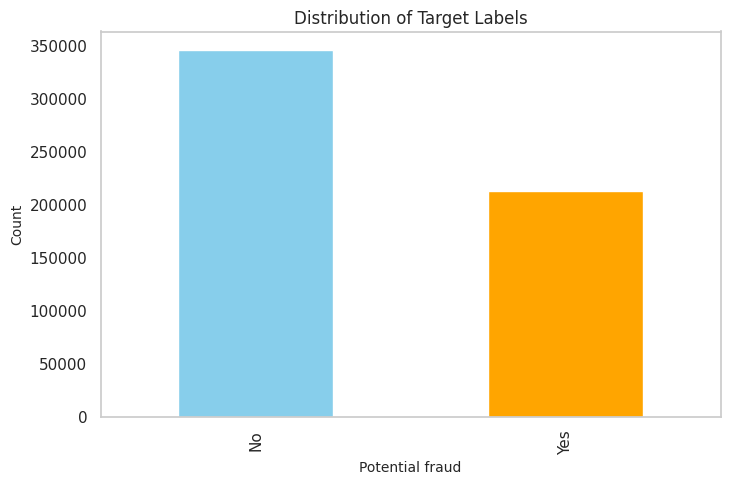

Original Class Distribution: Counter({'No': 345415, 'Yes': 212796})


In [ ]:
#Class label count

from collections import Counter

plt.figure(figsize=(8, 5))
df['PotentialFraud'].value_counts().plot(kind='bar', color=['skyblue', 'orange'])
plt.title('Distribution of Target Labels', fontsize = 12)
plt.xlabel('Potential fraud', fontsize = 10)
plt.ylabel('Count', fontsize = 10)

plt.grid(False)
plt.show()

# Display the original class distribution
print("Original Class Distribution:", Counter(df['PotentialFraud']))

In [ ]:
pd.DataFrame(df.isna().sum())

,0
BeneID,0
ClaimID,0
ClaimStartDt,0
ClaimEndDt,0
Provider,0
...,...
ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_2,554266
ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_3,557489
ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_1,555507
ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_2,557513


In [ ]:
df.fillna(value=0, inplace=True)


# Checking Nulls in the features
pd.DataFrame(df.isna().sum())

,0
BeneID,0
ClaimID,0
ClaimStartDt,0
ClaimEndDt,0
Provider,0
...,...
ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_2,0
ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_3,0
ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_1,0
ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_2,0


In [ ]:
#new_df.drop(['ClmProcedureCode_4', 'ClmProcedureCode_5', 'ClmProcedureCode_6'], axis=1, inplace=True)

drp_col = ['ClmDiagnosisCode_1','ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4',
           'ClmDiagnosisCode_5','ClaimID', 'ClaimStartDt', 'ClaimEndDt','AttendingPhysician', 'BeneID',
           'OperatingPhysician','OtherPhysician', 'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9',
           'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClmProcedureCode_2','ClmProcedureCode_3','ClmProcedureCode_6', 'DOB',  'State', 'County',
           'Race', 'DischargeDt', 'DiagnosisGroupCode', 'AdmissionDt', 'ClaimID', 'ClmProcedureCode_5']

#Drp Column

#drp_col_2 = ['ClmProcedureCode_1', 'ClmProcedureCode_2', 'ClmProcedureCode_3']
df.drop(columns=drp_col, axis=1, inplace=True)


In [ ]:
#Aggregating the claims data to each provider to analyse potential fraud by provider
new_df= df.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')

print(new_df.shape)

(5410, 73)


<ipython-input-131-ed4f56068986>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  new_df= df.groupby(['Provider','PotentialFraud'],as_index=False).agg('sum')


<ipython-input-132-fcc45a28be79>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = new_df.corr(method='pearson')


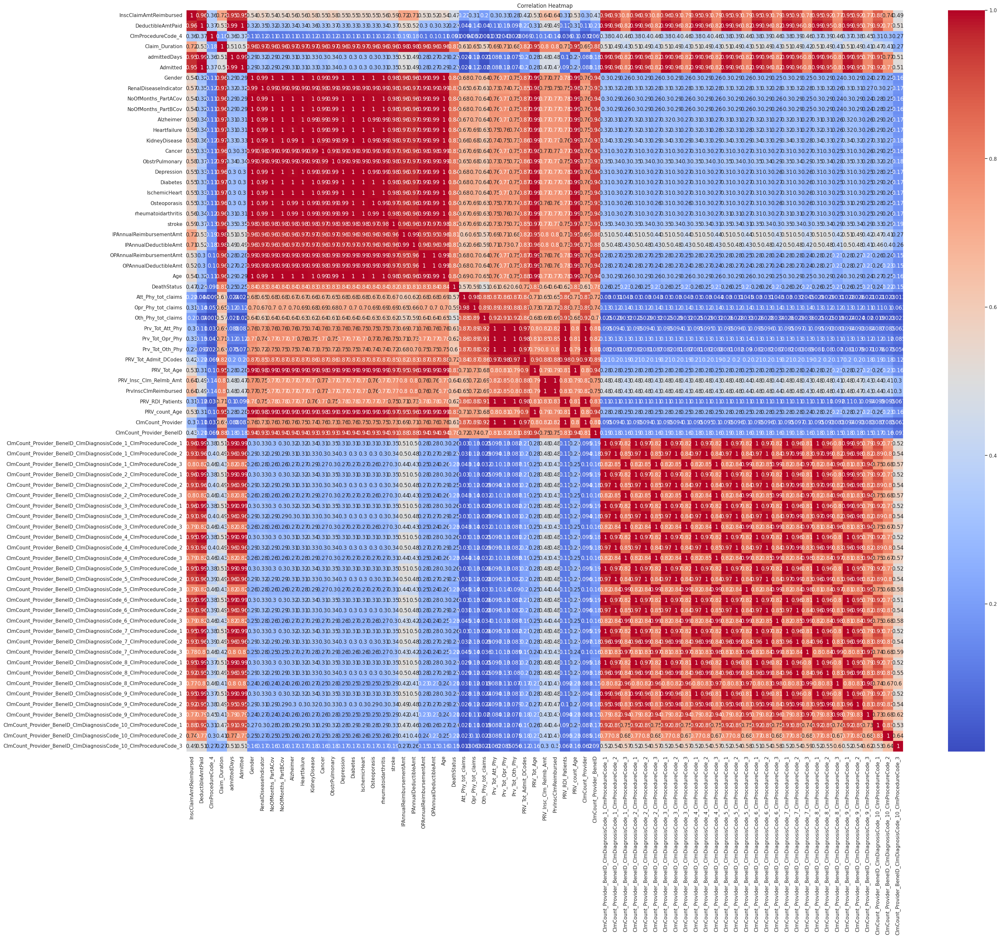

In [ ]:
corr = new_df.corr(method='pearson')

# Create a heatmap of Spearman's correlation using heatmap
plt.figure(figsize=(36, 30))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
selected_cols= ['Provider', 'PotentialFraud', 'InscClaimAmtReimbursed','DeductibleAmtPaid', 'Claim_Duration','admittedDays', 'Gender', 'RenalDiseaseIndicator', 'Admitted',
'NoOfMonths_PartACov', 'NoOfMonths_PartBCov', 'Alzheimer','Heartfailure', 'KidneyDisease', 'Cancer', 'ObstrPulmonary','Depression', 'Diabetes', 'IschemicHeart', 'Osteoporasis',
'rheumatoidarthritis', 'stroke', 'IPAnnualReimbursementAmt','IPAnnualDeductibleAmt', 'OPAnnualReimbursementAmt','OPAnnualDeductibleAmt', 'Age', 'DeathStatus', 'Att_Phy_tot_claims',
'Opr_Phy_tot_claims', 'Oth_Phy_tot_claims', 'Prv_Tot_Att_Phy','Prv_Tot_Opr_Phy', 'Prv_Tot_Oth_Phy', 'PRV_Tot_Admit_DCodes','PRV_Tot_Age', 'PRV_Insc_Clm_ReImb_Amt', 'PrvInscClmReimbursed','PRV_RDI_Patients', 'PRV_count_Age', 'ClmCount_Provider',
'ClmCount_Provider_BeneID']

corr_col = new_df[selected_cols]



In [ ]:
correlation = corr_col.corr(method='pearson')

<ipython-input-134-671f57d2ec16>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = corr_col.corr(method='pearson')


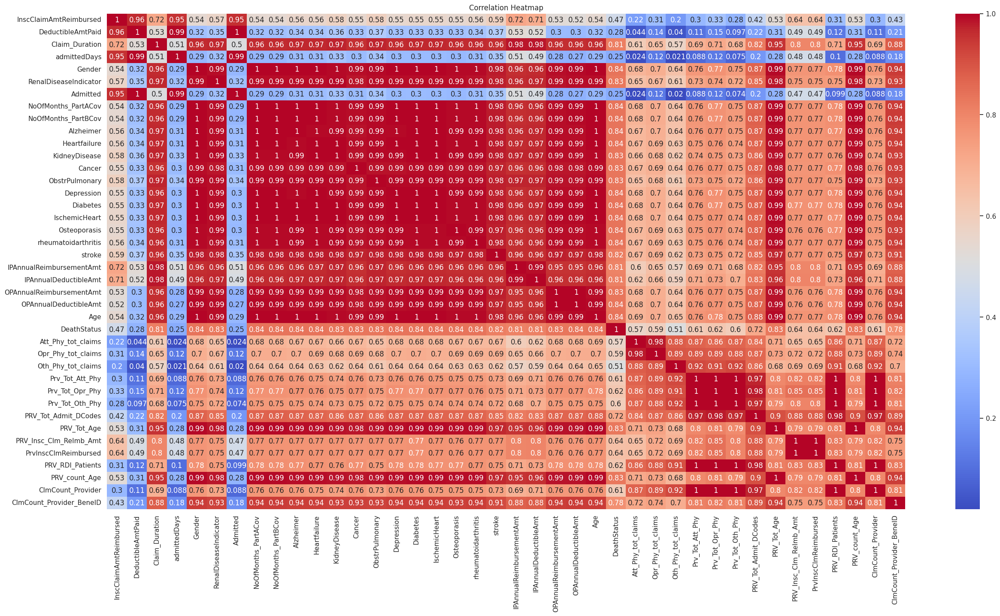

In [ ]:
# Create a heatmap of Spearman's correlation using heatmap
plt.figure(figsize=(30, 15))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
# Assuming df is your DataFrame
new_df['PotentialFraud'] = new_df['PotentialFraud'].map({'No': 0, 'Yes': 1})


In [ ]:
#create target label
X = new_df.drop(axis = 1, columns=['PotentialFraud', 'Provider'])
y = new_df['PotentialFraud']

In [ ]:
y.value_counts()

0    4904
1     506
Name: PotentialFraud, dtype: int64

0    90.64695
1     9.35305
Name: PotentialFraud, dtype: float64


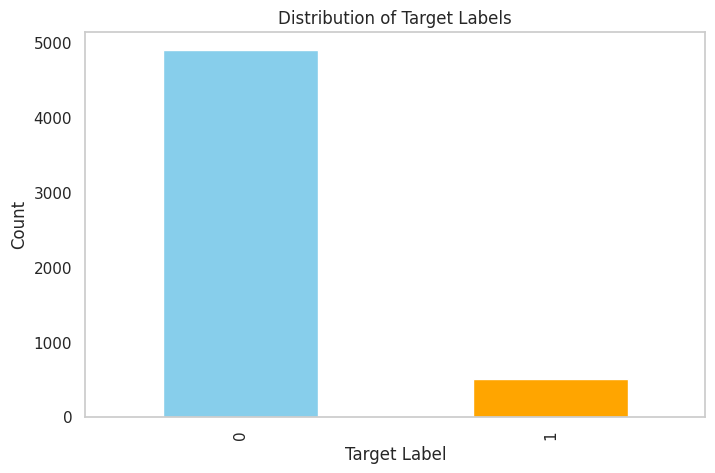

In [ ]:
target_val= y.value_counts()

percentage_distribution = target_val/ target_val.sum() * 100

# Print or use the percentage distribution

print(percentage_distribution)
# Plot the distribution of the target label
plt.figure(figsize=(8, 5))
pd.Series(y).value_counts().plot(kind='bar', color=['skyblue', 'orange'])
plt.title('Distribution of Target Labels')
plt.xlabel('Target Label')
plt.ylabel('Count')
plt.grid(False)
plt.show()

In [ ]:
def encode_col(df):
    df_encoded = pd.get_dummies(X, columns=df.select_dtypes(include=['object']).columns)
    return df_encoded

# Apply One-Hot Encoding
X= encode_col(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1    50.005097
0    49.994903
Name: PotentialFraud, dtype: float64


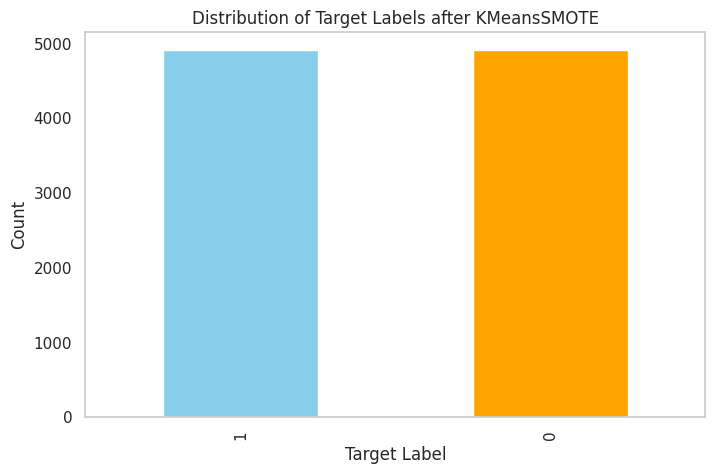

In [ ]:
# Apply KMeansSMOTE for oversampling method to manage class imbalance
kmeans_smote = KMeansSMOTE(random_state=42)
X_resampled, y_resampled = kmeans_smote.fit_resample(X, y)

target_val= y_resampled.value_counts()

percentage_distribution = target_val/ target_val.sum() * 100

# Print or use the percentage distribution

print(percentage_distribution)
# Plot the distribution of the target label after applying KMeansSMOTE
plt.figure(figsize=(8, 5))
pd.Series(y_resampled).value_counts().plot(kind='bar', color=['skyblue', 'orange'])
plt.title('Distribution of Target Labels after KMeansSMOTE')
plt.xlabel('Target Label')
plt.ylabel('Count')
plt.grid(False)
plt.show()

In [ ]:
# Display the resampled class distribution after KMeansSMOTE
print("Class Distribution after KMeansSMOTE:", Counter(y_resampled))

Class Distribution after KMeansSMOTE: Counter({1: 4905, 0: 4904})


In [ ]:
print("Class Distribution after KMeansSMOTE:", X_resampled.shape)
print("Class Distribution after KMeansSMOTE:", y_resampled.shape)

Class Distribution after KMeansSMOTE: (9809, 71)
Class Distribution after KMeansSMOTE: (9809,)


In [ ]:
# Handling data inconsistency

if X_resampled.shape[0] != y_resampled.shape[0]:
    # If inconsistent, adjust the number of samples in both X_resampled and y_resampled
    min_samples = min(X_resampled.shape[0], y_resampled.shape[0])
    X_resampled = X_resampled[:min_samples, :]
    y_resampled = y_resampled[:min_samples]

#Train/Test split: 80:20
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.20, stratify=y_resampled, random_state=39)


In [ ]:
y_test.shape

(1962,)

In [ ]:
# Normalization using RobustScaler to handle all data scale including outliers

#X_resampled_kmeans

scaler = RobustScaler()

scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)

MODEL TRAINING

In [ ]:
# Logistic Regression Classifier Initialization
LR_clf = LogisticRegression(C=0.0316228, penalty='l1', fit_intercept=True, solver='liblinear', tol=0.0001, max_iter=500,
                            class_weight='balanced', verbose=0, intercept_scaling=1.0,
                            multi_class='auto', random_state=75)

# Training the Logistic Regression Model with the training data
LR_clf.fit(X_train_std, y_train)

LogisticRegression(C=0.0316228, class_weight='balanced', intercept_scaling=1.0,
                   max_iter=500, penalty='l1', random_state=75,
                   solver='liblinear')

In [ ]:
# Prediction Probability Function
def pred_prob(clf, data):
    y_pred = clf.predict_proba(data)[:, 1]
    return y_pred

# ROC Curve Plotting Function
def draw_roc(train_fpr, train_tpr, test_fpr, test_tpr):
    # calculate auc for train and test
    train_auc = auc(train_fpr, train_tpr)
    test_auc = auc(test_fpr, test_tpr)

    # plot ROC
    with plt.style.context('seaborn-poster'):
        plt.plot(train_fpr, train_tpr, label="Train AUC ="+"{:.4f}".format(train_auc), color='blue')
        plt.plot(test_fpr, test_tpr, label="Test AUC ="+"{:.4f}".format(test_auc), color='red')
        plt.legend()
        plt.xlabel("False Positive Rate (FPR)", fontsize=10)
        plt.ylabel("True Positive Rate (TPR)", fontsize=10)
        plt.title("Area Under Curve (AUC)", fontsize=12)
        plt.grid(False)
        plt.minorticks_on()
        plt.show()

In [ ]:
# Function to Find Best Threshold
def find_best_threshold(threshold, fpr, tpr):
    t = threshold[np.argmax(tpr * (1 - fpr))]
    return t

# Function to Predict with Best Threshold
def predict_with_best_t(proba, threshold):
    predictions = []
    for i in proba:
        if i >= threshold:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

# Function to Draw Confusion Matrix
def draw_confusion_matrix(best_t, x_train, x_test, y_train, y_test, y_train_pred, y_test_pred):
    # plot the confusion matrix
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))

    train_pred = predict_with_best_t(y_train_pred, best_t)
    cm = confusion_matrix(y_train, train_pred)
    with plt.style.context('seaborn'):
        sns.heatmap(cm, annot=True, fmt='d', ax=ax[0], cmap='inferno')
        ax[0].set_title('Train Dataset Confusion Matrix', fontsize=12)
        ax[0].set_xlabel("Predicted Label", fontsize=10)
        ax[0].set_ylabel("Actual Label", fontsize=10)

    test_pred = predict_with_best_t(y_test_pred, best_t)
    cm = confusion_matrix(y_test, test_pred)
    with plt.style.context('seaborn'):
        sns.heatmap(cm, annot=True, fmt='d', ax=ax[1], cmap='Blues')
        ax[1].set_title('Test Dataset Confusion Matrix', fontsize=12)
        ax[1].set_xlabel("Predicted Label", fontsize=10)
        ax[1].set_ylabel("Actual Label", fontsize=10)
        plt.show()

    return train_pred, test_pred



In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def validate_model(clf, x_train, x_test, y_train, y_test):
    # predict the probability of train data
    y_train_pred = pred_prob(clf, x_train)

    # predict the probability of test data
    y_test_pred = pred_prob(clf, x_test)

    # calculate tpr, fpr using roc_curve
    train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
    test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

    # calculate auc for train and test
    train_auc = auc(train_fpr, train_tpr)
    print(" Train AUC = {:.4f}".format(train_auc))
    test_auc = auc(test_fpr, test_tpr)
    print(" Test AUC = {:.4f}".format(test_auc))

    # plotting the ROC curve
    draw_roc(train_fpr, train_tpr, test_fpr, test_tpr)

    # Best threshold value
    best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)

    # Plotting the confusion matrices
    train_pred, test_pred = draw_confusion_matrix(best_t, x_train, x_test, y_train, y_test, y_train_pred, y_test_pred)

    # Generating precision, recall, and support
    train_precision, train_recall, _, _ = precision_recall_fscore_support(y_train, train_pred, average='binary')
    test_precision, test_recall, _, _ = precision_recall_fscore_support(y_test, test_pred, average='binary')

    # Calculate accuracy for both training and testing sets
    train_accuracy = accuracy_score(y_train, train_pred)
    test_accuracy = accuracy_score(y_test, test_pred)

    print("\n")
    print(" Best Threshold = {:.4f}".format(best_t))
    print(" Model Test AUC is : {:.4f}".format(test_auc))
    print(" Training Precision = {:.4f}, Recall = {:.4f}, Accuracy = {:.4f}".format(train_precision, train_recall, train_accuracy))
    print(" Testing Precision = {:.4f}, Recall = {:.4f}, Accuracy = {:.4f}".format(test_precision, test_recall, test_accuracy))

    return test_auc, train_precision, train_recall, test_precision, test_recall, train_accuracy, test_accuracy, best_t

    #return test_auc, train_precision, train_recall, test_precision, test_recall, best_t

 Train AUC = 0.9904
 Test AUC = 0.9893


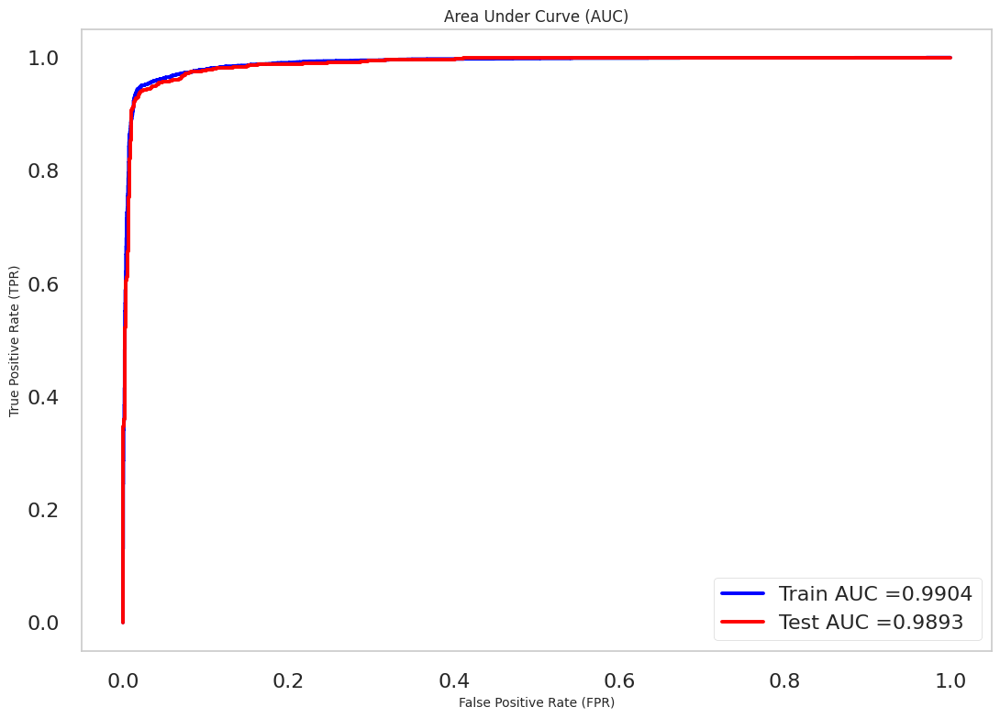

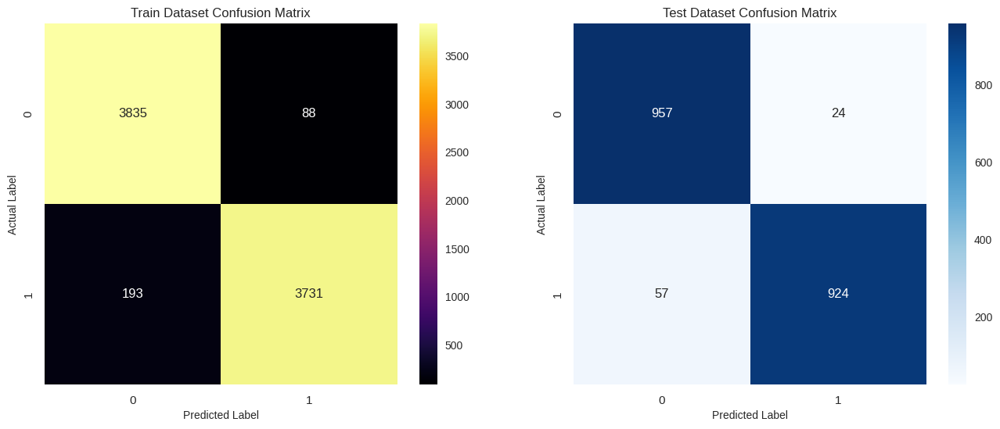



Best Threshold = 0.6076
 Model Test AUC is : 0.9893
 Training Precision = 0.9770, Recall = 0.9508, Accuracy = 0.9642
 Testing Precision = 0.9747, Recall = 0.9419, Accuracy = 0.9587


In [ ]:
# Validate Logistic Regression model

# Validate the model
test_auc, train_precision, train_recall, test_precision, test_recall, train_accuracy, test_accuracy, best_t = validate_model(LR_clf, X_train_std, X_test_std, y_train, y_test)



In [ ]:
#calculate the feature importance

imp_fts = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': LR_clf.coef_[0]})
imp_fts = imp_fts[imp_fts['Importance_Model_1'] != 0]
imp_fts.reset_index(drop=True, inplace=True)
imp_fts.head(10)

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,6.395839
1,ClmProcedureCode_4,0.000161
2,stroke,0.119432
3,Att_Phy_tot_claims,0.029337
4,Oth_Phy_tot_claims,-0.031149
5,PRV_RDI_Patients,0.023893
6,ClmCount_Provider_BeneID,0.965191
7,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_Cl...,0.232483


In [ ]:
top_5_pos_feats = imp_fts.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:5]
top_5_pos_feats_scores = imp_fts.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:5]

<ipython-input-154-7c9993b4d6a1>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_5_pos_feats, x=top_5_pos_feats_scores, orient='h', palette='coolwarm')


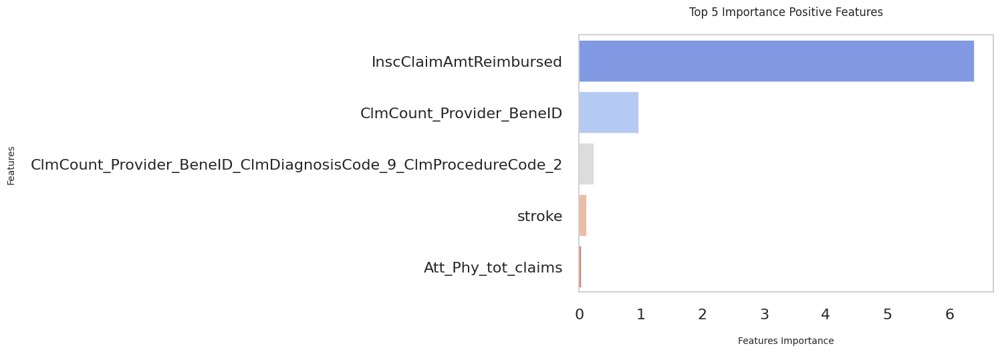

In [ ]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(8, 5))
    sns.barplot(y=top_5_pos_feats, x=top_5_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontsize= 10)
    plt.ylabel("Features\n", fontsize = 10)
    plt.grid(False)
    plt.title("Top 5 Importance Positive Features\n", fontsize = 12)

<ipython-input-155-fa0670a51a74>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_5_neg_feats, x=top_5_neg_feats_scores, orient='h', palette='coolwarm')


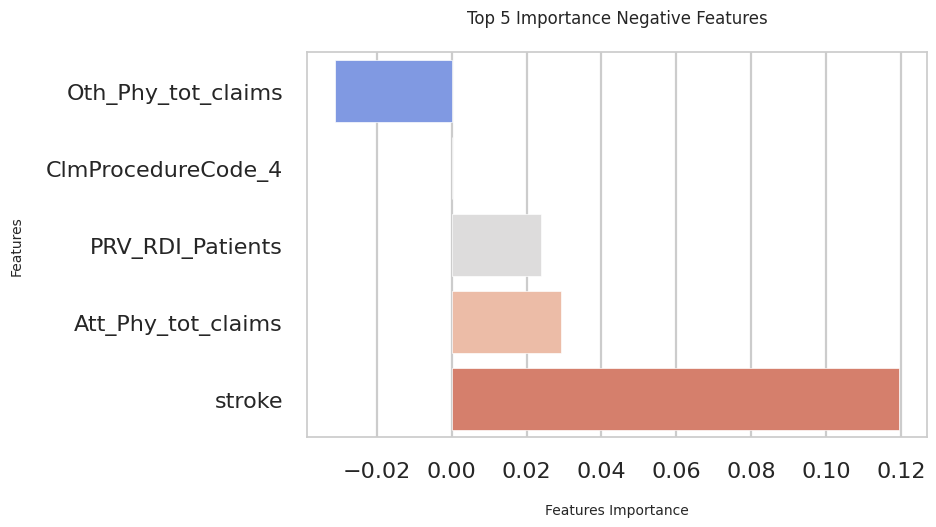

In [ ]:
top_5_neg_feats = imp_fts.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Features'].iloc[0:5]
top_5_neg_feats_scores = imp_fts.sort_values(by='Importance_Model_1',axis=0,ascending=True)['Importance_Model_1'].iloc[0:5]

#plot

with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(8, 5))
    sns.barplot(y=top_5_neg_feats, x=top_5_neg_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontsize = 10)
    plt.ylabel("Features\n", fontsize = 10)
    plt.title("Top 5 Importance Negative Features\n", fontsize = 12)

In [ ]:
# Model training using RF classifier
#defining the hyperparameters using Gini impurity criterion

RF_clf = RandomForestClassifier(n_estimators=50,criterion='gini',
                                   max_depth= 6,
                                   max_features='auto',
                                   min_samples_leaf=50,
                                   min_samples_split=50,
                                   class_weight='balanced',
                                   random_state=75,
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

RF_clf.fit(X_train_std, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomForestClassifier(class_weight='balanced', max_depth=6,
                       max_features='auto', min_samples_leaf=50,
                       min_samples_split=50, n_estimators=50, random_state=75)

 Train AUC = 0.9936
 Test AUC = 0.9915


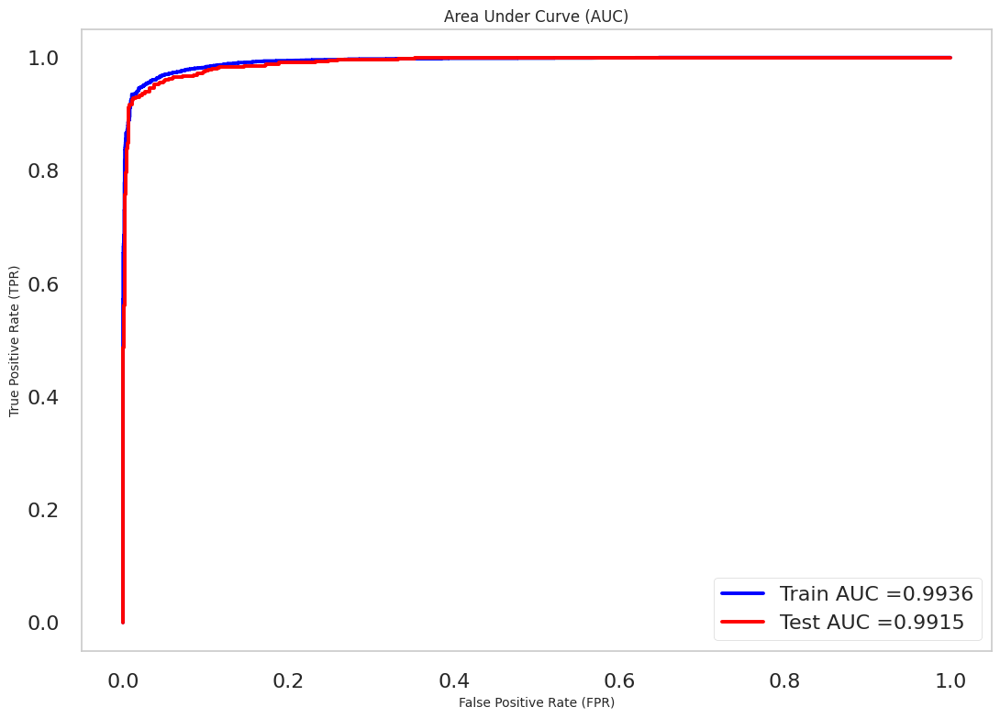

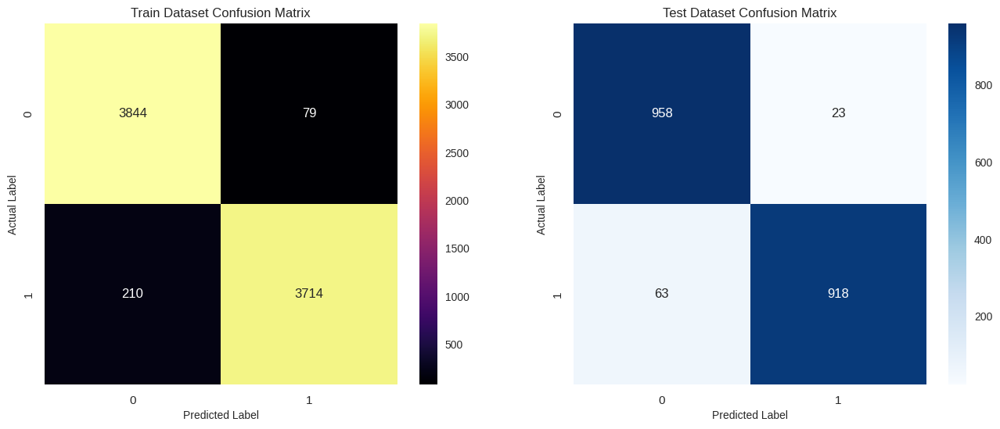



Best Threshold = 0.5759
 Model Test AUC is : 0.9915
 Training Precision = 0.9792, Recall = 0.9465, Accuracy = 0.9632
 Testing Precision = 0.9756, Recall = 0.9358, Accuracy = 0.9562


In [ ]:
#Model validation

test_auc, train_precision, train_recall, test_precision, test_recall,train_accuracy, test_accuracy, best_t = validate_model(RF_clf, X_train_std, X_test_std, y_train, y_test)


In [ ]:
#important features

rf_imp_ft = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': RF_clf.feature_importances_})
rf_imp_ft = rf_imp_ft[rf_imp_ft['Importance_Model_1'] != 0]
rf_imp_ft.reset_index(drop=True, inplace=True)
rf_imp_ft.head(5)

,Features,Importance_Model_1
0,InscClaimAmtReimbursed,0.106803
1,DeductibleAmtPaid,0.007845
2,Claim_Duration,0.018481
3,admittedDays,0.003296
4,Admitted,0.002224


<ipython-input-159-6f4909f1812d>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=top_5_pos_feats, x=top_5_pos_feats_scores, orient='h', palette='coolwarm')


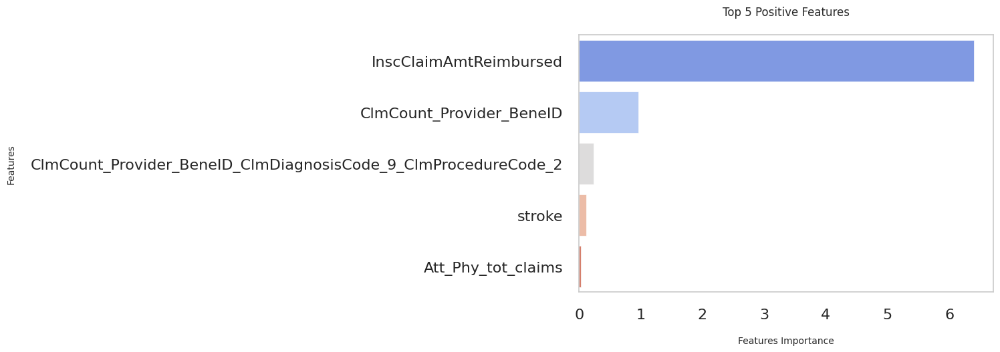

In [ ]:
rf_top_5_pos_feats = rf_imp_ft.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:5]
rf_top_5_pos_feats_scores = rf_imp_ft.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:5]

with plt.style.context('seaborn-poster'):
    plt.figure(figsize= (8,5))
    sns.barplot(y=top_5_pos_feats, x=top_5_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontsize = 10)
    plt.ylabel("Features\n", fontsize = 10)
    plt.grid(False)
    plt.title("Top 5 Positive Features\n", fontsize = 12)

In [ ]:
#Defining the hyperparameters
DT_clf = DecisionTreeClassifier(criterion='gini',
                                   max_depth= 10,
                                   max_features='log2',
                                   min_samples_leaf=150,
                                   min_samples_split=150,
                                   class_weight='balanced',
                                   random_state=49,
                                   splitter='best',
                                   min_weight_fraction_leaf=0.0,
                                   max_leaf_nodes=None,
                                   min_impurity_decrease=0.0,
                                   ccp_alpha=0.0,)

DT_clf.fit(X_train_std, y_train)


DecisionTreeClassifier(class_weight='balanced', max_depth=10,
                       max_features='log2', min_samples_leaf=150,
                       min_samples_split=150, random_state=49)

 Train AUC = 0.9894
 Test AUC = 0.9862


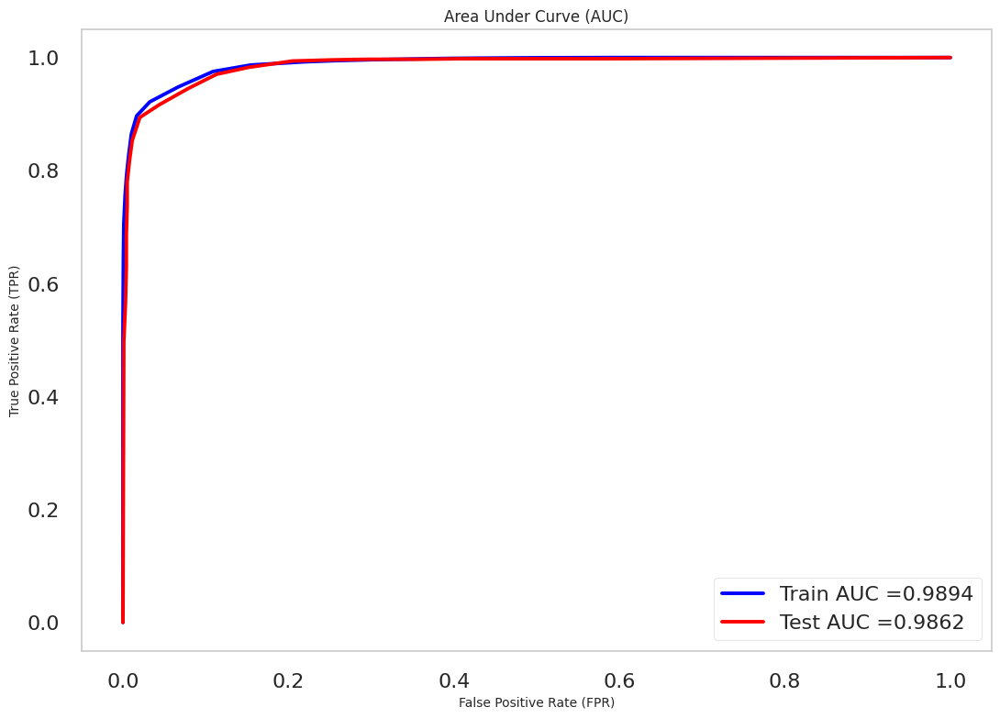

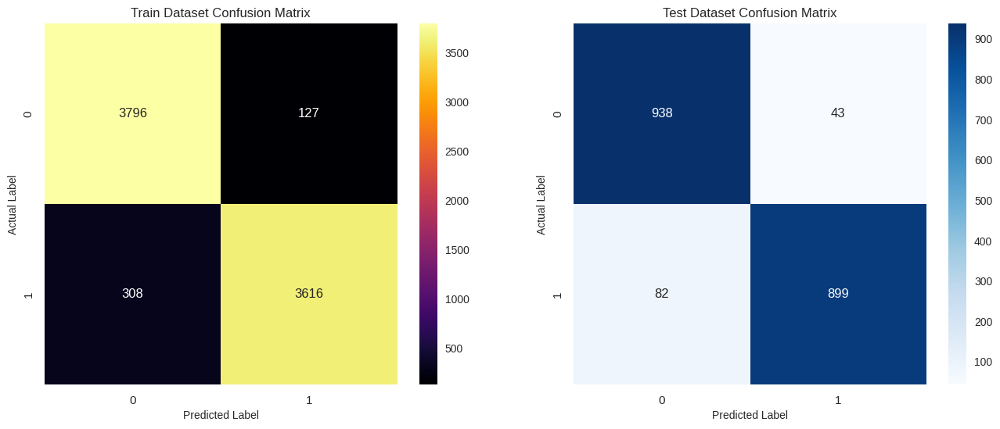



Best Threshold = 0.6100
 Model Test AUC is : 0.9862
 Training Precision = 0.9661, Recall = 0.9215, Accuracy = 0.9446
 Testing Precision = 0.9544, Recall = 0.9164, Accuracy = 0.9363


In [ ]:
#Model validation
test_auc, train_precision, train_recall, test_precision, test_recall,train_accuracy, test_accuracy, best_t = validate_model(DT_clf, X_train_std, X_test_std, y_train, y_test)


In [ ]:
dt_imp_ft = pd.DataFrame({'Features': X_train.columns, 'Importance_Model_1': DT_clf.feature_importances_})
dt_imp_ft = dt_imp_ft[dt_imp_ft['Importance_Model_1'] != 0]
dt_imp_ft.reset_index(drop=True, inplace=True)
dt_imp_ft.head(5)

,Features,Importance_Model_1
0,DeductibleAmtPaid,9.548480e-05
1,Claim_Duration,1.095360e-03
2,NoOfMonths_PartBCov,8.226947e-03
3,Alzheimer,6.344157e-06
4,KidneyDisease,8.586692e-07


<ipython-input-163-842feb7aabc2>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y=dt_top_5_pos_feats, x=dt_top_5_pos_feats_scores, orient='h', palette='coolwarm')


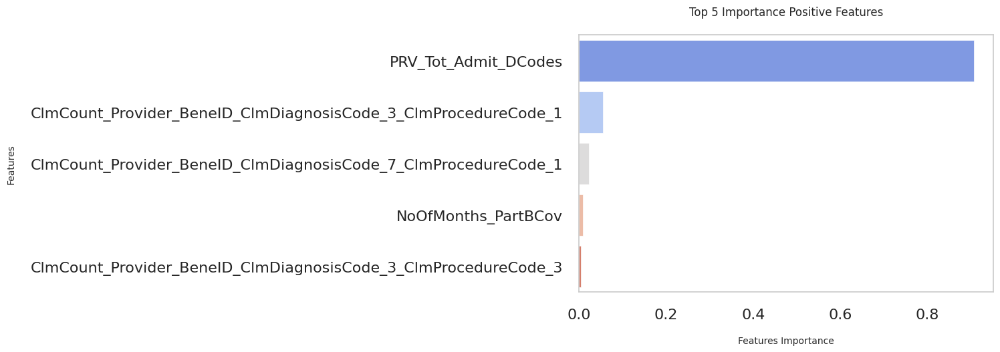

In [ ]:
dt_top_5_pos_feats = dt_imp_ft.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Features'].iloc[0:5]
dt_top_5_pos_feats_scores = dt_imp_ft.sort_values(by='Importance_Model_1',axis=0,ascending=False)['Importance_Model_1'].iloc[0:5]

with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(8,5))
    sns.barplot(y=dt_top_5_pos_feats, x=dt_top_5_pos_feats_scores, orient='h', palette='coolwarm')
    plt.xlabel("\nFeatures Importance", fontsize=10)
    plt.ylabel("Features\n", fontsize=10)
    plt.grid(False)
    plt.title("Top 5 Importance Positive Features\n", fontsize=12)

Using an ensemble model; Rf and Gradient Boost

 Train AUC = 0.9995
 Test AUC = 0.9924


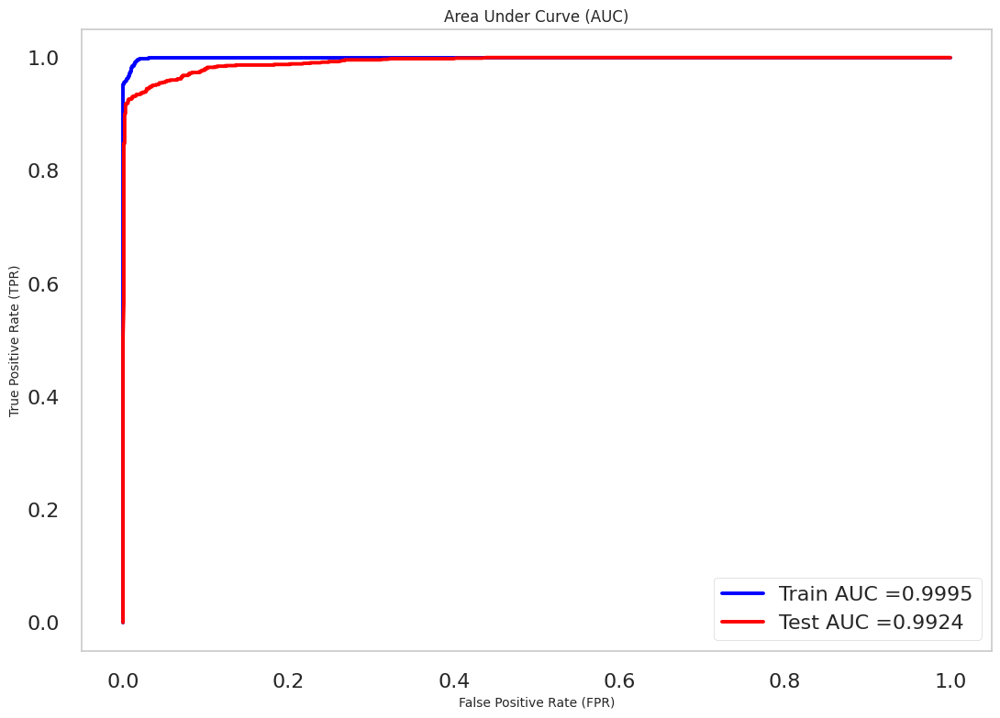

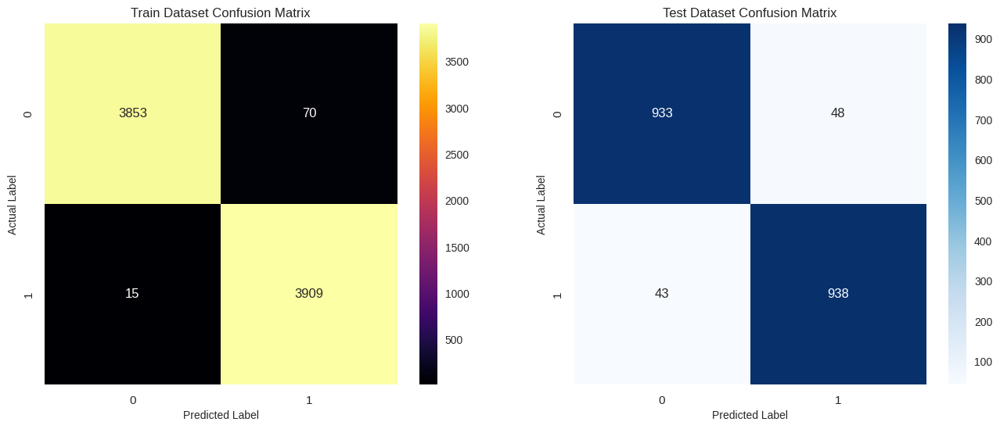



Best Threshold = 0.3503
 Model Test AUC is : 0.9924
 Training Precision = 0.9824, Recall = 0.9962, Accuracy = 0.9892
 Testing Precision = 0.9513, Recall = 0.9562, Accuracy = 0.9536


In [ ]:

# Create individual classifiers
rf_clf = RandomForestClassifier(n_estimators=50, random_state=75)
gb_clf = GradientBoostingClassifier(n_estimators=50, random_state=75)

# Create an ensemble using a VotingClassifier
ensemble_clf = VotingClassifier(estimators=[
    ('random_forest', rf_clf),
    ('gradient_boosting', gb_clf)
], voting='soft')

# Train the ensemble on the training data
ensemble_clf.fit(X_train_std, y_train)

# Predictions on the training set
y_train_pred_ensemble = ensemble_clf.predict(X_train_std)

# Predictions on the testing set
y_test_pred_ensemble = ensemble_clf.predict(X_test_std)


#model validation
test_auc, train_precision, train_recall, test_precision, test_recall, train_accuracy, test_accuracy, best_t = validate_model(ensemble_clf, X_train_std, X_test_std, y_train, y_test)



Model Ensembling using Logistic Regression, Decision Tree and Gradient Boost

In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, VotingClassifier
from xgboost import XGBClassifier

In [ ]:
#Hyperparameter Tuning of boosting classifier
ada_params = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}
ada_clf = AdaBoostClassifier(random_state=42)
ada_grid = GridSearchCV(ada_clf, ada_params, cv=3)
ada_grid.fit(X_train_std, y_train)
best_ada_clf = ada_grid.best_estimator_

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


 Train AUC = 0.9995
 Test AUC = 0.9909


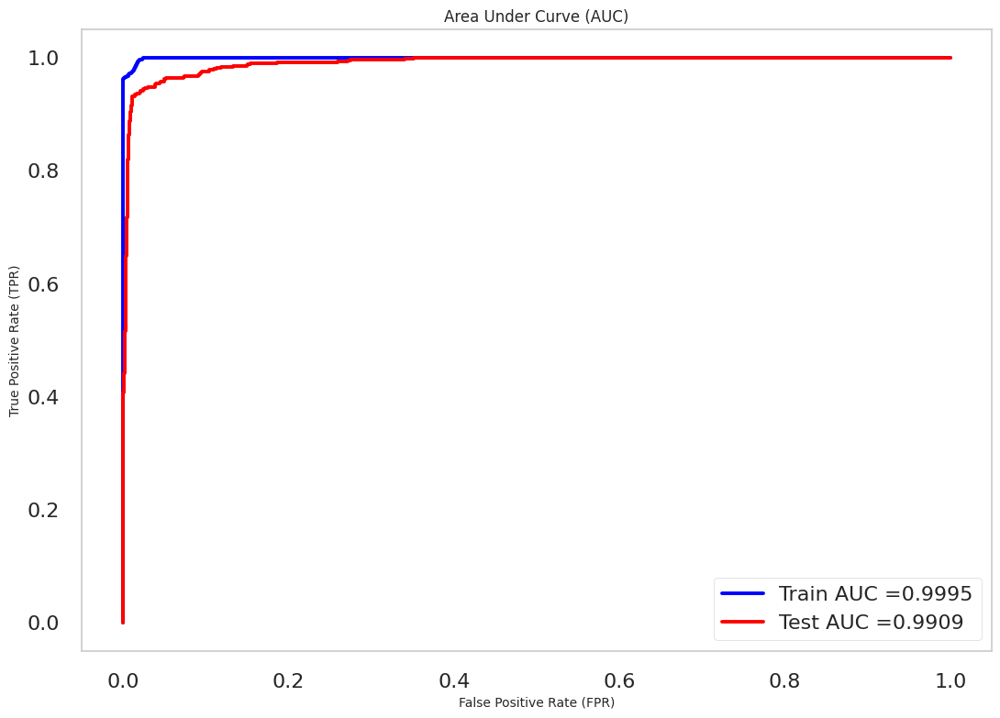

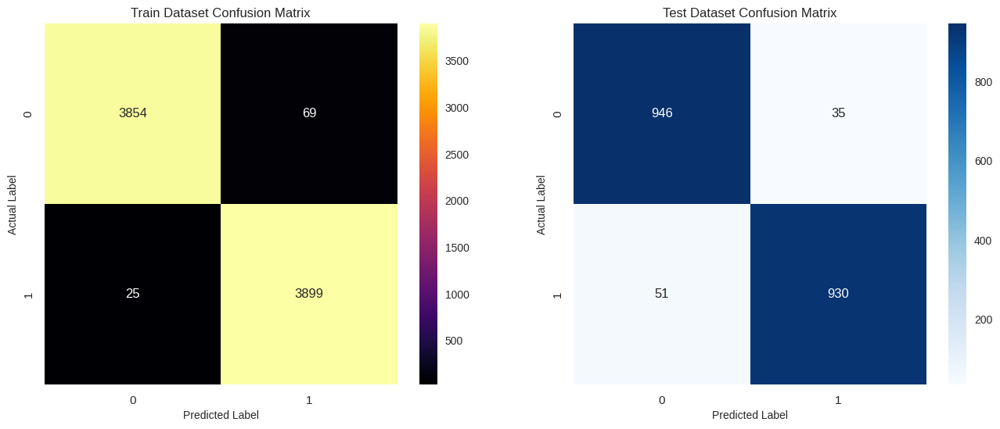

 Training Precision = 0.9826, Recall = 0.9936, Accuracy = 0.9880
 Testing Precision = 0.9637, Recall = 0.9480, Accuracy = 0.9562
 Training Precision = 0.9826, Recall = 0.9936
 Testing Precision = 0.9637, Recall = 0.9480


Best Threshold = 0.4554
 Model Test AUC is : 0.9909
 Model Train Precision is : 0.9826
 Model Test Precision is : 0.9637
 Model Train Recall is : 0.9936
 Model Test Recall is : 0.9480


In [ ]:
# Create individual classifiers
lr_clf = LogisticRegression(random_state=75)
xgb_clf = XGBClassifier(random_state=75)

# Create an ensemble using a VotingClassifier
ensemble_clf_2 = VotingClassifier(estimators=[
    ('logistic_regression', lr_clf),
    ('xgboost_classifier', xgb_clf),
    ('adaboost', best_ada_clf),
], voting='soft')

# Fit and evaluate the ensemble models
ensemble_clf_2.fit(X_train_std, y_train)

# Predictions on the testing set
y_test_pred_ensemble = ensemble_clf_2.predict(X_test_std)

#model validation
test_auc, train_precision, train_recall, test_precision, test_recall,train_accuracy, test_accuracy, best_t = validate_model(ensemble_clf_2, X_train_std, X_test_std, y_train, y_test)



NEURAL NETWORK USING KERAS


In [ ]:

model = Sequential([
    Dense(64, input_shape=(X_train_std.shape[1],), activation='relu'),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')])

def create_model(learning_rate=0.001, dropout_rate=0.2):
    model = Sequential([
        Dense(64, input_shape=(X_train_std.shape[1],), activation='relu'),
        Dropout(dropout_rate),
        Dense(32, activation='relu'),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid')
    ])
# Compile model using adam optimizer
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Model training
history = model.fit(X_train_std, y_train, epochs=10, batch_size=32, validation_data=(X_test_std, y_test))


# Evaluate the model on the test set

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

# prediction
y_pred_prob = model.predict(X_test_std)
y_pred = (y_pred_prob > 0.5).astype(int)

# Evaluate the model on the test set

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

# Make predictions on the test set
y_pred_prob = model.predict(X_test_std)
y_pred = (y_pred_prob > 0.5).astype(int)

Epoch 1/10
246/246 [==============================] - 4s 5ms/step - loss: 0.5822 - accuracy: 0.9374 - val_loss: 2.4972 - val_accuracy: 0.9495
Epoch 2/10
246/246 [==============================] - 1s 4ms/step - loss: 0.7938 - accuracy: 0.9531 - val_loss: 1.1582 - val_accuracy: 0.9536
Epoch 3/10
246/246 [==============================] - 1s 4ms/step - loss: 0.4645 - accuracy: 0.9537 - val_loss: 1.7106 - val_accuracy: 0.9536
Epoch 4/10
246/246 [==============================] - 1s 5ms/step - loss: 0.5566 - accuracy: 0.9559 - val_loss: 0.4442 - val_accuracy: 0.9562
Epoch 5/10
246/246 [==============================] - 1s 6ms/step - loss: 0.6070 - accuracy: 0.9560 - val_loss: 0.5578 - val_accuracy: 0.9567
Epoch 6/10
246/246 [==============================] - 1s 4ms/step - loss: 0.3536 - accuracy: 0.9572 - val_loss: 1.5911 - val_accuracy: 0.8863
Epoch 7/10
246/246 [==============================] - 1s 4ms/step - loss: 0.2785 - accuracy: 0.9576 - val_loss: 0.5681 - val_accuracy: 0.9592
Epoch 

In [ ]:
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_prob)

print(" Test Precision = {:.4f}, Recall = {:.4f}, roc_auc = {:.4f}".format(precision, recall, roc_auc))


 Test Precision = 0.9657, Recall = 0.9470, roc_auc = 0.9863


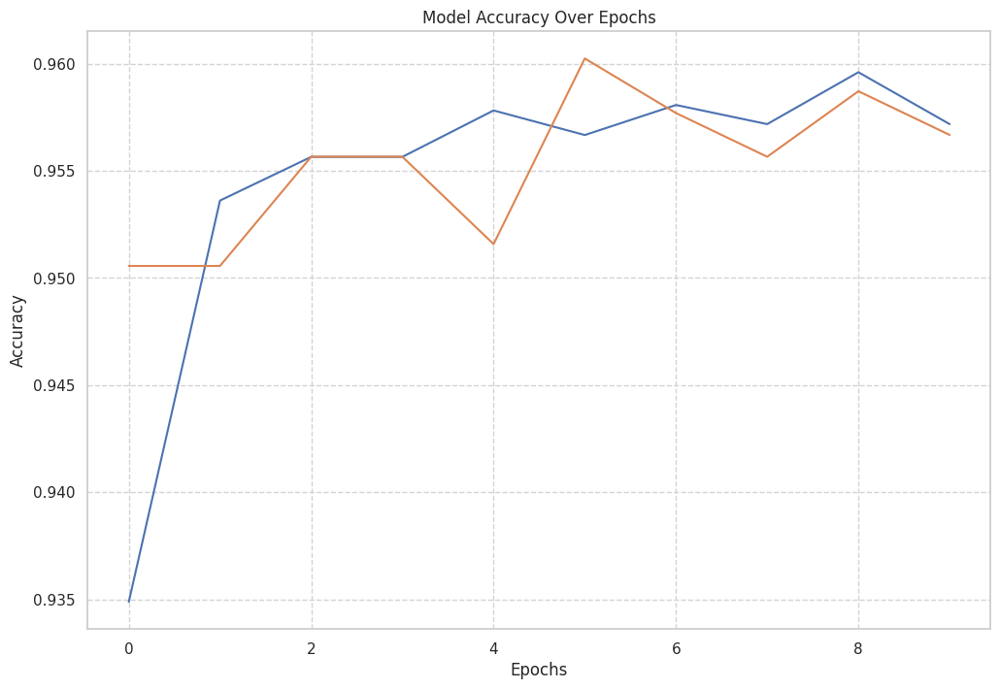

In [ ]:

# Plot training and validation accuracy over epochs
plt.figure(figsize=(12,8))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')

Precision: 0.9657
Recall: 0.9470
F1-Score: 0.9563


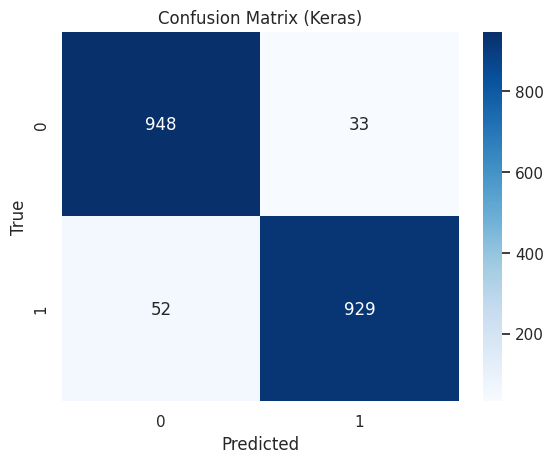

In [ ]:

# Calculate precision, recall, and F1-score
precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, average='binary')

# Display precision, recall, and F1-score
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Keras)')
plt.show()


ANN- USING MULTI LAYER PERCEPTRON CLASSIFIER

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV

# Assuming you have X_train_std, y_train, X_test_std

# Define the MLP model
mlp_model = MLPClassifier(random_state=42)

# Define the hyperparameters to tune
param_grid = {
    'hidden_layer_sizes': [(64, 32), (64, 64, 32), (32, 16)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': [0.0001, 0.001, 0.01],
}

# Perform GridSearchCV
grid_search = GridSearchCV(mlp_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train_std, y_train)

# Get the best parameters
best_params = grid_search.best_params_



In [ ]:

# Train the model with the best parameters
best_mlp_model = MLPClassifier(random_state=42, **best_params)
best_mlp_model.fit(X_train_std, y_train)


MLPClassifier(alpha=0.001, hidden_layer_sizes=(64, 64, 32), random_state=42)

In [ ]:
# Model prediction
y_predict = best_mlp_model.predict(X_test_std)

# Model prediction probabilities
y_prob = best_mlp_model.predict_proba(X_test_std)[:, 1]


Accuracy: 0.9622833843017329
AUC-ROC: 0.9901211707456974
Confusion Matrix:
[[961  20]
 [ 54 927]]
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       981
           1       0.98      0.94      0.96       981

    accuracy                           0.96      1962
   macro avg       0.96      0.96      0.96      1962
weighted avg       0.96      0.96      0.96      1962



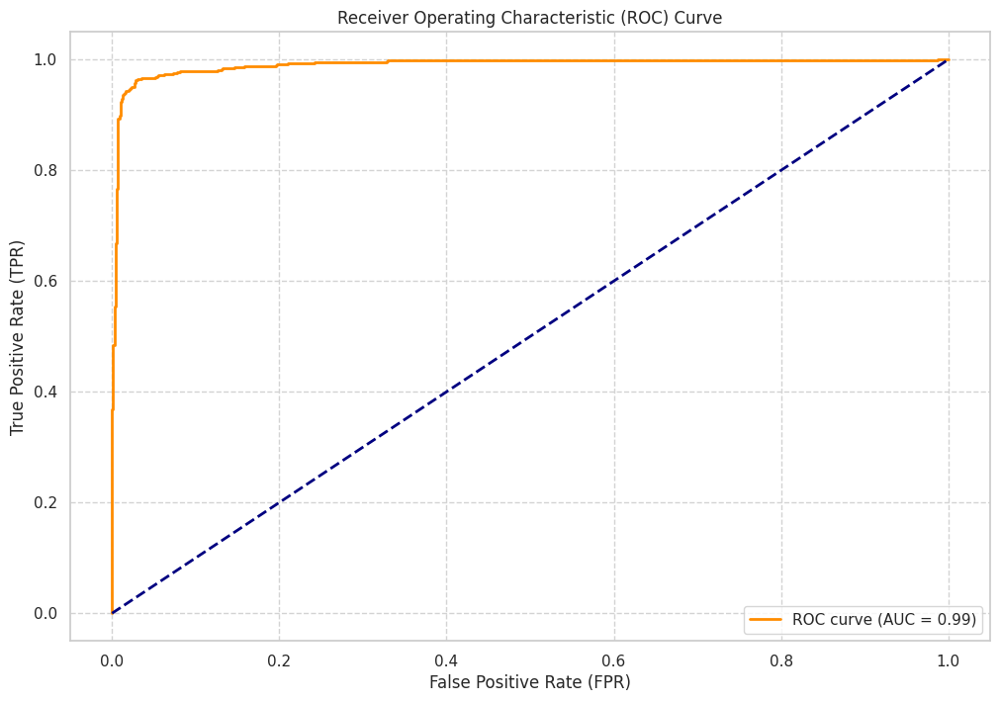

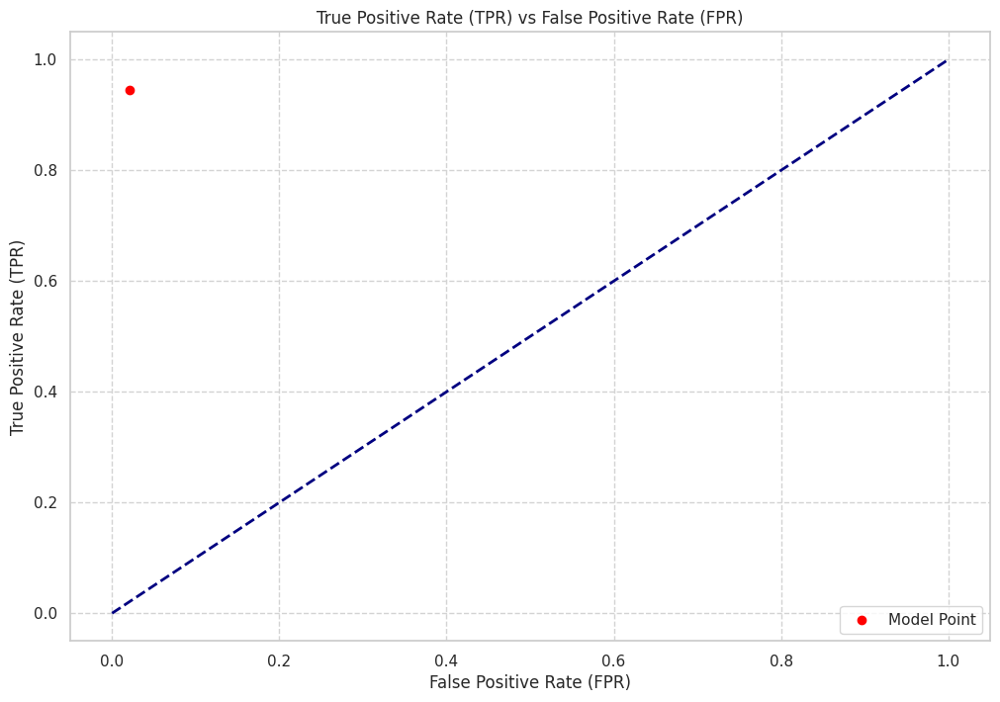

In [ ]:

# Calculate accuracy, AUC, and other metrics
accuracy = accuracy_score(y_test, y_predict)
roc_auc = roc_auc_score(y_test, y_prob)
conf_matrix = confusion_matrix(y_test, y_predict)
classification_rep = classification_report(y_test, y_predict)

# Display the performance metrics
print("Accuracy:", accuracy)
print("AUC-ROC:", roc_auc)
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_rep)

# Plot ROC curve with AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(12, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')

# Plot True Positive Rate (TPR) and False Positive Rate (FPR) from confusion matrix
tpr_plot = conf_matrix[1, 1] / (conf_matrix[1, 1] + conf_matrix[1, 0])
fpr_plot = conf_matrix[0, 1] / (conf_matrix[0, 1] + conf_matrix[0, 0])

plt.figure(figsize=(12, 8))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr_plot, tpr_plot, color='red', label='Model Point')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('True Positive Rate (TPR) vs False Positive Rate (FPR)')
plt.legend(loc='lower right')
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')


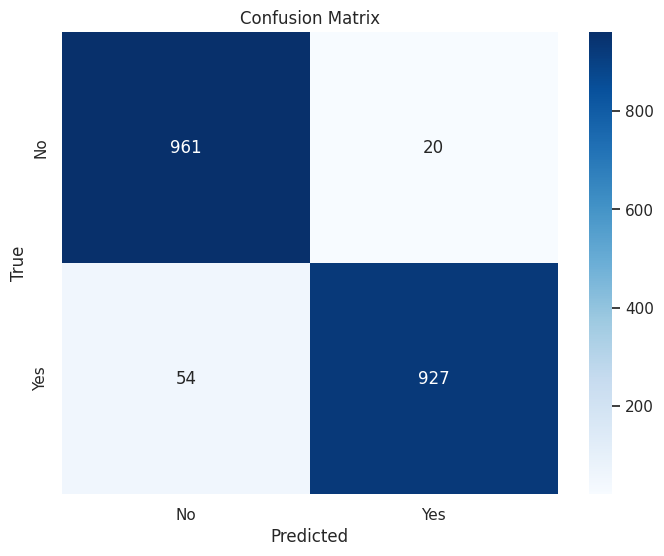

In [ ]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_predict)

# Display the confusion matrix using seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

UNSUPERVISED MACHINE LEARNING USING KMeans cluster algorithm

In [ ]:
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [ ]:
#Clean the provider column and remove prefixed value "PRV"

provider_codes = new_df['Provider']

In [ ]:
# Removing the "PRV" prefix for each code
cleaned_provider = [code[3:] for code in provider_codes]

In [ ]:
new_df['provider_2']= cleaned_provider

In [ ]:
new_df.head(2)

,Provider,PotentialFraud,InscClaimAmtReimbursed,DeductibleAmtPaid,ClmProcedureCode_4,Claim_Duration,admittedDays,Admitted,Gender,RenalDiseaseIndicator,...,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_8_ClmProcedureCode_3,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_9_ClmProcedureCode_3,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_1,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_2,ClmCount_Provider_BeneID_ClmDiagnosisCode_10_ClmProcedureCode_3,provider_2
0,PRV51001,0,104640,5340.0,0.0,36,25.0,5,41,8,...,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,51001
1,PRV51003,1,605670,66286.0,0.0,485,320.0,62,210,29,...,31.0,7.0,0.0,28.0,7.0,0.0,3.0,1.0,0.0,51003


In [ ]:
X_df = new_df.drop(['PotentialFraud', 'Provider'], axis=1)


In [ ]:

'''# One-hot encoding
X_df = pd.get_dummies(X_df['Provider'], prefix='provider')
'''

"# One-hot encoding\nX_df = pd.get_dummies(X_df['Provider'], prefix='provider')\n"

In [ ]:
# Standardize the features
scaler = RobustScaler()

# Fit and transform the data
X_scaled = scaler.fit_transform(X_df)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

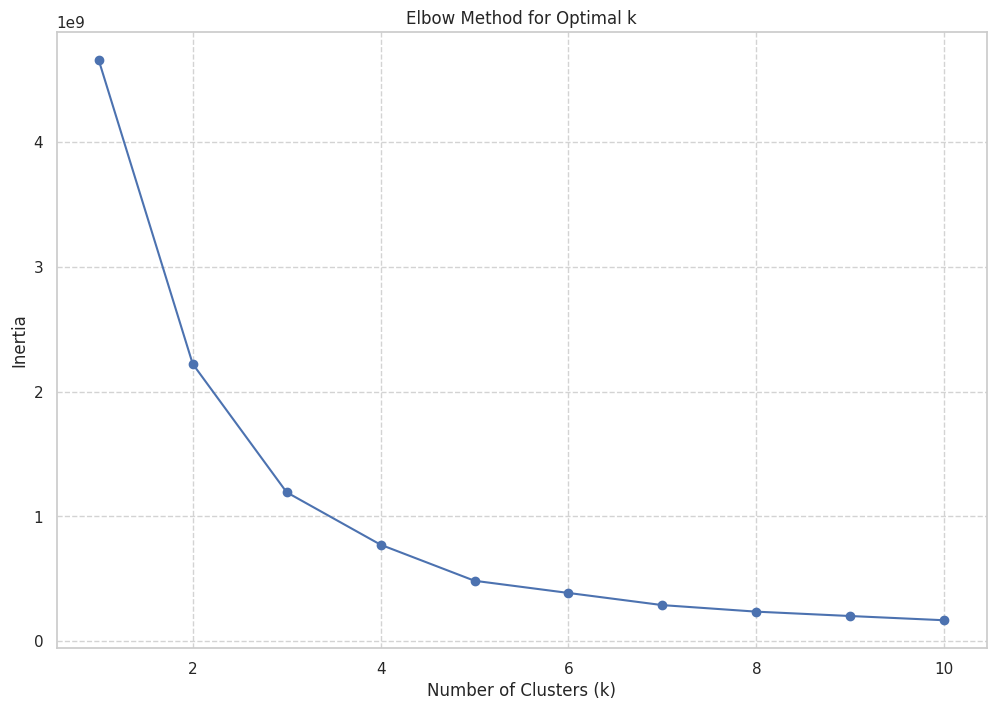

In [ ]:
# Determine the optimal number of clusters (k) using the Elbow Method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow curve
plt.figure(figsize=(12, 8))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')

In [ ]:
# select optimal number of clusters (k)
optimal_k = 3

# Train the K-means model with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)

#test clusters
X_df['Cluster'] = kmeans.fit_predict(X_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
# Evaluate model performance
# Calculate silhouette score
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X, kmeans.labels_)
print(f"Silhouette score: {silhouette_avg:.2f}")

# Label clusters
# Calculate centroid of each cluster
centroids = kmeans.cluster_centers_
# Examine features of data points in each cluster
for i in range(kmeans.n_clusters):
    cluster_data = X[kmeans.labels_ == i]
    print(f"Cluster {i+1}: {len(cluster_data)} data points")
    print(f"Centroid: {centroids[i]}")

Silhouette score: 0.89
Cluster 1: 5316 data points
Centroid: [8.51224984e-01 1.22017846e+00 6.58577878e-01 7.40966789e-01
 1.32045119e+00 1.25797592e+00 8.40971888e-01 8.06386381e-01
 8.37308306e-01 8.38099839e-01 8.28883324e-01 8.26607598e-01
 8.02004241e-01 7.91384500e-01 7.68572379e-01 8.20316027e-01
 8.19122912e-01 8.30881615e-01 8.20285929e-01 8.31971407e-01
 8.39964259e-01 7.67113539e-01 7.55248656e-01 8.45308571e-01
 8.43930477e-01 8.41117419e-01 7.08803612e-01 9.57552905e+00
 5.86724234e+00 1.40781354e+01 8.03939665e+00 7.01287861e+00
 8.86908930e+00 4.63354658e+00 1.45984698e+00 5.70390734e+00
 5.70390734e+00 8.00483662e+00 1.45984698e+00 8.06056989e+00
 1.43471652e+00 1.20510409e+00 8.33521445e-01 1.35440181e-01
 1.19946075e+00 8.31640331e-01 1.35440181e-01 1.18566591e+00
 8.26185102e-01 1.34875847e-01 1.15989466e+00 8.14522197e-01
 1.32242287e-01 1.12095561e+00 7.90632054e-01 1.27727615e-01
 1.60280286e+00 7.59593679e-01 1.24341610e-01 1.50432656e+00
 7.14070730e-01 1.171933

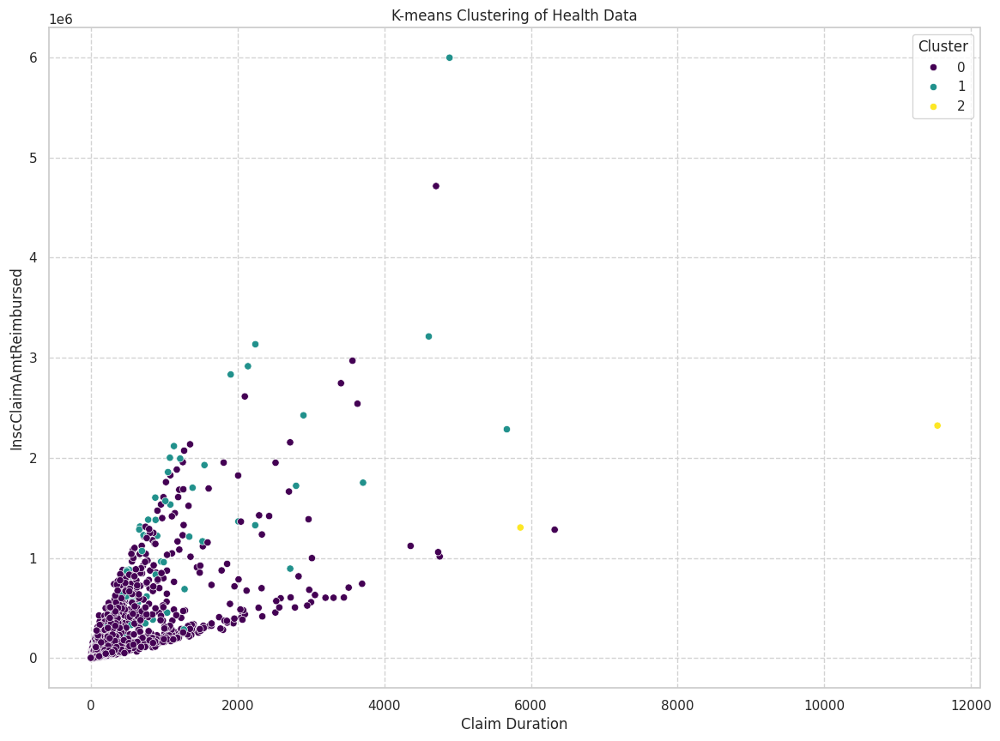

In [ ]:
# Visualize the clusters
plt.figure(figsize=(14, 10))
sns.scatterplot(x='Claim_Duration', y='InscClaimAmtReimbursed', hue='Cluster', data= X_df, palette='viridis')
plt.title('K-means Clustering of Health Data')
plt.xlabel('Claim Duration')
plt.ylabel('InscClaimAmtReimbursed')
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')

In [ ]:
print(X_df['Cluster'].unique())  # Check unique cluster labels


[0 1 2]


Number of data points in Cluster 2: 2


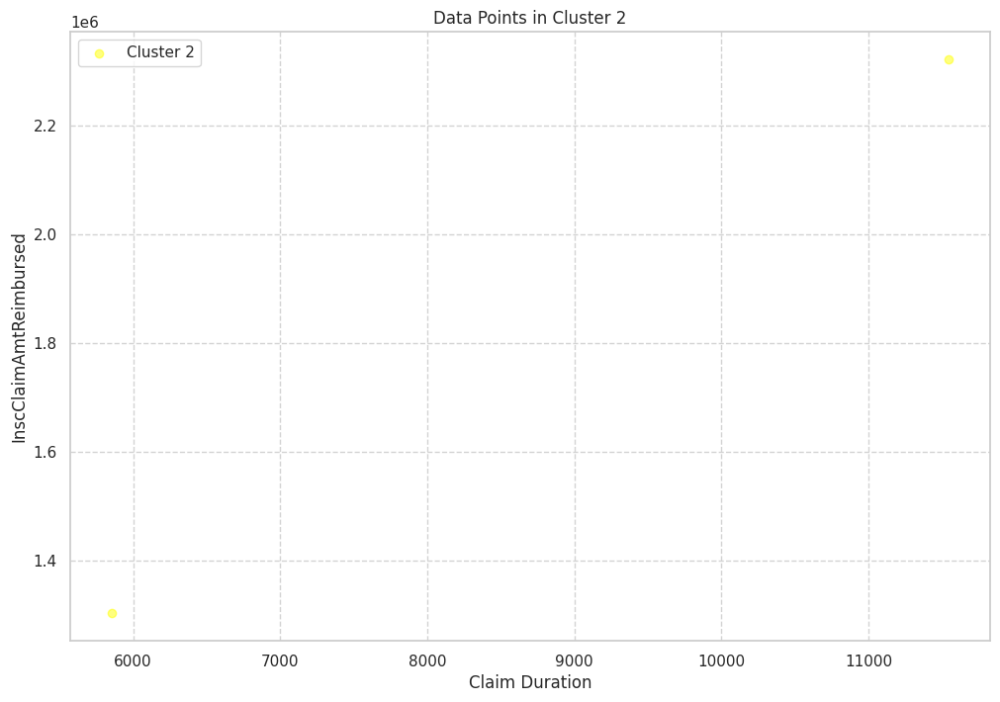

In [ ]:
cluster_2 = X_df[X_df['Cluster'] == 2]

print(f"Number of data points in Cluster 2: {len(cluster_2)}")

#plot clusters for label 2
plt.figure(figsize=(12, 8))
plt.scatter(cluster_2['Claim_Duration'], cluster_2['InscClaimAmtReimbursed'], label='Cluster 2', c='yellow', alpha=0.5)
plt.xlabel('Claim Duration')
plt.ylabel('InscClaimAmtReimbursed')
plt.title('Data Points in Cluster 2')
plt.legend()
plt.minorticks_on()
plt.grid(which='major', linestyle="--", color='lightgrey')

In [ ]:
cluster_1 = X_df[X_df['Cluster'] == 1]

print(f"Number of data points in Cluster 2: {len(cluster_1)}")


Number of data points in Cluster 2: 92


<Figure size 1400x1000 with 0 Axes>

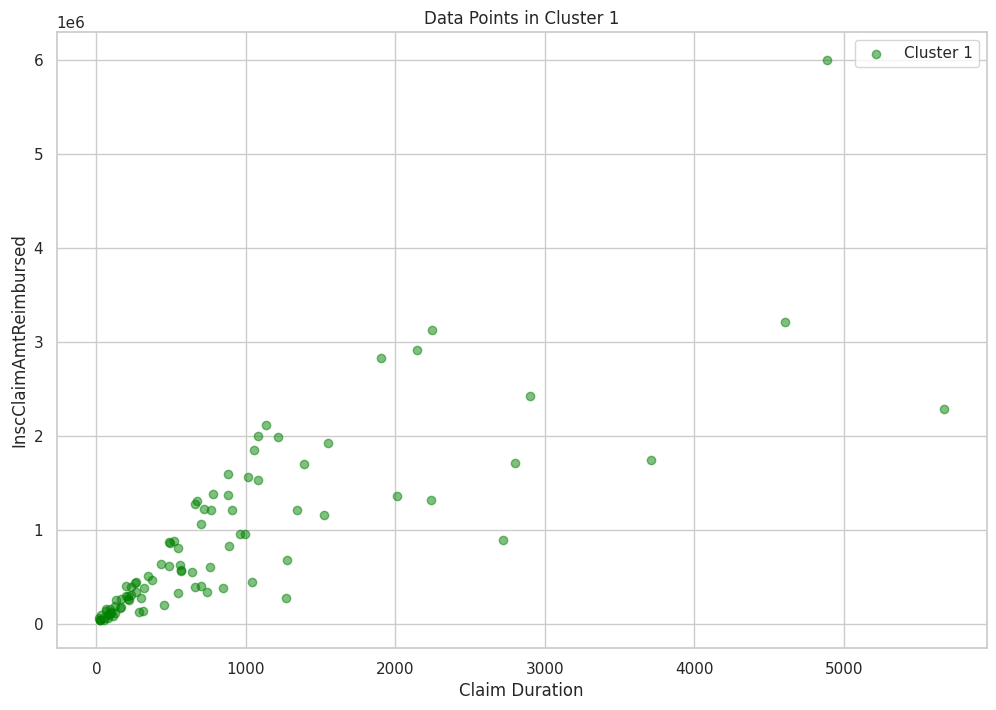

<Figure size 1400x1000 with 0 Axes>

In [ ]:
plt.figure(figsize=(12, 8))
plt.scatter(cluster_1['Claim_Duration'], cluster_1['InscClaimAmtReimbursed'], label='Cluster 1', c='green', alpha=0.5)
plt.xlabel('Claim Duration')
plt.ylabel('InscClaimAmtReimbursed')
plt.title('Data Points in Cluster 1')
plt.legend()
plt.figure(figsize=(14, 10))

Number of data points in Cluster 2: 5316


<Figure size 1400x1000 with 0 Axes>

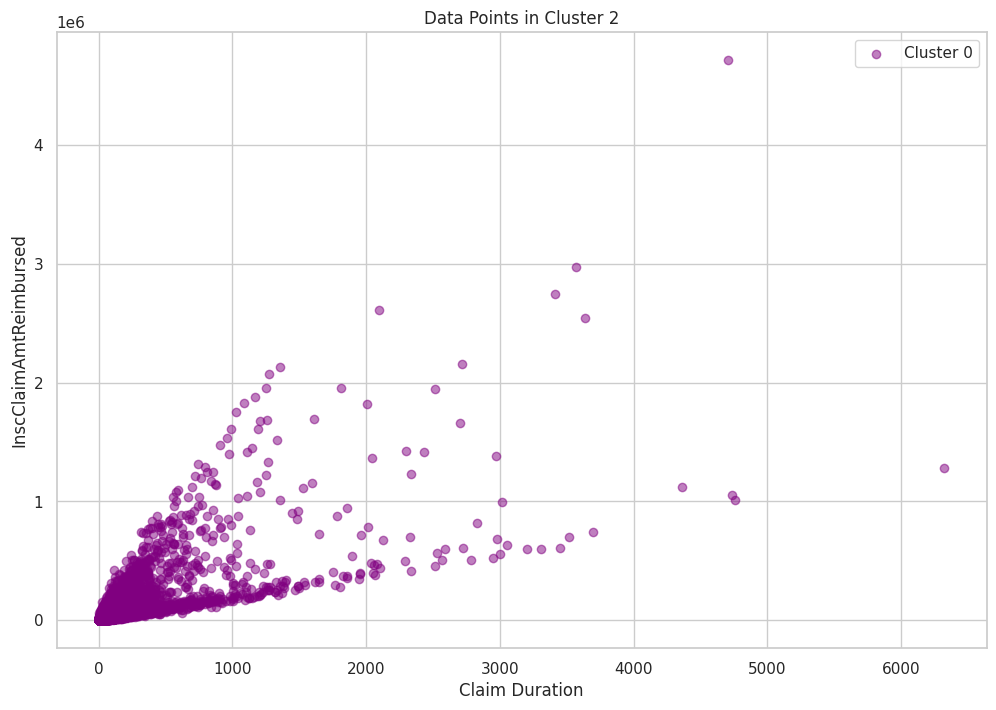

<Figure size 1400x1000 with 0 Axes>

In [ ]:
cluster_0 = X_df[X_df['Cluster'] == 0]

print(f"Number of data points in Cluster 2: {len(cluster_0)}")

#plot clusters for label 2
plt.figure(figsize=(12, 8))
plt.scatter(cluster_0['Claim_Duration'], cluster_0['InscClaimAmtReimbursed'], label='Cluster 0', c='purple', alpha=0.5)
plt.xlabel('Claim Duration')
plt.ylabel('InscClaimAmtReimbursed')
plt.title('Data Points in Cluster 2')
plt.legend()
plt.figure(figsize=(14, 10))